# Understanding GDP: A Data-Driven Exploration

GDP Predictor Project 

by Yarden Tamam and Kfir Ben Haim

# Table of Contents

- [Introduction](#Introduction)
    - [Data Acquisition](#Data-Acquisition)
    - [Strategy](#Strategy)
- [EDA (Exploratory Data Analysis)](#EDA-(Exploratory-Data-Analysis))
    - [Preliminary Evaluation](#Preliminary-Evaluation)
    - [Examination of numerical variables](#Examination-of-numerical-variables)
- [Feature Extraction](#Feature-Extraction)
    - [K-Means for Income Level Identification](#K-Means-for-Income-Level-Identification)
    - [Economic Indicators Analysis](#Economic-Indicators-Analysis)
- [Models Predictions](#Models-Predictions)
    - [XGBoost](#XGBoost)
    - [LightGBM](#LightGBM)
    - [Random Forest](#Random-Forest)
    - [CatBoost](#CatBoost)
    - [FBProphet Model](#FBProphet-Model)
    - [ARIMA Model](#ARIMA-Model)
    - [SARIMAX Model](#SARIMAX-Model)
- [NLP - Extracting Relationships Between Countries From News Headlines](#NLP---Extracting-Relationships-Between-Countries-From-News-Headlines)
    - [Extracting Country Pairs](#Extracting-Country-Pairs)
    - [Supervised Learning Approach](#Supervised-Learning-Approach)
    - [Hugging Face Models Approach](#Hugging-Face-Models-Approach)
    - [Comparison Between Different Approaches](#Comparison-Between-Different-Approaches)
    - [Spacy](#Spacy)
    - [Levenshtein Distance](#Levenshtein-Distance)
    - [Cosine Similarity](#Cosine-Similarity)

- [Research conclusion](#research-conclusion)


In [262]:
from IPython.display import YouTubeVideo
video_id = 'Uzi8N6n3AGw'

# Introduction

**Economic stability and growth**
are crucial elements for any nation's prosperity. A robust **gross domestic product (GDP)** is typically indicative of a sound economy, leading to higher standards of living, more job opportunities, and greater job creation. Therefore, estimating a nation's **GDP** is a crucial area of study since it can provide critical details about the state and future of that nation's economy.

Furthermore, there are wide ramifications for precise **GDP forecasting.** By assisting in the identification of possible economic obstacles, proactive steps to alleviate economic issues can be taken. Additionally, it can aid in the evaluation of a nation's **creditworthiness** and **financial stability** by international organizations and financial institutions, which in turn can affect the amount of loans extended and the choices made about investments.

<u>**Our purposal**</u>

We are embarking on an ambitious project aimed at predicting **GDP per capita** through comprehensive analysis of time series data spanning from **1950 to 2022.** Leveraging a plethora of diverse features believed to influence economic growth, we will employ advanced data science techniques to uncover insights and trends hidden within the data.

Our primary goal is to develop accurate predictive models that can forecast **GDP per capita** with precision. By examining the intricate relationships between various **socio-economic indicators** and GDP per capita over time, we aim to shed light on the underlying factors driving economic prosperity.

This project presents an exciting opportunity to unravel the complexities of **economic dynamics** and contribute to the field of **predictive analytics.** We invite you to join us on this journey as we endeavor to build a brighter future through data-driven insights.

This knowledge can be invaluable for **governments, policymakers, investors** and **economists** alike, as it allows for more informed decision-making in economic planning, resources allocation and investment strategies.

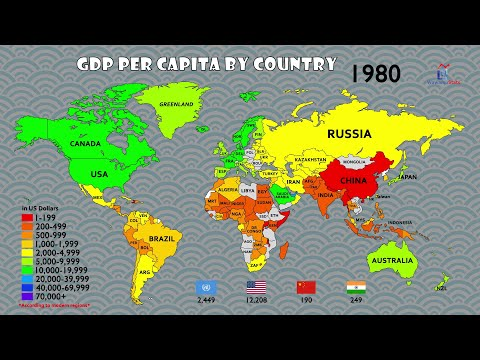

In [263]:
# credit to Source: World Bank & IMF and to wawamustats youtube channel
YouTubeVideo(video_id, width=560, height=315)

**Requirmenets**

In [ ]:
!pip install prophet
!pip install catboost
!pip install xgboost
!pip install xlrd
!pip install category_encoders
!pip install pandas
!pip install seaborn
!pip install matplotlib.pyplot
!pip install numpy
!pip install nltk
!pip install scipy
!pip install statsmodels
!pip install shap
!pip install fastbook
!pip install networkx
!pip install vaderSentiment
!pip install textblob
!pip install scikit-learn
!pip install python-Levenshtein
!pip install transformers

**Imports**

In [299]:
# For data manipulation and analysis
import pandas as pd
import numpy as np
import shap

# Natural Language Toolkit for natural language processing
import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer

# Natural Language Processing with spaCy
import spacy

# Sentiment analysis library
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# For text analysis
from textblob import TextBlob

# Transformers for NLP tasks
from transformers import pipeline, AutoModelForSequenceClassification, AutoTokenizer, BertModel, BertForSequenceClassification, AdamW

# Machine learning models
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier, KNeighborsRegressor
from sklearn.svm import SVC
from sklearn.cluster import KMeans, SpectralClustering, DBSCAN
from sklearn.preprocessing import LabelEncoder, MultiLabelBinarizer, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, classification_report, confusion_matrix, f1_score, silhouette_samples, silhouette_score
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, cross_val_score, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.multiclass import OneVsRestClassifier
from sklearn.decomposition import PCA

# XGBoost
import xgboost as xgb
from xgboost import XGBRegressor, DMatrix

import re
from nltk.stem import WordNetLemmatizer

# LightGBM
from lightgbm import LGBMRegressor

# CatBoost
from catboost import CatBoostRegressor

# Time series analysis
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose

# Prophet for forecasting
from prophet import Prophet

from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize 

# PyTorch for deep learning
import torch
import torch.nn as nn
from torch.optim import AdamW
from torch.utils.data import DataLoader, Dataset
from torch.nn.utils.rnn import pad_sequence

# Fastai library for deep learning
import fastbook
from fastbook import *
from fastai.tabular.all import *
from fastai.basics import *

# Data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

# Utility and miscellaneous
from itertools import product, combinations
import joblib
import json
import ast
import re
import math
from tabulate import tabulate
from Levenshtein import distance
from scipy.stats import pearsonr
from scipy.signal import find_peaks
from sklearn.metrics.pairwise import cosine_similarity
from numpy.linalg import norm
import warnings
from mpl_toolkits.mplot3d import Axes3D
import networkx as nx

# Category Encoders
import category_encoders as ce
from category_encoders import TargetEncoder

from transformers import BertTokenizer, BertForSequenceClassification

# Handling warnings
warnings.filterwarnings('ignore')

## Data Acquisition

In [47]:
# Import and read various CSV files into Pandas DataFrames for data analysis

health_expenditure = pd.read_csv("annual-healthcare-expenditure-per-capita.csv")
Fertility_rate = pd.read_csv("children-per-woman-UN.csv")
Literacy_rates = pd.read_csv("cross-country-literacy-rates.csv")
GDP_per_capita_growth_annual = pd.read_csv("gdp-per-capita-growth.csv")
Meat_consumption = pd.read_csv("meatconsumption.csv")
Cantril_ladder_score = pd.read_csv("happiness-cantril-ladder.csv")
Population_density = pd.read_csv("Populationdensity.csv")
Population = pd.read_csv("population.csv")
Median_age = pd.read_csv("median-age.csv")
Sex_ratio = pd.read_csv("sex-ratio-at-birth.csv") 
Urban_population = pd.read_csv("urban-and-rural-population.csv") 
suicide_rate = pd.read_csv("death-rate-from-suicides-gho.csv")
Under_five_mortality_rate = pd.read_csv("child-mortality-gdp-per-capita.csv")
Electoral_democracy_index = pd.read_csv("distribution-electoral-democracy-index-vdem.csv")
Unemployment = pd.read_csv("unemployment-rate.csv")
Literacy_rates = pd.read_csv("cross-country-literacy-rates.csv")
GDP_per_capita_2018 = pd.read_csv("gdp-per-capita-untill2018.csv")
GDP_per_capita_2021 = pd.read_csv("gdp-per-capita-worldbankuntil2021.csv")
Continent =  pd.read_csv("continents-according-to-our-world-in-data.csv")
share_employment_agriculture_industry_services = pd.read_csv("share-employment-agriculture-industry-services.csv")
share_of_the_world_population_with_at_least_basic_education = pd.read_csv("share-of-the-world-population-with-at-least-basic-education.csv")
world_data_gdp =  pd.read_excel("worlddatagdp.xls")

## Strategy

**Our journey** begins with a detailed examination of GDP per capita trends **using decomposition techniques (i.e., seasonal , residual etc...)** to uncover **underlying patterns and seasonalities in economic data**. We extend our analysis by employing **Principal Component Analysis (PCA) and K-Means clustering, utilizing the elbow and silhouette methods to discern distinct income levels.** This phase is crucial for identifying key features that represent economic status and growth potential of countries.

**To further** refine our feature set, **we incorporate rolling growth rates and growth volatility measures**, alongside **correlation analysis with peak GDP periods.** These steps are instrumental in **extracting nuanced economic indicators that serve as new features for subsequent modeling.** By prioritizing variance preservation, we aim to maintain the essence of our data while achieving dimensionality reduction, setting a solid foundation for model input preparation.

In preparation for modeling, we undertake meticulous data preprocessing. This includes **encoding categorical variables effectively**, **normalizing data to ensure uniform scale across features**, and **deploying techniques to manage time series data intricacies.** These preprocessing steps are pivotal in optimizing our dataset for machine learning algorithms, ensuring that the input data accurately reflects the economic phenomena under study.

We explore a **diverse array of machine learning models tailored to time series forecasting**, including **XGBoost**, **LightGBM**, **Random Forest**, **CatBoost**, **Prophet**, **ARIMA**, **SARIMA**, and **Exponential Boosting**. Each model offers unique advantages:

    Tree-based models like XGBoost, LightGBM, Random Forest, and CatBoost are renowned for handling non-linear data efficiently, crucial for capturing complex economic dynamics.
    Prophet excels in accommodating seasonality and holiday effects, offering intuitive forecasts for economic indicators.
    ARIMA and SARIMA models are classical approaches that provide robustness in capturing autoregressive and seasonal patterns in time series data.
    Exponential Boosting further refines the predictive power by emphasizing errors from previous iterations, enhancing forecast accuracy.

**This diverse model exploration enables us to compare and contrast different forecasting strengths, ultimately selecting models that best capture the intricacies of economic time series data.**

Venturing into **NLP**, we tackle the challenge of **extracting sentiment relationships between country pairs in news headlines.** **Our idea behind this exploration was that relationships between countries either in their own continent or with very economicly powerfull countries effect , in some way , their economic growth and by that their GDP.** This involves **analyzing headlines featuring multiple country pairs**, a task **complicated by the simple sentiment analsis methods we know** , and **we aim to show the wrong predictions those methods show us against our own more complicated analysis**. To accurately identify and extract country pairs, we employ a blend of algorithms, both one that we've created and models created based on hugging face models, recognizing that standard stemming and lemmatization techniques may fall short in some instances.

Our approach explores **spacy library techniquesand and cosine similarity among other methodologies to overcome the challenges presented by complex headline structures.** By documenting various strategies, including those not fully successful, we provide a comprehensive account of our efforts to tackle this NLP challenge, showcasing the iterative nature of our problem-solving process.

# EDA (Exploratory Data Analysis)

In this project, we are working with a comprehensive dataset compiled from various sources including worldbank.org, correlatesofwar.org, and Kaggle's dataset collection (kaggle.com/datasets/rmisra/news-category-dataset). This dataset is rich with features that we hypothesize could influence a country's GDP performance. Predominantly consisting of time series data, it covers a wide range of countries across the globe.
Our dataset includes the following features: 

- **Entity**
- **Year**
- **GDP per capita**
- **Health expenditure**
- **Fertility rate**
- **Literacy rates**
- **Annual GDP per capita growth**
- **Meat consumption**
- **Cantril ladder score**
- **Population density**
- **Population**
- **Median age**
- **Sex ratio**
- **Urban population**
- **Suicide rate**
- **Under-five mortality rate**
- **Electoral democracy index**
- **Unemployment**
- **Continent**
 
Most of these features are numerical, although some are categorical. For analytical purposes and model fitting, we have converted these categorical features into numerical formats. Furthermore, we have enriched our dataset by creating additional features through the application of **K means** , **NLP tools** and **Study of the financial landscape.** These enhancements were implemented during the feature extraction and feature engineering stages of our project.

Our **exploratory data analysis (EDA)** focuses on uncovering trends, patterns, and relationships within this data, particularly those influencing **GDP per capita**. This involves examining distributions, correlations, and temporal changes using a variety of visualizations and statistical analyses. Our approach is thorough and multifaceted, aiming to gain deep insights into the factors that drive economic performance on a global scale.

## Preliminary Evaluation

In this part of our project, we're prepping our **GDP (Gross Domestic Product)** data for analysis. First off, **renamed the "Data Source" column to "Entity"** for clarity. Then, we **dropped the first three rows** since they didn't fit our data structure.
Next up, we **got rid of the "World Development Indicators" column** if it was there, 'cause it wasn't helping us much. After that, we made sure all **column names were strings for consistency**.
We then **adjusted column names to reflect the years from 1960 to 2022**. This helps us understand the data's timeline better. After that, **melted the DataFrame** to tidy it up, focusing on **"Entity", "Year", and "GDP per capita" columns**
Lastly, we sorted the data by "Entity" and "Year" for better organization. Also, we **corrected some entity names for consistency** across the dataset. Overall, these steps set us up nicely for digging into GDP trends with a clean and organized dataset.

In [48]:
world_data_gdp.rename(columns={'Data Source': 'Entity'}, inplace=True)

# Droping the first 3 rows from the DataFrame due to the structre of the dataframe

world_data_gdp = world_data_gdp.drop(world_data_gdp.index[0:3])

# Droping the 'World Development Indicators' column.

if 'World Development Indicators' in world_data_gdp.columns:
    world_data_gdp.drop(columns=['World Development Indicators'], inplace=True)

# Converting all column names to string type

world_data_gdp.columns = world_data_gdp.columns.map(str)

# Correctly setting the range for renaming columns to years 1960 through 2022

# 'Unnamed: 4' (1960) to 'Unnamed: 66' (2022)

for i in range(4, 67):  
    world_data_gdp.rename(columns={f'Unnamed: {i}': str(1960 + i - 4)}, inplace=True)

# Melting the DataFrame to get 'Year' and 'GDP per capita' columns

world_data_gdp_melted = world_data_gdp.melt(id_vars=['Entity'], var_name='Year', value_name='GDP per capita')

# Sorting the DataFrame by 'Entity' and 'Year'

world_data_gdp_melted.sort_values(by=['Entity', 'Year'], inplace=True)

# changing certain names in the data frame to correct Entity names.

world_data_gdp['Entity'] = world_data_gdp['Entity'].replace('Yemen, Rep.', 'Yemen')
world_data_gdp

,Entity,Unnamed: 2,Unnamed: 3,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
3,Aruba,GDP per capita (current US$),NY.GDP.PCAP.CD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6283.001443,7567.253642,9274.514156,10767.396220,11638.733706,12850.215712,13657.670644,14970.152342,16675.278488,17140.433369,17375.225306,18713.425388,19742.316739,19833.826746,21026.167091,20911.192767,21375.269123,22050.589873,24105.524121,24978.221674,25832.925565,27665.299480,29011.639057,25740.770230,24452.588739,26043.156325,25611.175767,26514.868980,26940.264114,28419.264534,28449.712946,29329.081747,30918.483584,31902.809818,24008.127822,29127.759384,33300.838819
4,Africa Eastern and Southern,GDP per capita (current US$),NY.GDP.PCAP.CD,141.385955,144.342434,148.774835,157.047580,166.849791,177.769086,186.630486,199.559835,210.078097,229.711026,243.158263,258.700523,270.761172,345.573458,412.830995,426.300936,414.469756,447.927785,485.666382,560.175749,720.771507,729.912432,668.797687,692.732222,625.466636,506.816677,555.611326,655.891188,702.320061,725.869675,821.817304,865.255505,734.738293,710.176421,700.189236,766.165631,741.056263,762.894348,700.224696,673.520993,710.665706,631.595695,631.928282,818.121921,991.192169,1126.375948,1232.423412,1376.638778,1435.808451,1420.293773,1656.366272,1806.768778,1773.651568,1736.849038,1725.332959,1554.167299,1444.003514,1625.286236,1558.307482,1507.982881,1355.805923,1545.613215,1644.062829
5,Afghanistan,GDP per capita (current US$),NY.GDP.PCAP.CD,62.369375,62.443703,60.950364,82.021738,85.511073,105.243196,143.103233,167.165675,134.012768,134.250360,162.642175,166.224831,141.365322,149.744068,181.598776,194.669036,205.674097,232.778699,255.045622,284.755532,291.649791,311.853617,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,182.174037,199.643228,221.830531,254.115274,274.015394,376.318296,382.533804,453.387382,562.499219,608.738856,653.417479,638.733185,626.512930,566.881133,523.053012,526.140801,492.090632,497.741429,512.055098,355.777826,NaN
6,Africa Western and Central,GDP per capita (current US$),NY.GDP.PCAP.CD,107.053706,112.128417,117.814663,122.370114,130.700278,137.301801,143.012562,127.325268,128.366811,142.327523,193.576278,167.637045,198.403376,243.875530,330.078714,374.015474,439.832147,450.074086,477.194017,577.541556,709.848877,1299.911318,1120.594020,805.033534,649.025771,644.343875,578.865282,578.117585,555.926365,505.333080,589.165831,602.994289,562.362464,571.882781,579.701872,872.067327,1078.702831,1103.186661,1154.479523,523.224236,519.757395,532.272576,619.712652,697.851236,841.297352,1000.793722,1243.173889,1421.272934,1685.556069,1467.615875,1679.887830,1861.381068,1957.917784,2154.150832,2248.316255,1882.264038,1648.762676,1590.277754,1735.374911,1812.446822,1688.075575,1766.943618,1785.312219
7,Angola,GDP per capita (current US$),NY.GDP.PCAP.CD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,712.369763,643.439974,620.736572,623.909304,637.903551,758.088489,684.901344,756.427545,793.391428,892.340076,949.921356,850.556180,657.654640,466.679163,329.691784,398.120223,454.375004,516.127849,423.403332,387.689415,556.884244,527.464118,872.657638,982.805590,1254.696126,1900.723816,2597.963585,3121.348735,4081.717497,3123.698898,3586.663680,4608.155166,5083.826851,5061.349240,5011.984412,3217.339244,1809.709377,2439.374441,2540.508878,2191.347764,1450.905112,1927.474078,3000.444231
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

**In this part**, we're **merging two DataFrames** containing GDP per capita data for the years **2018 and 2021**. We're doing this by combining the data based on the entities and years, using an **outer join**.
After merging, we create a new '**GDP per capita**' column. We fill this column by choosing values from either 2021 or 2018, or averaging them if both exist for a particular entity and year.
Once we've got our new column, we **drop the original 'GDP per capita' columns** from the **2021 and 2018 DataFrames**. This helps us clean up our DataFrame and keep only the necessary information for our analysis.

In [49]:
# Merging two GDP per capita DataFrames for the years 2018 and 2021 using an outer join on 'Entity' and 'Year'

GDP_per_capita = pd.merge(
    GDP_per_capita_2021[['Entity', 'Year', 'GDP per capita']],
    GDP_per_capita_2018[['Entity', 'Year', 'GDP per capita']],
    on=['Entity', 'Year'],
    how='outer'
)
# Creating a new 'GDP per capita' column by taking values from either 2021 or 2018 or averaging them if both exist

GDP_per_capita['GDP per capita'] = GDP_per_capita.apply(
   lambda row: row['GDP per capita_x'] if pd.notnull(row['GDP per capita_x']) and pd.isnull(row['GDP per capita_y']) 
    else row['GDP per capita_y'] if pd.notnull(row['GDP per capita_y']) and pd.isnull(row['GDP per capita_x'])
    else (row['GDP per capita_x'] + row['GDP per capita_y']) / 2 if pd.notnull(row['GDP per capita_x']) and pd.notnull(row['GDP per capita_y'])
    else None,
    axis=1
)
# Dropping the original 'GDP per capita' columns from 2021 and 2018 DataFrames

GDP_per_capita.drop(['GDP per capita_x', 'GDP per capita_y'], axis=1, inplace=True)

We continue creating a **comprehensive dataset** by combining various data sources related to different aspects such as **GDP**, **health expenditure**, and **demographic indicators**. First, we make lists of all the **countries** in the world and the names of the **DataFrames** we want to merge. Then, we generate a list of all possible combinations of countries and years from 1950 to 2023.
We start with an initial **DataFrame** containing 'Entity' (country) and 'Year' columns. Next, we loop through each DataFrame and merge them **into our initial DataFrame based on 'Entity' and 'Year'**. We also incorporate information about the continent each country belongs to by merging it **into our final DataFrame**. Lastly, we save the merged dataset to a CSV file named 'merged_data.csv' for further analysis.

In [50]:
# Creating a list of all the countries in the world and a list of DataFrame names to be merged

countries = ['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi', "Cote d'Ivoire", 'Cape Verde', 'Cambodia', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czech Republic', 'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'Holy See', 'Hungary','hong kong', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya', 'Kiribati', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Latvia', 'Lebanon', 'Lesotho', 'Liberia', 'Libya', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali', 'Malta', 'Marshall Islands', 'Mauritania', 'Mauritius', 'Mexico', 'Micronesia', 'Moldova', 'Monaco', 'Mongolia', 'Montenegro', 'Morocco', 'Mozambique', 'Myanmar', 'Namibia', 'Nauru', 'Nepal', 'Netherlands', 'New Zealand', 'Nicaragua', 'Niger', 'Nigeria', 'North Korea', 'North Macedonia', 'Norway', 'Oman', 'Pakistan', 'Palau', 'Panama', 'Papua New Guinea', 'Paraguay', 'Peru', 'Philippines', 'Poland', 'Portugal', 'Qatar', 'Romania', 'Russia', 'Rwanda', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Samoa', 'San Marino', 'Sao Tome and Principe', 'Saudi Arabia', 'Senegal', 'Serbia', 'Seychelles', 'Sierra Leone', 'Singapore', 'Slovakia', 'Slovenia', 'Solomon Islands', 'Somalia', 'South Africa', 'South Korea', 'South Sudan', 'Spain', 'Sri Lanka', 'Sudan', 'Suriname', 'Sweden', 'Switzerland', 'Syria', 'Tajikistan', 'Tanzania', 'Thailand', 'Timor-Leste', 'Togo', 'Tonga', 'Trinidad and Tobago', 'Tunisia', 'Turkey', 'Turkmenistan', 'Tuvalu', 'Uganda', 'Ukraine', 'United Arab Emirates', 'United Kingdom', 'United States', 'Uruguay', 'Uzbekistan', 'Vanuatu', 'Venezuela', 'Vietnam', 'Yemen', 'Zambia', 'Zimbabwe']
dataframe_names = [
    'GDP_per_capita', 'health_expenditure', 'Fertility_rate','Literacy_rates','GDP_per_capita_growth_annual','Meat_consumption', 'Cantril_ladder_score', 'Population_density', 'Population', 'Median_age',
    'Sex_ratio', 'Urban_population', 'suicide_rate', 'Under_five_mortality_rate',
    'Electoral_democracy_index', 'Unemployment'
]

# List of DataFrames

Data_Frames = [GDP_per_capita, health_expenditure, Fertility_rate, Literacy_rates, GDP_per_capita_growth_annual, Meat_consumption, Cantril_ladder_score, Population_density, Population, Median_age, Sex_ratio, Urban_population, suicide_rate, Under_five_mortality_rate, Electoral_democracy_index, Unemployment, Literacy_rates]

# Creating a list of all possible combinations of countries and years from 1950 to 2023

all_combinations = list(product(countries, range(1950, 2024)))

# Creating an initial DataFrame with 'Entity' and 'Year' columns

merged_df = pd.DataFrame(all_combinations, columns=['Entity', 'Year'])

# Loop through DataFrame names and DataFrames to merge them into the initial DataFrame

for name, df in zip(dataframe_names, Data_Frames):
    df_copy = df.copy()
    column_name = name.replace("_", " ")
    merged_df = pd.merge(merged_df, df_copy[['Entity', 'Year',column_name]], on=['Entity', 'Year'], how = 'left')

# Merge the 'Continent' information into the final merged DataFrame

merged_df = pd.merge(merged_df, Continent[['Entity', 'Continent']], on='Entity', how='left')

# Save the merged DataFrame to a CSV file

merged_df.to_csv('merged_data.csv', index=False)

In [51]:
# Merging additional DataFrames containing employment and education data into the existing 'merged_df'

# Merging employment in agriculture data into 'merged_df'

merged_df = pd.merge(merged_df, 
                     share_employment_agriculture_industry_services[['Entity', 'Year', 'Employment in agriculture (% of total employment)', 'Employment in industry (% of total employment)', 'Employment in services (% of total employment)']], 
                     on=['Entity', 'Year'], 
                     how='left')

# Merging education data into 'merged_df'

merged_df = pd.merge(merged_df, 
                     share_of_the_world_population_with_at_least_basic_education[['Entity', 'Year', 'Share of population with no education','Share of population with at least some basic education']], 
                     on=['Entity', 'Year'], 
                     how='left')
merged_df

,Entity,Year,GDP per capita,health expenditure,Fertility rate,Literacy rates,GDP per capita growth annual,Meat consumption,Cantril ladder score,Population density,Population,Median age,Sex ratio,Urban population,suicide rate,Under five mortality rate,Electoral democracy index,Unemployment,Continent,Employment in agriculture (% of total employment),Employment in industry (% of total employment),Employment in services (% of total employment),Share of population with no education,Share of population with at least some basic education
0,Afghanistan,1950,1156.0000,NaN,7.2484,NaN,NaN,NaN,NaN,11.469058,7480464.0,18.4,104.9,NaN,NaN,NaN,0.099,NaN,Asia,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,1951,1170.0000,NaN,7.2596,NaN,NaN,NaN,NaN,11.608700,7571542.0,18.4,104.9,NaN,NaN,NaN,0.099,NaN,Asia,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,1952,1189.0000,NaN,7.2601,NaN,NaN,NaN,NaN,11.755875,7667534.0,18.4,104.9,NaN,NaN,NaN,0.087,NaN,Asia,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,1953,1240.0000,NaN,7.2662,NaN,NaN,NaN,NaN,11.904618,7764549.0,18.3,104.9,NaN,NaN,NaN,0.084,NaN,Asia,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,1954,1245.0000,NaN,7.2542,NaN,NaN,NaN,NaN,12.057540,7864289.0,18.3,104.9,NaN,NaN,NaN,0.078,NaN,Asia,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14425,Zimbabwe,2019,2203.3967,208.41232,3.5994,NaN,-8.177321,50.275642,3.2992,39.691370,15354606.0,17.7,102.3,4945719.0,23.6286,5.266589,0.293,4.833,Africa,66.19,6.57,27.24,NaN,NaN
14426,Zimbabwe,2020,1990.3195,NaN,3.5451,NaN,-9.670404,49.256416,3.1448,40.505787,15669663.0,17.9,102.4,5052214.0,NaN,5.176960,0.293,5.351,Africa,NaN,NaN,NaN,8.166135,91.83386
14427,Zimbabwe,2021,2115.1445,NaN,3.4908,NaN,6.271613,NaN,2.9951,41.342964,15993525.0,18.1,102.4,5166388.0,NaN,4.952197,0.291,5.174,Africa,NaN,NaN,NaN,NaN,NaN
14428,Zimbabwe,2022,NaN,NaN,NaN,NaN,NaN,NaN,3.2035,42.188286,NaN,NaN,NaN,NaN,NaN,NaN,0.285,NaN,Africa,NaN,NaN,NaN,NaN,NaN


**It's important to notice that some of the data came not fit to the present country names or some of it came not complete. 
Cleaning and filling data is crucial in data science for accurate analysis and modeling. It ensures that the data is consistent, complete, and free of errors or missing values. this is why we did some manual job along with the automatic recognition of missing values inside the dataset , in order to make sure that will make more informed decision and better outcomes in the next sections of our project.**

In [60]:
# Identifing rows in 'merged_df' where the 'Continent' column is null

null_gdp_continent_rows = merged_df[merged_df['Continent'].isnull()]

# Extracting unique country names from the rows with null continent values

unique_countries = null_gdp_continent_rows['Entity'].unique()

# Deleting countries that no longer exsist from merged_df

countries_to_delete = ['holy see']
merged_df = merged_df[~merged_df['Entity'].isin(countries_to_delete)].copy()

# Defining a dictionary to map specific countries to their corresponding continents

countries_to_map = {
    'czech republic': 'Europe',
    'hong kong': 'Asia',
    'micronesia': 'Oceania',
    'timor-leste': 'Asia'
}

# Updating the 'Continent' column in 'merged_df' based on the mapping

merged_df.loc[merged_df['Entity'].isin(countries_to_map.keys()), 'Continent'] = merged_df['Entity'].map(countries_to_map)

In [61]:
# Converting 'Year' column to the same data type in both DataFrames

merged_df['Year'] = merged_df['Year'].astype(str)
world_data_gdp_melted['Year'] = world_data_gdp_melted['Year'].astype(str)

# Converting the 'Entity' column to lowercase for consistency

merged_df['Entity'] = merged_df['Entity'].str.lower()
world_data_gdp_melted['Entity'] = world_data_gdp_melted['Entity'].str.lower()

# Performing a left merge to create a temporary DataFrame ('temp_df') with GDP per capita information

temp_df = pd.merge(merged_df, world_data_gdp_melted[['Entity', 'Year', 'GDP per capita']], on=['Entity', 'Year'], how='left')

# Updating the 'GDP per capita' column in 'merged_df' with values from 'temp_df' where available

merged_df['GDP per capita'] = merged_df['GDP per capita'].combine_first(temp_df['GDP per capita_y'])

# The 'GDP per capita' column in 'merged_df' is now updated with additional GDP per capita information


**Next up** We define a list of numeric columns that need processing. These include various indicators like GDP per capita, literacy rates, and employment percentages etc. For each numeric column, we convert the data to numeric type, dealing with any errors by replacing them with NaN values. To fill in missing values, we calculate median values for each column within each country (entity) and continent group. If there's a missing value for a specific entity, **we fill it in with the median value of that entity's data.** If there's still a missing value, **we use the median value of the respective continent's data.**
Once we've cleaned and imputed missing values, our dataset is ready for further analysis with reliable and consistent numeric data across all columns.

In [62]:
# Defining a list of numeric columns to be processed

numeric_columns = ['GDP per capita', 'health expenditure', 'Fertility rate','Employment in agriculture (% of total employment)','Employment in industry (% of total employment)','Employment in services (% of total employment)', 'Literacy rates','GDP per capita growth annual','Meat consumption', 'Cantril ladder score', 'Population density', 'Population', 'Median age',
    'Sex ratio', 'Urban population', 'suicide rate', 'Under five mortality rate',
    'Electoral democracy index', 'Unemployment', 'Share of population with no education','Share of population with at least some basic education']

# Loop through each numeric column for data cleaning and imputation

for col in numeric_columns:
    
    # Converting the column to numeric data type, coercing errors to NaN
    
    merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')
    
    # Calculating the median values for the same column within each entity and continent group
    
    entity_median = merged_df.groupby('Entity')[col].transform('median')
    continent_median = merged_df.groupby('Continent')[col].transform('median')
    
    # Filling missing values in the column with the respective entity and if there is no non null value then with respective to continent median
        
    merged_df[col] = merged_df[col].fillna(entity_median)
    merged_df[col] = merged_df[col].fillna(continent_median)

# The numeric columns in 'merged_df' have been cleaned and missing values have been imputed using medians

## Examination of numerical variables

Here We're visualizing the relationship between GDP per capita and various other numeric indicators, excluding GDP per capita itself.
First, we create a list of numeric columns excluding GDP per capita. Then, we loop through each column and generate scatterplots to depict their relationship with GDP per capita. Each scatterplot is color-coded by continent, allowing us to observe any potential patterns or correlations across different regions. These scatterplots provide a visual insight into how different socioeconomic factors correlate with GDP per capita, helping us understand how various indicators relate to economic prosperity across different continents.

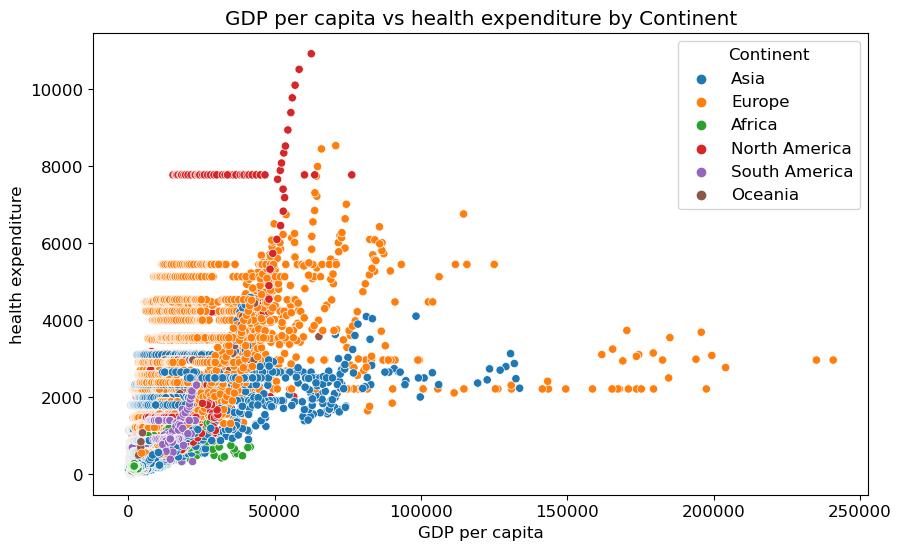

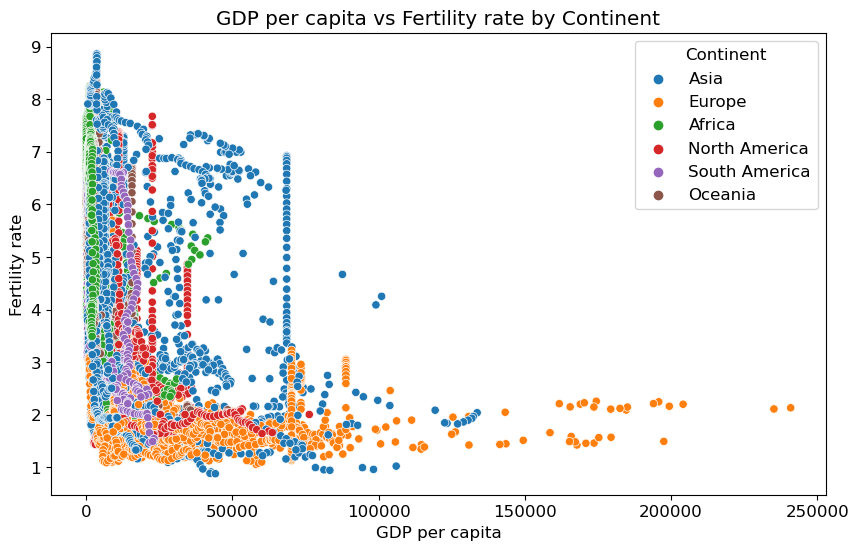

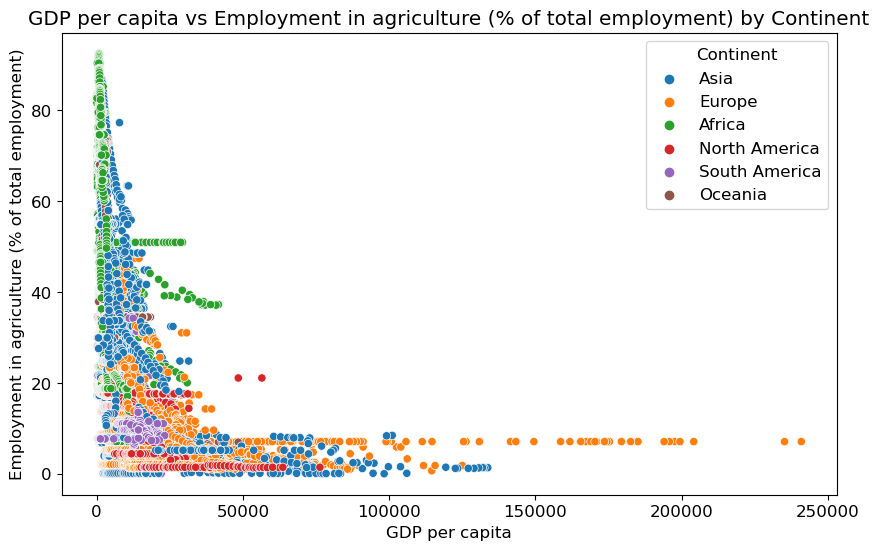

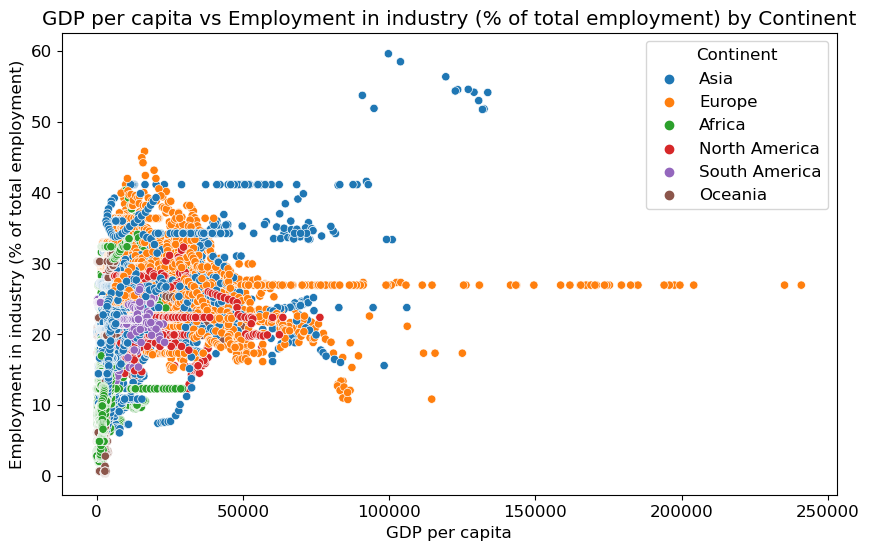

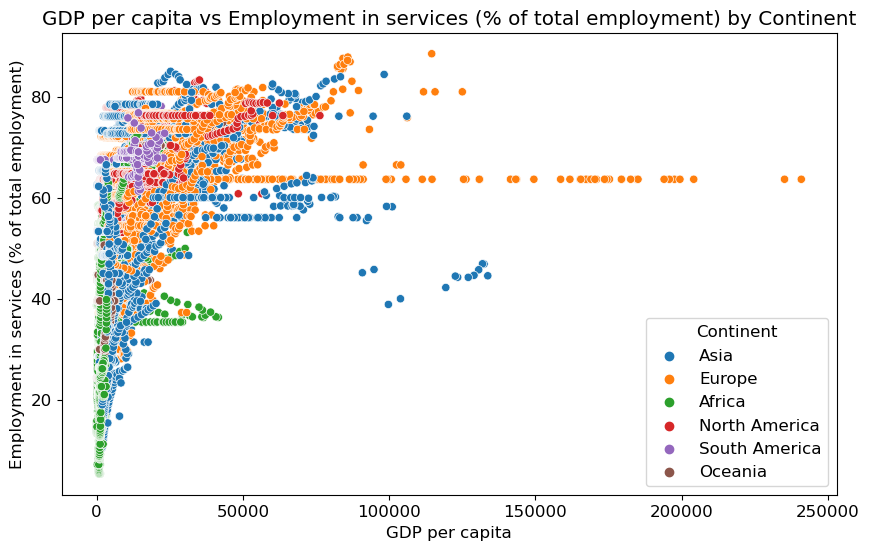

...

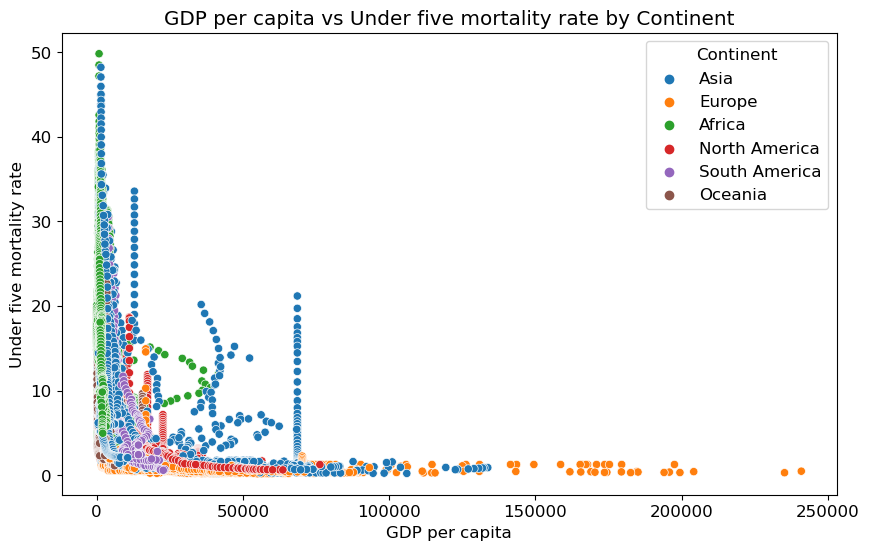

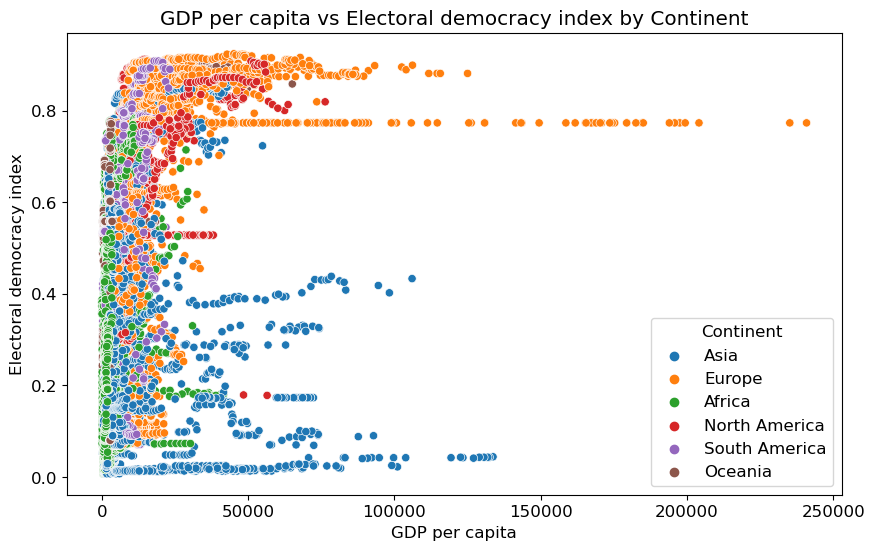

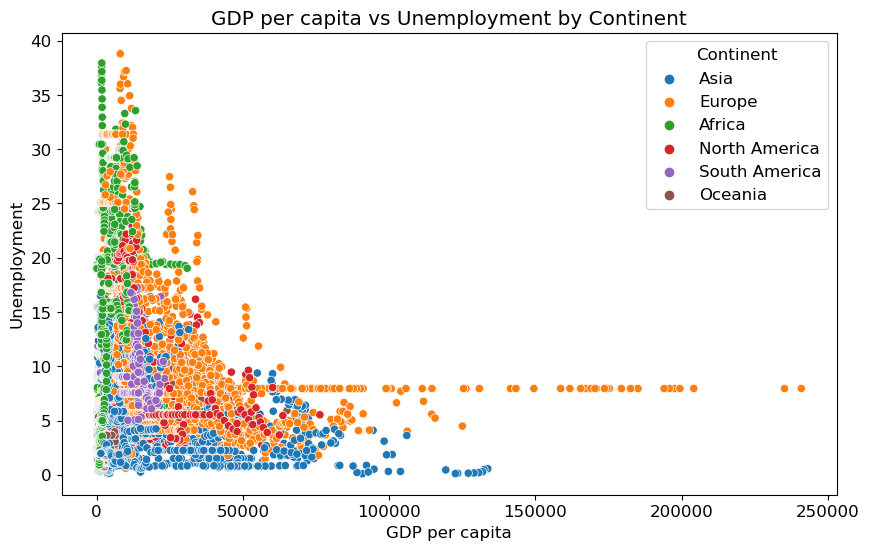

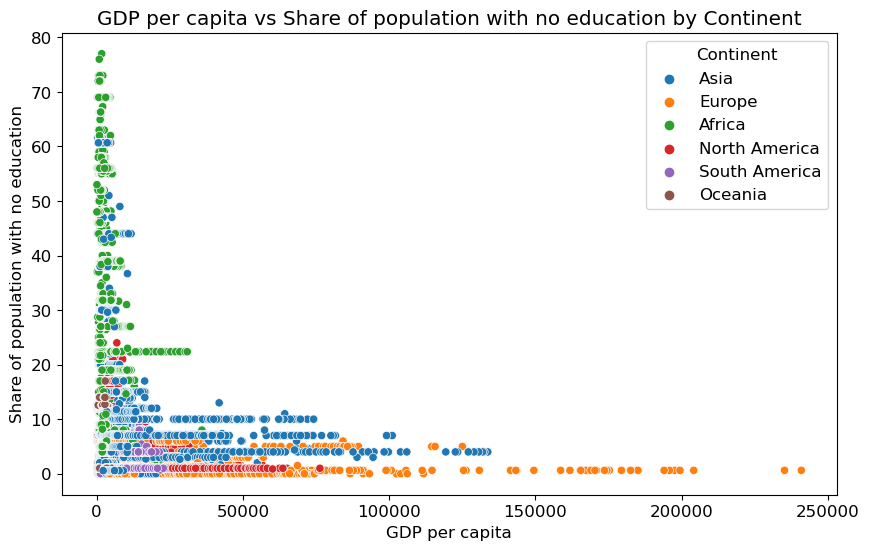

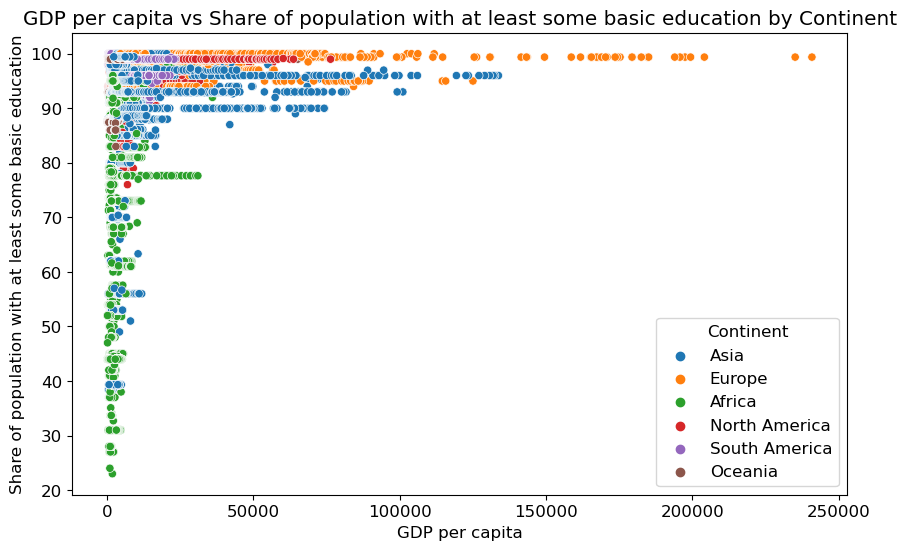

In [33]:
# Creating a list of numeric columns excluding 'GDP per capita'

numeric_column_No_GDP = [col for col in numeric_columns if col != 'GDP per capita']

# Generating scatterplots for each numeric column against 'GDP per capita' with colors representing continents

for col in numeric_column_No_GDP:
    plt.figure(figsize=(10, 6))
    
    # Creating a scatterplot for the current numeric column
    
    sns.scatterplot(data=merged_df, x='GDP per capita', y=col, hue='Continent')  
    plt.title(f'GDP per capita vs {col} by Continent')
    plt.legend(title='Continent')
    plt.show()

The analysis we've conducted reveals a complex interplay between various socio-economic factors and GDP per capita. Here's a summary and explanation of Our findings:

   **Positive Correlation between Health Expenditure and GDP per Capita:** Higher health spending often reflects better access to healthcare services, leading to a healthier workforce that can contribute more effectively to the economy.

   **Negative Correlation between GDP per Capita and Fertility Rates:** In wealthier societies, women tend to have more career opportunities and hence, may choose to have fewer children, balancing career and family life. In societies where GDP per capita is lower, health expenditure tends to be less (as we've seen), often leading to higher child mortality rates due to inadequate access to healthcare services and the inability of families to afford health insurance.

   **Negative Correlation between Employment in Agriculture and GDP per Capita:** A high proportion of agricultural employment often indicates a reliance on primary sector activities, which are generally less productive and offer lower wages than the secondary and tertiary sectors. As economies develop,We think they typically transition towards more industrial and service-oriented sectors, driving up GDP per capita.

  **Positive Correlation in Industry Sector Employment:** Industrial sector employment suggests a shift towards manufacturing and industrial activities, which are typically more productive and offer higher wages than agriculture, thus we think contributing positively to GDP per capita.

  **Positive Correlation in Services Sector Employment:** We think Developed countries often have a significant portion of their workforce in the services sector, including finance, technology, and healthcare, which are high-value industries contributing significantly to GDP per capita. In contrast, less developed countries may not have as developed a services sector, reflecting lower GDP per capita.

  **Positive Correlation between Literacy Rates and GDP per Capita:**  We think Higher literacy rates enable a population to pursue higher education and skilled employment, driving economic growth and, consequently, GDP per capita. This correlation is stronger in developed continents where access to education is more widespread.

  **Negative Correlation between GDP per Capita and GDP per Capita Growth Rate:** This sounds quite obvious where negative GDP per capita growth rate apears the GDP per capita declines and the other way around happens as well.

  **Positive Correlation between GDP per Capita and Meat Consumption:**  We think Meat consumption can be an indicator of a higher standard of living, as it suggests that people can afford more than just basic sustenance, contributing to higher GDP per capita.

  **Positive Correlation between GDP per Capita and Cantril Ladder Scores:** Higher GDP per capita often correlates with better life evaluation scores (Cantril Ladder), especially in developed countries. However, some poorer countries may also report high life satisfaction, indicating that GDP per capita is not the sole determinant of well-being.

  **Population Density's Mixed Impact:** While some dense areas may have high GDP per capita due to economic concentration, others, like in North America, may not follow this trend.

  **Mixed Impact between Median Age and GDP per Capita in Developed Countries:** As populations in richer nations get older, GDP growth slows, support costs rise, and government budgets feel pressure

An aging population and slower labor force growth affect economies in many ways—the growth of GDP slows, working-age people pay more to support the elderly, and public budgets strain under the burden of the higher total cost of health and retirement programs for old people.

Yet an aging population may raise the amount of capital per worker, which would boost wages and output per hour worked (productivity) and reduce interest rates as higher wages lower the return on capital. Alternatively, population aging and slowing labor force growth could lead to secular stagnation if firms are discouraged from investing abundant loanable funds. 

  **Negative Correlations with Sex Ratio, Urban Population, Suicide Rates, Under-Five Mortality Rate, and Unemployment:** These   factors are complex and can reflect a variety of socio-economic stresses in a society.
  
   **Sex Ratio:** The contribution of women to China’s economic growth and development cannot be overemphasized. Women play important social, economic, and productive roles in any economy. China remains one of the countries in the world with severe gender inequality and sex ratio at birth (SRB) imbalance.[Origin](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9645222/). which can explain why some dots of asia appear with no clear correlation between sex ration with gdp per capita.
A skewed sex ratio, particularly an excess of males over females, can have complex socio-economic implications. In some contexts, this imbalance can lead to increased social tensions and reduced family formation rates, which in turn can affect consumer behavior and economic growth patterns.  We think A balanced sex ratio is often indicative of gender equality, which contributes positively to economic development.

   **Urban Population:** While urbanization is generally associated with economic development,We think a negative correlation between urban population and GDP per capita might reflect rapid urbanization without adequate infrastructure and job creation. This can lead to overcrowded cities with high levels of unemployment and underemployment, straining public services and limiting economic growth.

  **Suicide Rates:** We think High suicide rates can be an indicator of underlying social and economic problems, such as unemployment, social isolation, and lack of access to mental health care. These issues not only affect individual well-being but also can indicate broader socio-economic challenges that impact a country's economic productivity and GDP per capita.

  **Under-Five Mortality Rate:** High rates of under-five mortality are often linked to poor health care, inadequate nutrition, and low levels of maternal education—all factors more prevalent in lower-income countries. This indicates not only immediate human and economic costs but also long-term impacts on workforce development and economic productivity, as healthier children are more likely to grow into more productive adults.

  **Unemployment:** We think High unemployment is directly linked to lower GDP per capita, as it represents underutilized labor potential within an economy. Beyond the immediate loss of output, high unemployment can lead to long-term economic scarring, including skill loss among workers and lower future income and consumption capacity, further depressing economic growth.

  **Education's Role:** The negative correlation of population with no education and the positive correlation of population with at least some basic education with GDP per Capita underscore the importance of education in economic development. Education fosters a skilled workforce capable of contributing to and driving economic growth.

  **Electoral Democracy's Varied Impact:** The difference in correlation between regions suggests that the relationship between democracy and economic performance is complex and influenced by regional dynamics, historical contexts, and governance quality.

**Our analysis**, based on cross-sectional data **without considering the time series component**, uncovers nuanced relationships between economic performance and various socio-economic indicators. It highlights how improvements in health, education, and transition towards industry and services are associated with higher GDP per capita , while also noting the complexities of demographic factors and the varied impact of governance structures across different regions.

**Next** we tought to visualize the **temporal trends** of various socioeconomic indicators across different continents and examining how they relate to GDP per capita.
We start by looping through each numeric column, representing different socioeconomic factors such as health expenditure, literacy rates, and employment percentages. For each column, we generate time series line plots to illustrate how these factors have evolved over the years.
The x-axis of each plot represents the years, spanning from 1970 to 2022. The y-axis represents the values of the specific socioeconomic indicator being analyzed. Each line on the plot corresponds to a different continent, allowing us to compare trends across continents.
The primary objective of these visualizations is to understand how changes in socioeconomic factors have influenced GDP per capita over time, and whether there are any discernible patterns or differences across continents.
By examining the temporal trends of these socioeconomic indicators in relation to GDP per capita, we aim to identify potential drivers of economic growth and development in different regions. This analysis provide valuable insights into the socioeconomic dynamics that contribute to variations in economic prosperity among countries and continents.

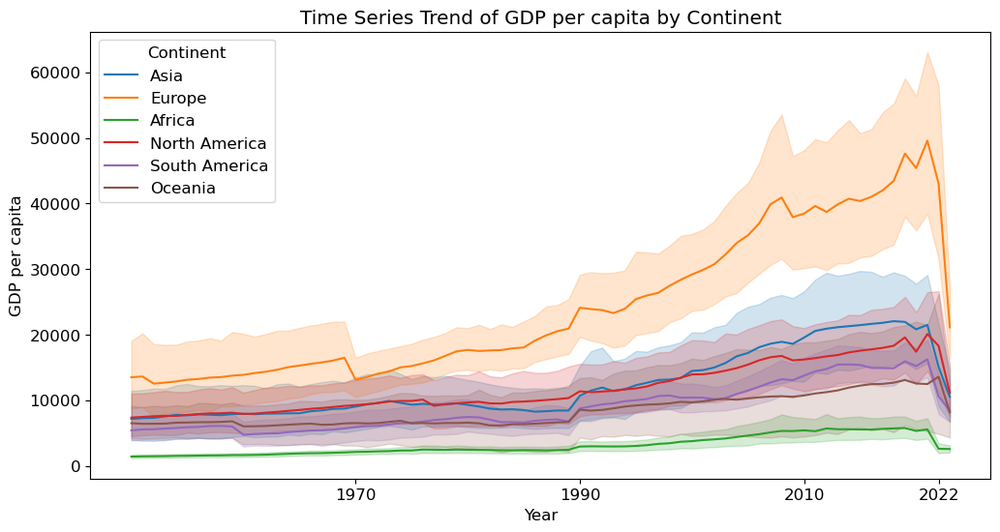

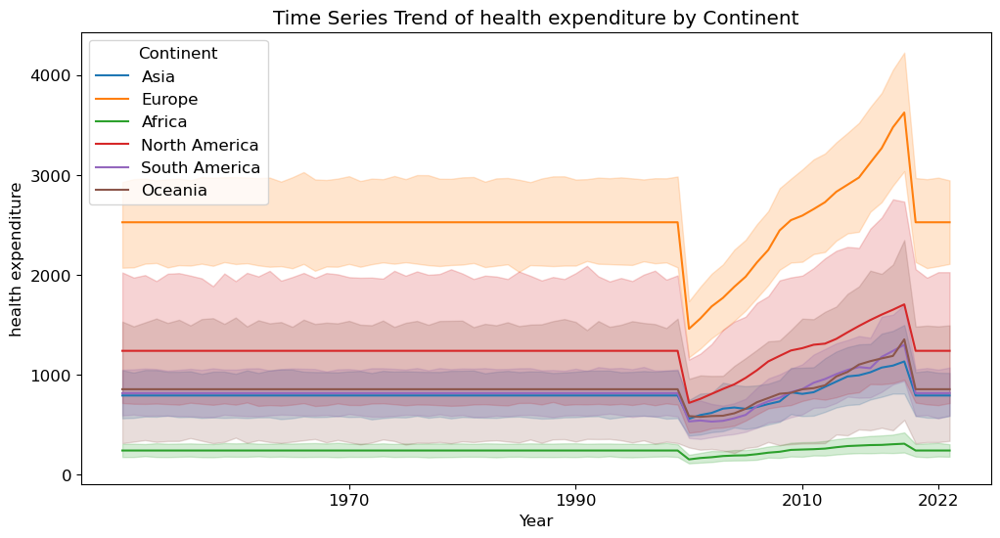

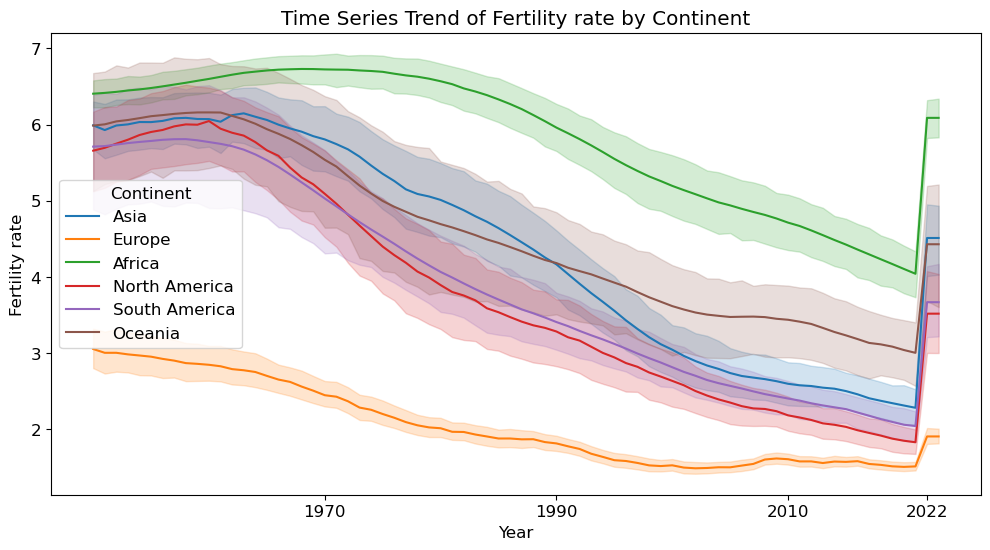

In [34]:
# Generating time series line plots for each numeric column by continent over the years

for col in numeric_columns[:3]:
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=merged_df, x='Year', y=col, hue='Continent')  # Replace 'Continent' if your column name is different
    plt.title(f'Time Series Trend of {col} by Continent')
    plt.legend(title='Continent')

    # Seting the x-axis to display only the years 1970, 1990, 2010, and 2022
    
    plt.xticks(['1970', '1990', '2010', '2022'])
    plt.show()

The time series analysis conducted has unveiled even more intriguing insights into the examination of GDP per capita.

**GDP per capita falls**
   **1970:**
        Oil Crisis Prelude (1973-1974): While not exactly in 1970, the closest major economic disruption around this time was    the 1973 oil crisis. It began in earnest in 1973, but the early 1970s saw the groundwork being laid with increasing oil prices and geopolitical tensions. This crisis led to stagflation (high inflation and high unemployment) in many countries, affecting economic growth and GDP per capita negatively.

   **1989:**
     Fall of Communism in Eastern Europe: The events of 1989, including the fall of the Berlin Wall and the beginning of the    collapse of communist regimes across Eastern Europe, led to significant political and economic upheaval. Transitioning from planned economies to market economies resulted in short- to medium-term economic downturns in many of these countries, affecting GDP per capita.
        Savings and Loan Crisis in the United States: Peaking in the late 1980s, this financial crisis affected the U.S. banking sector and contributed to a recession in the early 1990s, impacting economic growth and GDP per capita.

   **2008:**
        Global Financial Crisis: Triggered by the collapse of the housing bubble in the United States, the crisis rapidly spread through financial markets worldwide, leading to the Great Recession. It caused significant declines in GDP per capita across many countries due to high unemployment rates, reduced consumer spending, and tightened credit conditions.

   **2021:**
        COVID-19 Pandemic: Although the pandemic began in late 2019, its economic impacts were most severe in 2020 and continued into 2021, with many countries experiencing contractions in GDP per capita. The pandemic led to unprecedented global economic disruptions, including widespread lockdowns, supply chain issues, and shifts in consumer behavior, affecting nearly every sector of the economy.
  
**Fertility rates**
Between 1950 and 2023, fertility rates worldwide experienced a significant decline due to a combination of social, economic, and technological factors. Rapid industrialization and urbanization played crucial roles, as people moved from rural areas to cities in search of better employment opportunities, leading to changes in living conditions and family structures. Urban families often faced higher living costs and smaller living spaces, making larger families less feasible. Economic development and increased access to education, particularly for women, significantly influenced fertility rates. As women gained higher levels of education and more access to the workforce, their participation in labor markets increased, often leading to a preference for smaller families to balance work and child-rearing responsibilities. Additionally, advancements in healthcare and family planning technologies made contraception more accessible and reliable, allowing individuals and couples greater control over their fertility. Governments and international organizations also played a role, implementing policies and programs aimed at reducing fertility rates to manage population growth (china for example in 1996). These multifaceted changes transformed societal norms and individual preferences regarding family size, leading to a global decline in fertility rates over this period.

**Employment in agriculture**:
The agricultural population of the world has witnessed a steady but low rate of growth during the 1990s. While the world agricultural population in 1990 was approximately 2,438.283 million, by 2001 it reached 2,575.340 million, growing at an average of around 0.50 per cent a year. However though countries in the developed world and in Latin America witnessed a drop in the number of agricultural workers during 1990s, overall agricultural population in the world registered an increase primarily owing to more people joining this sector in Africa and Asia. The agricultural population in South Asia grew at 1.01 per cent a year between 1990 and 2001. The Indian agricultural workforce grew annually at 0.94 per cent, lower than the growth of the same in all South Asian countries taken together, but higher than the 0.54 per cent at which the agricultural workforce grew in all Asian developing countries taken together.

Even in countries where the growth of agricultural population has been positive, it has mostly lagged behind the rate of growth of its total population, or even lagged behind the rate of growth of its rural populace. [Origin](https://www.networkideas.org/news/jul2003/news11_Agricultural_Employment.htm)

Decrease in Agricultural Employment in 2021:

The decrease in agricultural employment by 2021 reflects long-term global trends:

   **Urbanization and Industrialization:** Continued urbanization has drawn labor away from agriculture towards jobs in services and industry, particularly in urban centers. This shift is part of the broader economic development process, where economies diversify away from agriculture as they grow. (Increase in industrial employment rate support our assumptions)

   **Technological Advancements and Productivity Gains:** Advances in agricultural technology, including automation, improved crop varieties, and farming practices, have significantly increased productivity. This means that less labor is required to produce the same amount of agricultural output, leading to a decrease in the proportion of the workforce needed in agriculture.

   **Global Supply Chains and Trade:** The integration of global markets and the rise of agribusiness have transformed agricultural practices, focusing on efficiency and specialization. This transformation has often led to a decline in smallholder farming and a reduced need for labor in agriculture.

   **Policy Shifts and Economic Reforms:** Many countries have implemented policies to encourage economic diversification and to move away from an overreliance on agriculture. These reforms have facilitated the shift of labor to more productive sectors.

   **COVID-19 Pandemic Impacts:** The pandemic has accelerated some of these trends, with disruptions to traditional labor markets and an increased focus on technology and efficiency.
   
**It's worth mentioning regarding employments in 1990-1991 :** 

The early 1990s, particularly around 1990-91, were characterized by a global economic downturn that had significant impacts on employment rates across various sectors, including agriculture. This period was marked by a constellation of adverse events and trends that together contributed to a challenging economic environment:

   **Postwar Recession:** The term "postwar recession" typically refers to the economic downturns that follow the end of major conflicts. Although the late 1980s and early 1990s did not immediately follow a global conflict akin to the World Wars, the term could loosely apply to the economic adjustments following the end of the Cold War era. The dissolution of the Soviet Union and the Warsaw Pact led to significant geopolitical shifts and economic uncertainties.

   **Persian Gulf Crisis (1990-1991):** The Persian Gulf War, following Iraq's invasion of Kuwait in August 1990, led to a short but intense period of military conflict that had broader economic implications. The crisis caused a spike in oil prices and contributed to economic uncertainty, affecting global markets and leading to increased costs for transportation and production, impacting various sectors differently.

  **Savings and Loan Crisis:** The savings and loan (S&L) crisis was a significant financial disaster in the United States that peaked in the late 1980s and early 1990s. The collapse of numerous savings and loan institutions due to risky investment practices led to a financial crisis that required a large-scale government bailout. The resulting instability in the financial sector contributed to a tighter credit environment, affecting businesses and consumers alike and leading to cutbacks in investment and employment across various sectors.

  **Lower Defense Spending:** The end of the Cold War led to a reduction in defense spending by the United States and other countries. This "peace dividend" meant that resources previously allocated to defense could be redirected to other areas of the economy. However, in the short term, the cutbacks in defense spending led to job losses in industries related to defense and military production, affecting regions and communities dependent on these sectors.
  
**Median age:** 
    over the years we can clearly see that developed continents like europe and north america have higher median age probably due to the fact that fertility rates have declined.
    
**Suicide rate:**
    we think that the crisis that happened in 2000 in the world contirubte to the Suicde rate increase all over the world in that year.
    
**under five mortality rates**:
The increase in 1960 can be attributed to a combination of factors, reflecting the global health and socio-economic conditions of the time. These factors include:

  **Limited Access to Healthcare:** In 1960, many regions, especially in developing countries, had limited access to healthcare facilities and services. This lack of access meant that many people did not receive the medical care needed for preventable or treatable conditions.

  **Infectious Diseases:** Infectious diseases were a major cause of death globally in 1960. Vaccination programs and effective treatments for diseases like measles, malaria, tuberculosis, and polio were not as widespread or accessible as they are today. This led to higher mortality rates, particularly among children and in regions with limited healthcare infrastructure.

  **Poor Nutrition and Food Security:** Many areas of the world faced issues related to malnutrition and inadequate food supply in 1960. Poor nutrition not only directly contributed to mortality but also made individuals more susceptible to diseases.

  **Lack of Clean Water and Sanitation:** Access to clean water and proper sanitation facilities was limited in many parts of the world in 1960. This contributed to the spread of waterborne diseases such as cholera and dysentery, leading to higher mortality rates.
  
**The Cantril Ladder**
An increase in the Cantril Ladder index globally around 1990 can be attributed to several key developments and global trends:

  **End of the Cold War:** The late 1980s and early 1990s marked the end of the Cold War, leading to significant geopolitical changes, including the fall of the Berlin Wall in 1989 and the subsequent dissolution of the Soviet Union in 1991. These events ended decades of geopolitical tensions and opened up new opportunities for economic growth and political freedom in many countries, contributing to increased optimism and life satisfaction.

  **Economic Growth:** This period was characterized by significant economic growth in many parts of the world. The global economy benefited from advancements in technology, the beginning of the digital age, and increased trade liberalization, which led to improved standards of living for many people.

In this section, we're visualizing the distribution of various socioeconomic indicators across continents for selected years.
The frequency represents the number of countries or observations falling within a particular feature range for each continent.
For example, if the histogram bin represents a GDP per capita range of $10,000  to  $20,000, the frequency indicates how many countries on each continent have GDP per capita values within that range.

we expect these things to happen - 

# GDP per capita:
We may expect a positively skewed distribution, with some countries having significantly higher GDP per capita than others.
Developed continents like Europe and North America might have higher mean GDP per capita values compared to less developed continents like Africa.

# Health expenditure:
The distribution may vary depending on factors such as healthcare accessibility and government spending.
Developed continents might exhibit higher average health expenditure per capita compared to developing ones.

# Fertility rate:
We might observe a bimodal distribution, with some countries having high fertility rates due to cultural or socio-economic factors, while others have lower rates due to urbanization and education.

# Employment in agriculture/industry/services (% of total employment):
These distributions could vary widely among continents.
Developing continents might show higher percentages of employment in agriculture, while developed continents may have higher percentages in services.

# Literacy rates:
We may expect a positively skewed distribution with most countries having relatively high literacy rates.
Developed continents could exhibit higher mean literacy rates compared to developing ones.

# GDP per capita growth annual:
We might observe a distribution centered around zero, with fluctuations reflecting economic growth or recession periods.

# Meat consumption:
The distribution could vary depending on cultural dietary habits and economic factors.
Developed continents might have higher average meat consumption per capita compared to developing ones.

# Cantril ladder score:
We might expect a distribution clustered around the middle values, reflecting general life satisfaction across countries.

# Population density:
The distribution might vary widely, with some continents having high population densities due to urbanization and limited land availability.

# Population:
We may observe a right-skewed distribution, with a few countries having very high populations compared to others.

# Median age:
The distribution could vary, with developed continents possibly having higher median ages due to lower birth rates and longer life expectancies.

# Sex ratio:
The distribution might vary, with some countries showing skewed ratios due to cultural preferences or historical factors.

# Urban population:
We might expect a positively skewed distribution, with more developed continents having higher proportions of urban populations.

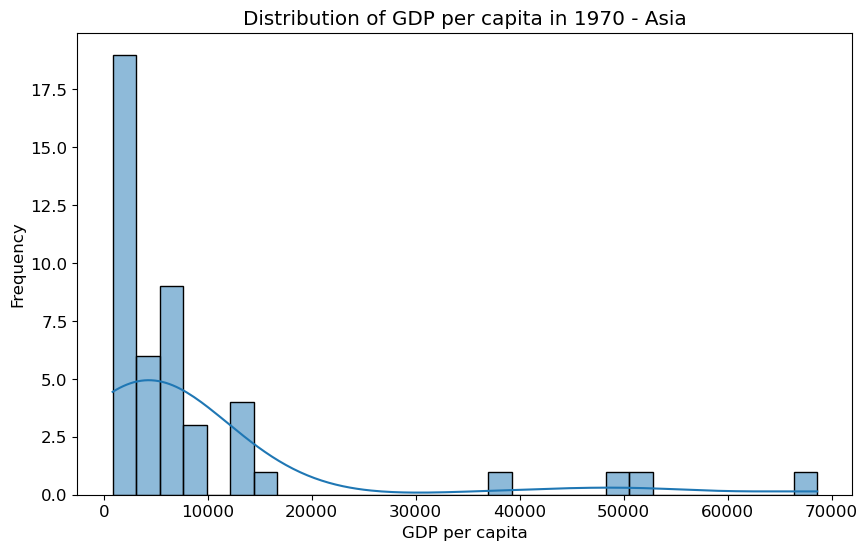

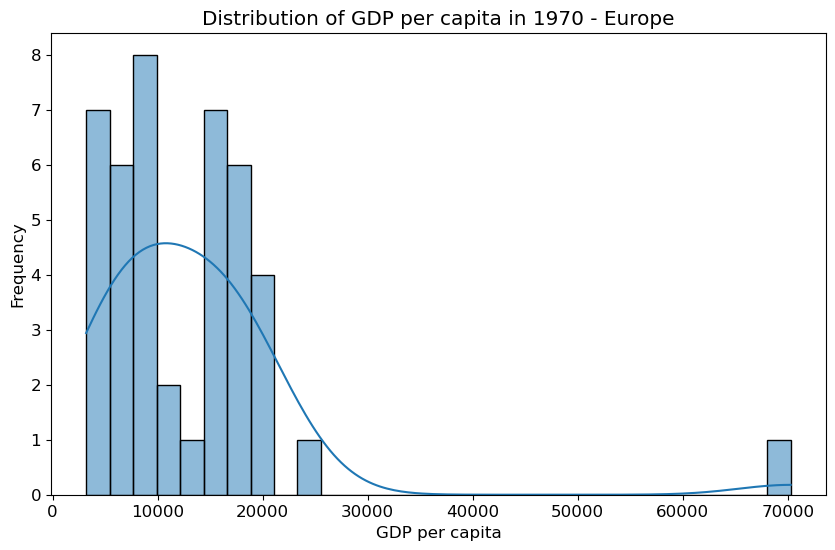

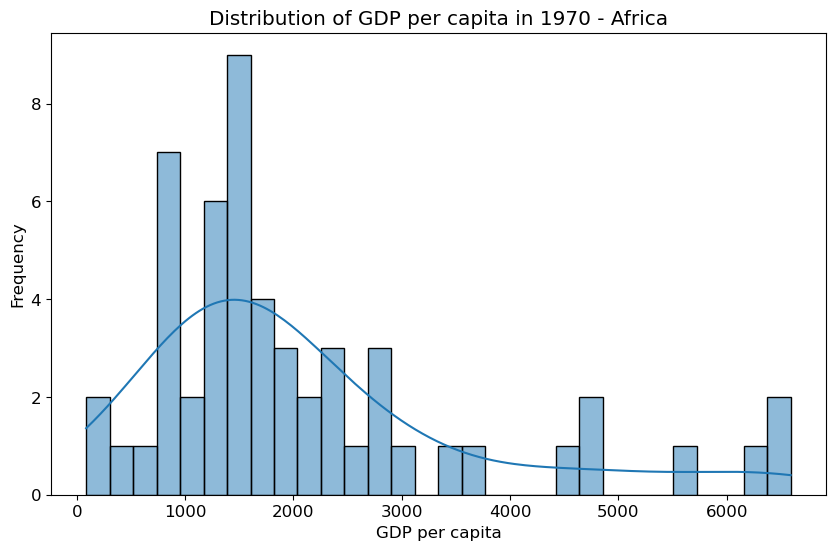

In [35]:
# Defining the selected years and unique continents

plot_counter = 0

selected_years = ['1970', '1990', '2010', '2022']

continents = merged_df['Continent'].unique()

for year in selected_years:
    for feature in numeric_columns:
        for continent in continents:
            
            # Filtering the data for the specific year and continent
            
            data_for_year_continent = merged_df[(merged_df['Year'] == year) & (merged_df['Continent'] == continent)]
            
            # Creating a histogram for each feature, year, and continent
            
            plt.figure(figsize=(10, 6))
            sns.histplot(data_for_year_continent[feature], kde=True, bins=30)
            plt.title(f'Distribution of {feature} in {year} - {continent}')
            plt.xlabel(feature)
            plt.ylabel('Frequency')
            plt.show()
            plot_counter += 1
            
            if plot_counter >= 3:
                break
        if plot_counter >= 3:
            break
    if plot_counter >= 3:
        break

**Key Differences in the visualization of continent gdp per capita trends and this analysis:**

   **Depth of Insights:** While trend analysis of continents provides a macro-level view of economic direction, a comprehensive analysis including seasonal and residual components for each country offers a more granular understanding of the factors affecting economic performance. we can understand if there are countries which affect more on the Continent downward or upward target variable or other features.
   **Policy Relevance:** Trend analysis is crucial for long-term planning and strategic direction, but understanding seasonal and residual variations is essential for short-term policy interventions and managing economic volatility.
   **Analytical Complexity:** Trend analysis is relatively straightforward and focuses on long-term movements, whereas comprehensive analysis requires more sophisticated statistical techniques to dissect and interpret the data fully.


# Understanding GDP Per Capita Trends for different countries: 
By decomposing the GDP per capita data into its trend component, we aim to identify the long-term patterns or trends in economic growth for each continent. This helps us understand whether the GDP per capita is increasing, decreasing, or remaining stable over time.

# Identifying Seasonal Patterns: 
The seasonal component reveals recurring patterns or fluctuations in GDP per capita that occur within a specific time frame, such as yearly, quarterly, or monthly cycles. By examining these seasonal patterns, we can gain insights into how economic activity varies seasonally within each continent, potentially due to factors like agricultural cycles, holiday seasons, or weather patterns.

# Analyzing Residual Variations:
The residual component represents the irregular or unpredictable variations in GDP per capita data that cannot be explained by the trend or seasonal patterns. Analyzing the residual component helps us identify unusual events, shocks, or outliers that may impact economic performance within each continent, providing insights into economic volatility or unexpected changes.

# Expected Outcomes:

We might expect to observe consistent upward or downward trends in GDP per capita for certain countries, indicating sustained economic growth or decline over time.
Seasonal patterns may reveal cyclicality in economic activity, such as higher GDP per capita during certain years due to seasonal events.
Residual variations may highlight unexpected economic shocks or events impacting GDP per capita within each country, providing valuable insights into economic resilience and vulnerability.
Overall, this analysis enables us to gain a comprehensive understanding of the underlying drivers of economic performance within each country and identify patterns, trends, and anomalies that can inform economic policies, strategic planning, and decision-making at regional and global levels.

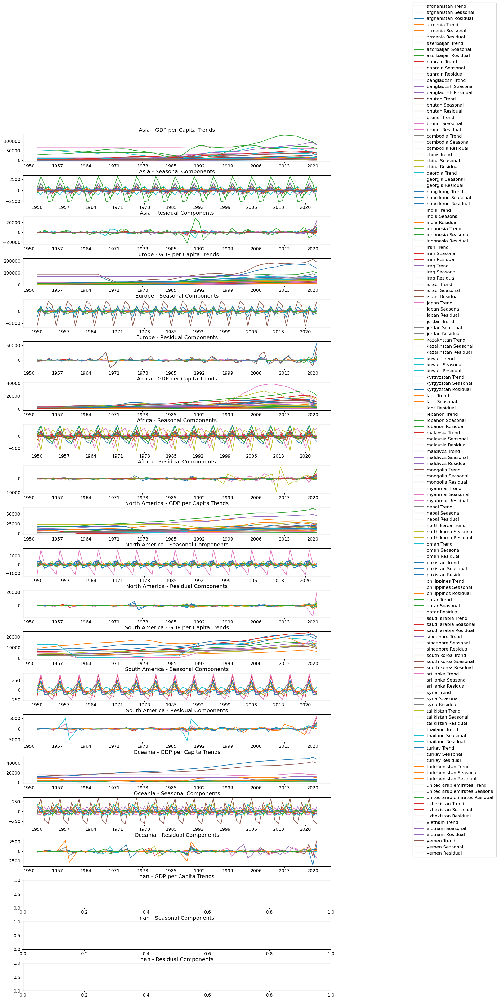

In [36]:
# Extracting the Continent names from merged_df
continents = merged_df['Continent'].unique()

# Calculate the total number of rows needed for the subplots

# One row per component, per continent (excluding the empty plot)

nrows = len(continents) * 3 

# Adjust figure height for readability

fig_height = nrows * 2  
fig, axes = plt.subplots(nrows=nrows, ncols=1, figsize=(15, fig_height))

# Iterator for axes index

current_ax = 0

# Lists to store legend elements and labels for each continent

all_legend_elements = []
all_legend_labels = []

for continent in continents:
    entities = merged_df[merged_df['Continent'] == continent]['Entity'].unique()
    
    # To store legend elements for each continent
    
    legend_elements = []  
    
    # To store legend labels for each continent
    
    legend_labels = []    

    for entity in entities:
        entity_data = merged_df[(merged_df['Continent'] == continent) & (merged_df['Entity'] == entity)]
        entity_data = entity_data.dropna(subset=['Year', 'GDP per capita']).sort_values('Year')

        if not entity_data.empty:
            gdp_series = entity_data.set_index('Year')['GDP per capita'].fillna(method='ffill')

            if len(gdp_series) > 2:
                decomposition = seasonal_decompose(gdp_series, model='additive', period=5)

                # Plotting each component
                
                axes[current_ax].plot(decomposition.trend.index, decomposition.trend, label=f"{entity} Trend")
                axes[current_ax + 1].plot(decomposition.seasonal.index, decomposition.seasonal, label=f"{entity} Seasonal")
                axes[current_ax + 2].plot(decomposition.resid.index, decomposition.resid, label=f"{entity} Residual")

                # Collecting legend elements and labels for each continent
                
                legend_elements.extend(axes[current_ax].lines[-1:])
                legend_labels.append(f"{entity} Trend")
                legend_elements.extend(axes[current_ax + 1].lines[-1:])
                legend_labels.append(f"{entity} Seasonal")
                legend_elements.extend(axes[current_ax + 2].lines[-1:])
                legend_labels.append(f"{entity} Residual")

                # Setting x-axis ticks to show only a subset of years for each subplot
                
                years = np.sort(entity_data['Year'].unique())
                
                # Calculating step to show approximately 10 ticks
                
                step = max(len(years) // 10, 1)  
                
                for ax in [axes[current_ax], axes[current_ax + 1], axes[current_ax + 2]]:
                    ax.set_xticks(years[::step])

    # Setting titles
    
    axes[current_ax].set_title(f'{continent} - GDP per Capita Trends')
    axes[current_ax + 1].set_title(f'{continent} - Seasonal Components')
    axes[current_ax + 2].set_title(f'{continent} - Residual Components')

    # Storing legend elements and labels for all continents
    
    all_legend_elements.append(legend_elements)
    all_legend_labels.append(legend_labels)

    # Moving to the next set of axes for the next continent
    
    current_ax += 3

# Adjusting layout to add space between subplots

fig.subplots_adjust(hspace=0.5)

# Adding legend outside of the subplots

fig.legend(all_legend_elements[0], all_legend_labels[0], loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()



**Enhanced Data Representation**

   **Multi-dimensional Relationships:** 3D plots allow you to simultaneously visualize the relationship between two features and how this relationship evolves over time. This can be invaluable for identifying patterns, trends, and correlations that are not apparent in 2D plots.

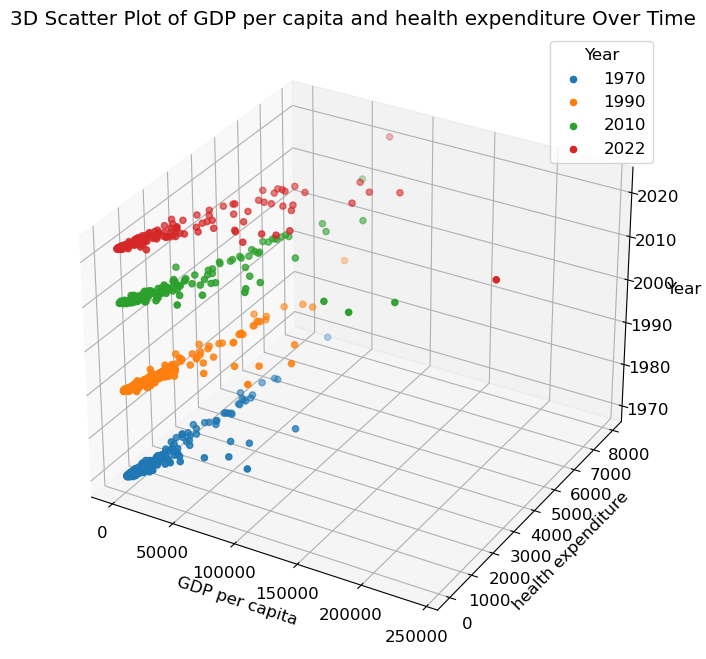

In [37]:
selected_years = [1970, 1990, 2010, 2022]

# Assuming 'Year' is already in numeric format or converting it

merged_df['Year'] = pd.to_numeric(merged_df['Year'])

# Filter the DataFrame for the selected years

filtered_df = merged_df[merged_df['Year'].isin(selected_years)]

# Limiting the loop to generate only the first 3D scatter plot

for i in range(len(numeric_columns)):
    for j in range(i+1, len(numeric_columns)):
        column1 = numeric_columns[i]
        column2 = numeric_columns[j]

        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')

        for year in selected_years:
            data_for_year = filtered_df[filtered_df['Year'] == year]
            data_for_year = data_for_year.dropna(subset=[column1, column2])

            if not data_for_year.empty:
                ax.scatter(data_for_year[column1], data_for_year[column2], zs=year, label=str(year))

        ax.set_xlabel(column1)
        ax.set_ylabel(column2)
        ax.set_zlabel('Year')
        ax.legend(title='Year')
        ax.set_title(f'3D Scatter Plot of {column1} and {column2} Over Time')
        plt.show()
        break  
        
    if i < len(numeric_columns) - 1:  
        break

Creating stacked histograms with different colors representing each year, offers a unique and insightful way to visualize and understand our data's distribution over time. This visualization technique can provide several key insights that might not be as apparent in other types of plots:

**Insight into Temporal Distribution Changes:**

   **Evolving Trends:** Stacked histograms allow us to see how the distribution of a particular variable changes over time. For example, if the variable represents some aspect of economic performance, we can observe how shifts in economic policy, global economic conditions, or other external factors influence this performance across different years.
   **Shifts in Central Tendency:** By examining the height and position of each color (year) within the stack, we can infer changes in the mean or median of the data over time. A noticeable shift towards higher or lower values can indicate a trend of increase or decrease in the measured attribute.

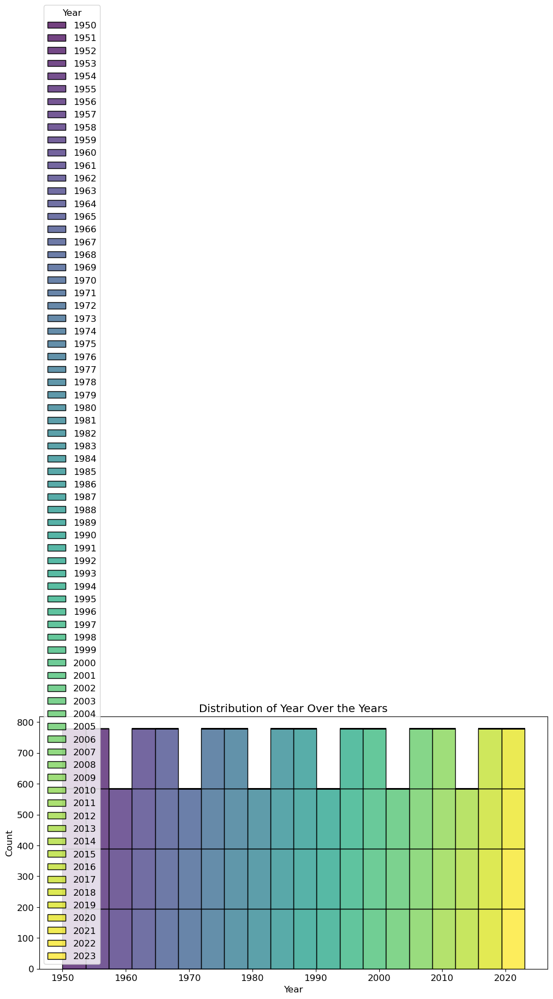

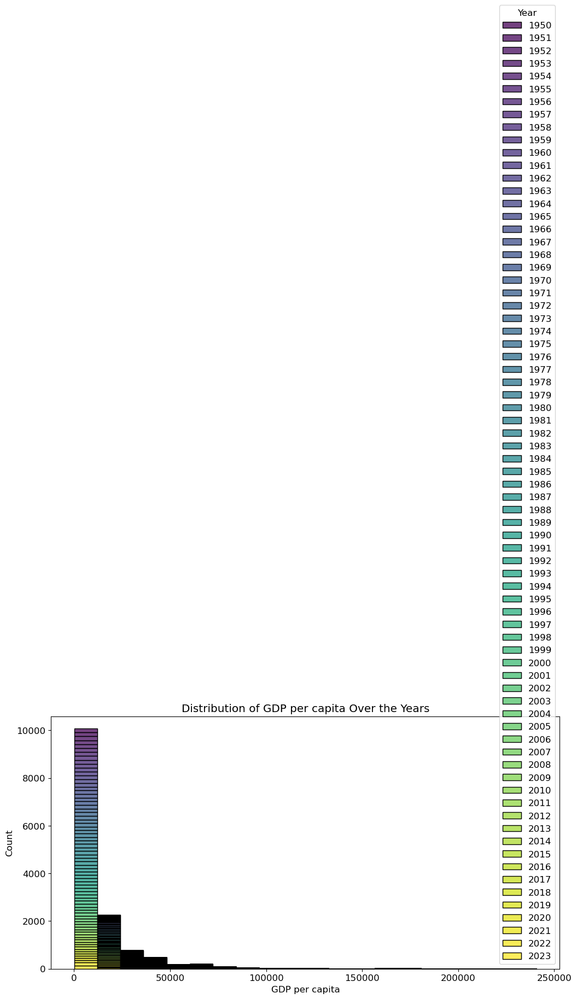

In [38]:
numeric_columns = merged_df.select_dtypes(include='number').columns
for col in numeric_columns[:2]:
    plt.figure(figsize=(12, 6))
    ax = sns.histplot(data=merged_df, x=col, hue='Year', multiple='stack', palette='viridis', bins=20)
    
    plt.title(f'Distribution of {col} Over the Years')
    plt.tight_layout()
    plt.show()

**Examining the box plots and statistics may reveal differences in the central tendency and variability of our features.**

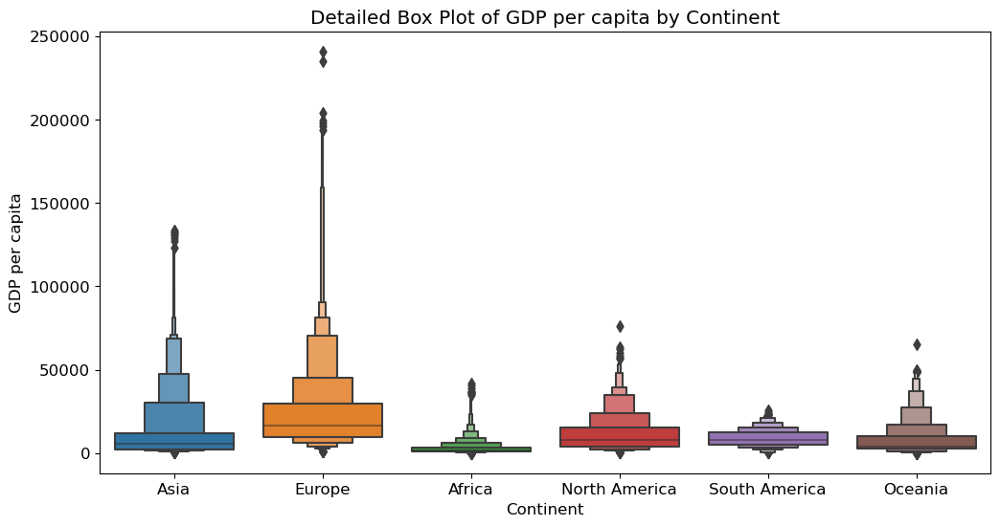

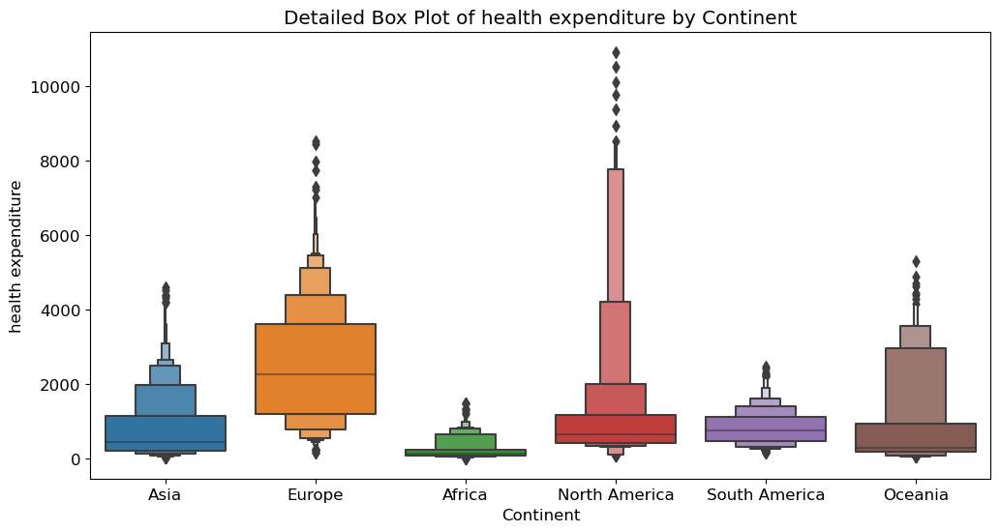

In [39]:
for col in numeric_columns[1:3]:
    plt.figure(figsize=(12, 6))
    sns.boxenplot(data=merged_df, x='Continent', y=col)
    plt.title(f'Detailed Box Plot of {col} by Continent')
    plt.show()

**KDE plots** offer unique insights compared to other visualizations by providing a **ontinuous probability density curve of data distribution.** This continuous nature allows for a smoother and more nuanced understanding of the underlying distribution of a dataset, which is particularly useful for identifying **subtle trends and patterns not always visible in discrete histograms or bar charts.** Unlike scatter plots or line graphs that emphasize individual data points or trends over time, KDE plots focus on the density of data, making them excellent for comparing the distribution of economic indicators across different regions in a way that highlights both central tendencies and variabilities.

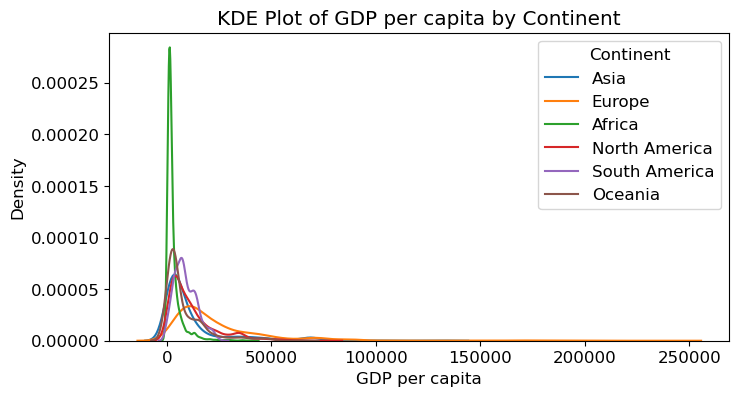

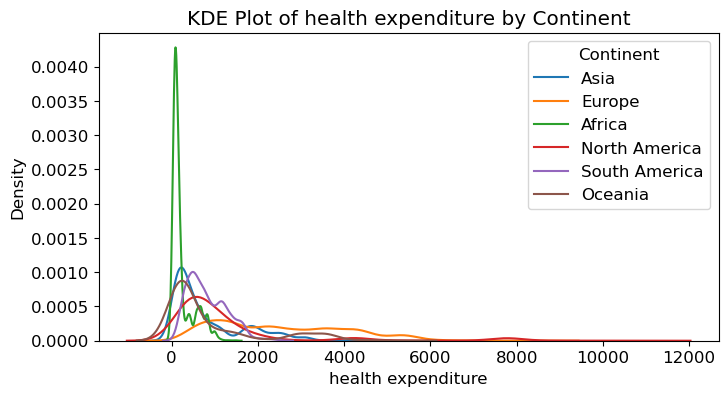

In [40]:
for col in numeric_columns[1:3]:
    plt.figure(figsize=(8, 4))
    for continent in merged_df['Continent'].unique():
        sns.kdeplot(data=merged_df[merged_df['Continent'] == continent], x=col, label=continent)
    plt.title(f'KDE Plot of {col} by Continent')
    plt.legend(title='Continent', loc='upper right')
    plt.show()

# Feature Extraction

## K-Means for Income Level Identification

In this analysis, we first rearrange our dataset so that countries are rows and years are columns, focusing on GDP per capita. Then, we use PCA to reduce the dataset's complexity, keeping 95% of its original variance, making it easier to handle for clustering.Using the K-Means algorithm, we group countries into clusters based on their GDP trends over time, determining the best number of clusters by comparing within-cluster sums of squares and silhouette scores.
After deciding on the optimal number of clusters, we perform the final clustering and add a new column to our original dataset, marking each country with its income level cluster. This process simplifies the global economic landscape into understandable groups based on GDP per capita trends.

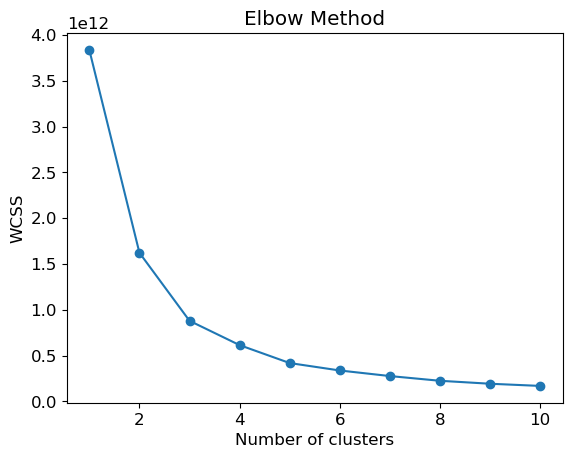

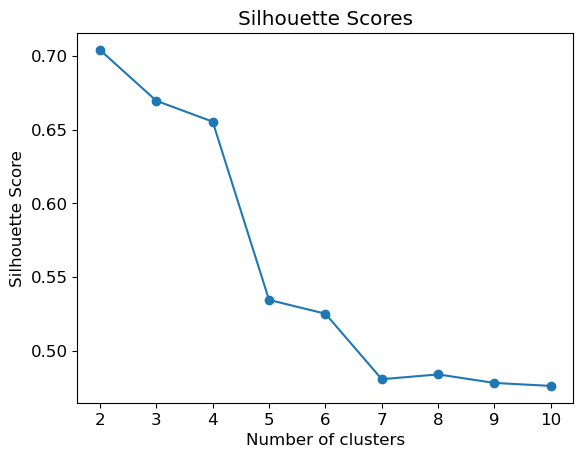

,Entity,Year,GDP per capita,health expenditure,Fertility rate,Literacy rates,GDP per capita growth annual,Meat consumption,Cantril ladder score,Population density,Population,Median age,Sex ratio,Urban population,suicide rate,Under five mortality rate,Electoral democracy index,Unemployment,Continent,Employment in agriculture (% of total employment),Employment in industry (% of total employment),Employment in services (% of total employment),Share of population with no education,Share of population with at least some basic education,Income Level
0,afghanistan,1950,1156.000000,145.89558,7.2484,31.741119,0.927029,16.852923,3.28165,11.469058,7480464.0,18.4,104.9,2274952.0,6.7550,18.486127,0.099,11.141,Asia,62.15,12.20,26.53,61.554302,38.445698,0
1,afghanistan,1951,1170.000000,145.89558,7.2596,31.741119,0.927029,16.852923,3.28165,11.608700,7571542.0,18.4,104.9,2274952.0,6.7550,18.486127,0.099,11.141,Asia,62.15,12.20,26.53,61.554302,38.445698,0
2,afghanistan,1952,1189.000000,145.89558,7.2601,31.741119,0.927029,16.852923,3.28165,11.755875,7667534.0,18.4,104.9,2274952.0,6.7550,18.486127,0.087,11.141,Asia,62.15,12.20,26.53,61.554302,38.445698,0
3,afghanistan,1953,1240.000000,145.89558,7.2662,31.741119,0.927029,16.852923,3.28165,11.904618,7764549.0,18.3,104.9,2274952.0,6.7550,18.486127,0.084,11.141,Asia,62.15,12.20,26.53,61.554302,38.445698,0
4,afghanistan,1954,1245.000000,145.89558,7.2542,31.741119,0.927029,16.852923,3.28165,12.057540,7864289.0,18.3,104.9,2274952.0,6.7550,18.486127,0.078,11.141,Asia,62.15,12.20,26.53,61.554302,38.445698,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14425,zimbabwe,2019,2203.396700,208.41232,3.5994,83.547646,-8.177321,50.275642,3.29920,39.691370,15354606.0,17.7,102.3,4945719.0,23.6286,5.266589,0.293,4.833,Africa,66.19,6.57,27.24,5.000000,95.000000,0
14426,zimbabwe,2020,1990.319500,204.04499,3.5451,83.547646,-9.670404,49.256416,3.14480,40.505787,15669663.0,17.9,102.4,5052214.0,26.5383,5.176960,0.293,5.351,Africa,64.51,9.85,26.12,8.166135,91.833860,0
14427,zimbabwe,2021,2115.144500,204.04499,3.4908,83.547646,6.271613,13.128580,2.99510,41.342964,15993525.0,18.1,102.4,5166388.0,26.5383,4.952197,0.291,5.174,Africa,64.51,9.85,26.12,5.000000,95.000000,0
14428,zimbabwe,2022,1676.821489,204.04499,5.7956,83.547646,-0.132760,13.128580,3.20350,42.188286,8836782.0,15.5,102.6,3008985.0,26.5383,9.819218,0.285,4.993,Africa,64.51,9.85,26.12,5.000000,95.000000,0


In [66]:
# Step 1: Data Transformation

# Pivoting the DataFrame to get countries as rows and years as columns

pivoted_df = merged_df.pivot(index='Entity', columns='Year', values='GDP per capita')

# Step 2: Dimensionality Reduction

# Retaining 95% of the variance

pca = PCA(n_components=0.95)  
X_pca = pca.fit_transform(pivoted_df)

# Step 3: Clustering

wcss = []
silhouette_scores = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_pca)
    wcss.append(kmeans.inertia_)
    if i > 1:
        silhouette_scores.append(silhouette_score(X_pca, kmeans.labels_))

# Step 4: Evaluation

# Elbow Method

plt.figure()
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# Silhouette Scores

plt.figure()
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

# Choosing the optimal number of clusters based on the above plots

# Final Clustering

optimal_clusters = 3
final_kmeans = KMeans(n_clusters=optimal_clusters, init='k-means++', random_state=42)
final_clusters = final_kmeans.fit_predict(X_pca)

# Adding the cluster label to merged_df as a column. a new feature 'Income Level' based on clustering results is added to merged_df

cluster_labels = dict(zip(pivoted_df.index, final_clusters))
merged_df['Income Level'] = merged_df['Entity'].map(cluster_labels)
merged_df

## Economic Indicators Analysis

Explanation for Extracting New Features:

The introduction of features like rolling growth rate, GDP growth volatility, peak/trough GDP, and correlation with an ideal pattern enriches our dataset with insights into the economic dynamics of countries and continents. Here's how these features contribute to understanding and predicting GDP per capita:

   **Rolling Growth Rate:** This feature captures short-term fluctuations in GDP growth, smoothing out anomalies and highlighting underlying trends. It's crucial for understanding the momentum of economic growth over time.

   **GDP Growth Volatility:** Volatility measures the consistency of GDP growth, indicating economic stability. High volatility can signal vulnerability to external shocks, while low volatility suggests steady growth. This is important for risk assessment and economic forecasting.

   **Peak and Trough GDP:** Identifying peaks and troughs helps in understanding the cyclical nature of the economy, including expansion and contraction phases. We Think This cyclical analysis is key to predicting future economic turning points.

   **Correlation with Ideal Growth Pattern:** By comparing actual GDP growth with an idealized smooth growth curve, this feature assesses how closely a country's economic development matches optimal growth scenarios. High correlation might indicate sustainable growth, while deviations can highlight areas for policy intervention.

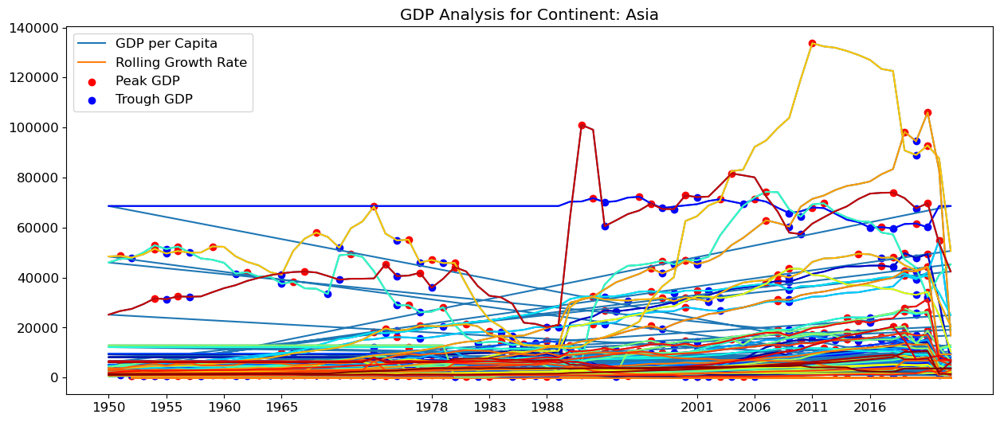

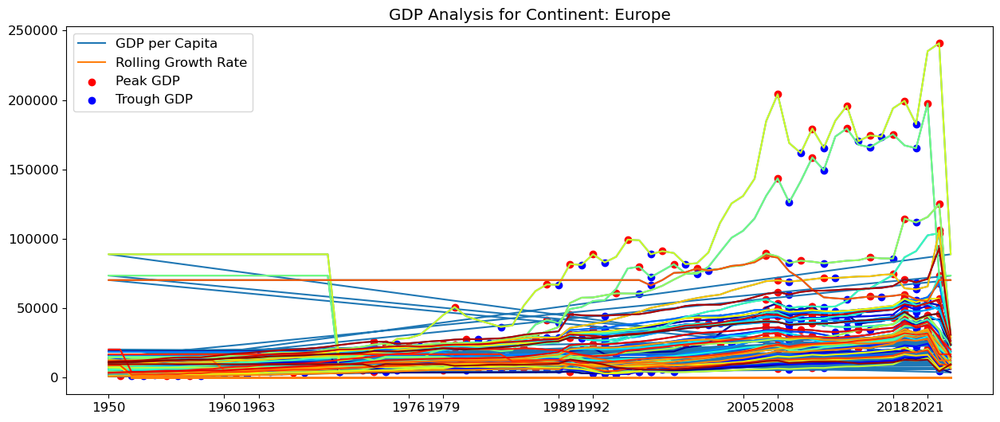

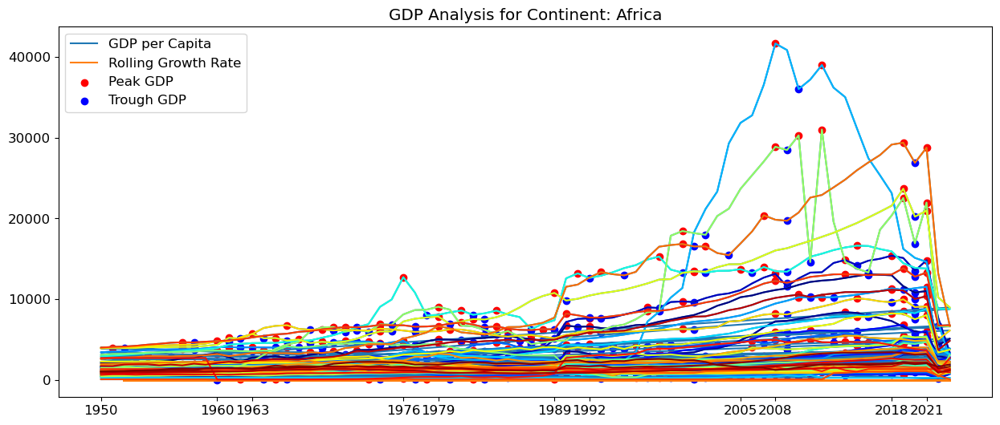

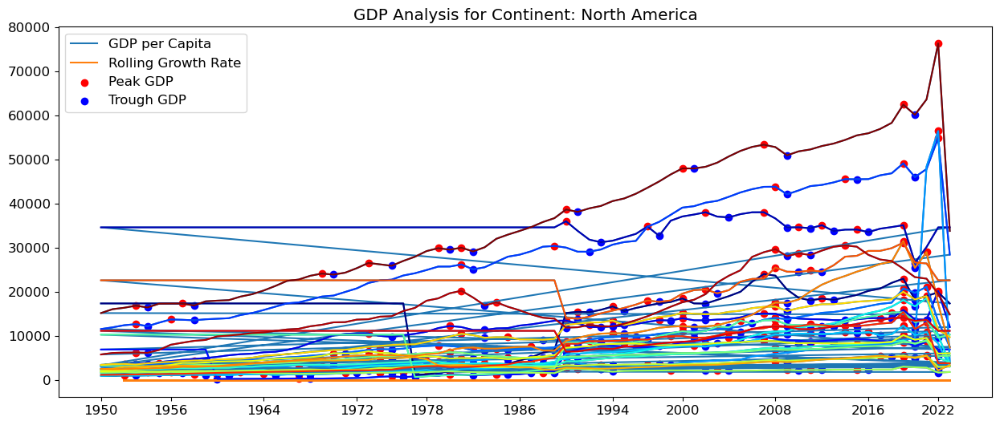

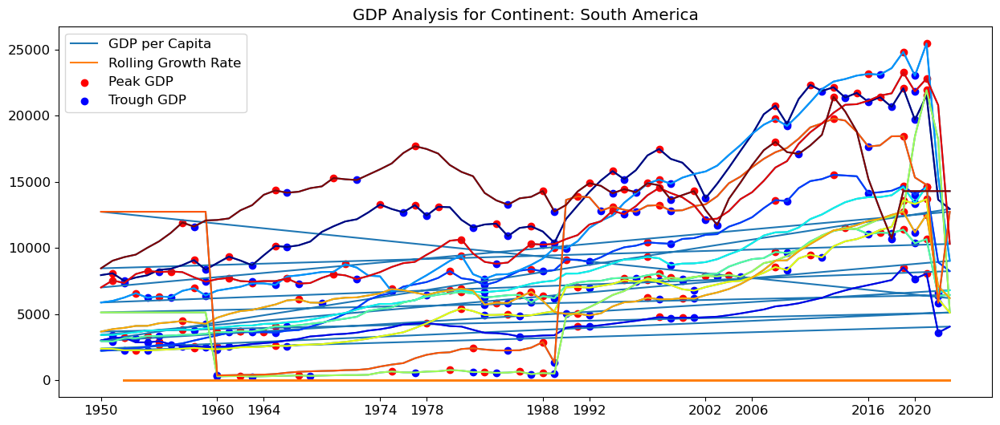

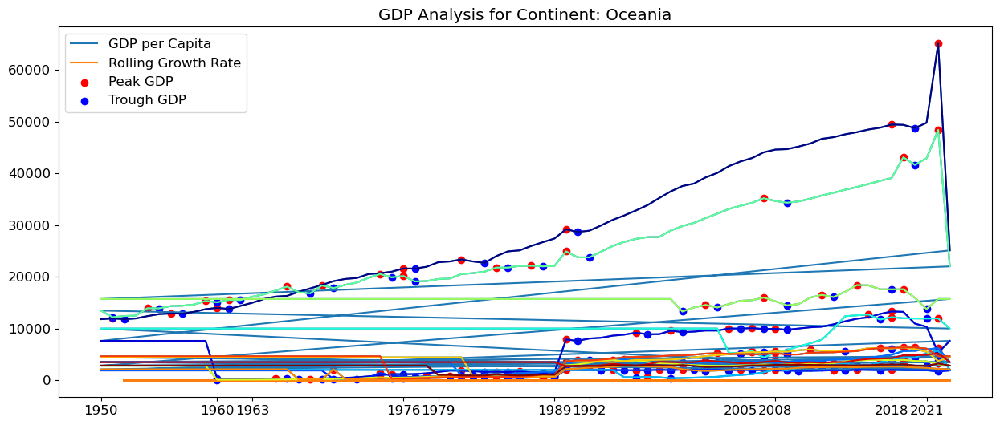

In [67]:
# Function for Rolling Window Analysis

def rolling_growth_rate(series, window_size):
    return series.pct_change().rolling(window=window_size).mean()

# Function to calculate GDP growth volatility

def gdp_growth_volatility(series, window_size):
    return series.pct_change().rolling(window=window_size).std()

# Function for Correlation with Ideal Pattern

def correlation_with_ideal(series, ideal_pattern):
    min_length = min(len(series), len(ideal_pattern))
    return pearsonr(series[:min_length], ideal_pattern[:min_length])[0]

# Defining an ideal growth pattern

ideal_growth = 1 / (1 + np.exp(-np.linspace(-10, 10, 50)))


# Initializing new columns in merged_df

merged_df['Rolling Growth Rate'] = np.nan
merged_df['Trough GDP'] = np.nan
merged_df['Peak GDP'] = np.nan
merged_df['Correlation with Ideal'] = np.nan
merged_df['Is Peak'] = 0
merged_df['Is Trough'] = 0
merged_df['GDP Growth Volatility'] = np.nan


# Analyzing for each Entity and Continent

for (entity, continent), group in merged_df.groupby(['Entity', 'Continent']):
    sorted_group = group.sort_values(by='Year')
    gdp_series = sorted_group['GDP per capita']

    # Rolling Window Analysis
    
    rolling_growth = rolling_growth_rate(gdp_series, window_size=2)
    
    # Correlation with Ideal Pattern
    
    correlation = correlation_with_ideal(gdp_series, ideal_growth)
    
    # Peak and Trough Detection
    
    peaks, _ = find_peaks(gdp_series)
    troughs, _ = find_peaks(-gdp_series)  
    
    merged_df.loc[sorted_group.index[peaks], 'Is Peak'] = 1
    merged_df.loc[sorted_group.index[troughs], 'Is Trough'] = 1
    
    # Assigning Trough GDP values
    
    for trough in troughs:
        
        # Getting the original DataFrame index for this trough
        
        trough_index = sorted_group.index[trough]  
        
        # Assigning the trough value
        
        merged_df.at[trough_index, 'Trough GDP'] = gdp_series.iloc[trough]  
    for peak in peaks:
        
        # Getting the original DataFrame index for this trough
        
        peak_index = sorted_group.index[peak]
        
        # Assigning the trough value
        
        merged_df.at[peak_index, 'Peak GDP'] = gdp_series.iloc[peak]  
    
    # GDP Growth Volatility
    
    volatility = gdp_growth_volatility(gdp_series, window_size=2)

    # Assigning calculations back to merged_df
    
    merged_df.loc[sorted_group.index, 'Rolling Growth Rate'] = rolling_growth
    merged_df.loc[sorted_group.index, 'Correlation with Ideal'] = correlation
    merged_df.loc[sorted_group.index, 'GDP Growth Volatility'] = volatility
    
# Generating plots for all Entities and Continents

for continent in merged_df['Continent'].unique():
    continent_data = merged_df[merged_df['Continent'] == continent]
    plt.figure(figsize=(15, 6))
    
    entities = continent_data['Entity'].unique()
    colors = plt.cm.jet(np.linspace(0, 1, len(entities)))
    
    plt.plot(continent_data['Year'], continent_data['GDP per capita'], label='GDP per Capita')
    plt.plot(continent_data['Year'], continent_data['Rolling Growth Rate'], label='Rolling Growth Rate')
    plt.scatter(continent_data['Year'], continent_data['Peak GDP'], color='red', label='Peak GDP')
    plt.scatter(continent_data['Year'], continent_data['Trough GDP'], color='blue', label='Trough GDP')
    for color, entity in zip(colors, entities):
        entity_data = continent_data[continent_data['Entity'] == entity]
        plt.plot(entity_data['Year'], entity_data['GDP per capita'], color=color)

    plt.title(f"GDP Analysis for Continent: {continent}")
    plt.legend()
    
    # Setting x-axis ticks to show only a subset of years
    
    # Showing approximately 10 ticks
    
    step = max(len(continent_data['Year']) // 10, 1)  
    plt.xticks(continent_data['Year'][::step])
    plt.show()

The observations highlight a fascinating aspect of global economic dynamics: **the synchronicity of economic peaks and troughs across countries within the same continent.** **This phenomenon suggests a level of interconnectedness and mutual dependence in their economies.** However, the impact of these economic fluctuations varies significantly from country to country, implying that the resilience and robustness of a nation's economy can greatly influence its ability to withstand economic downturns. Factors contributing to such resilience may include the diversification of the economy, the strength of domestic policies, or the presence of robust financial systems, among others that are not immediately apparent from the data.

**Interestingly, within each continent, there are outliers—countries whose economic cycles of peaks and troughs do not align with the broader trends observed in their regions.** **This deviation could be indicative of economies that are less influenced by the regional factors driving these economic cycles.** It suggests that these countries may have economies that are either more insulated from or not heavily reliant on the variables causing widespread economic upheavals within the continent. This independence could stem from a variety of factors, such as unique economic structures, varied trading partners beyond their immediate region, or different resource endowments.

**Expanding on the implications of these observations, it's noteworthy to consider why countries that develop dependencies on them (by other countries) are more likely to sustain falls and benefit more significantly during rises.** **This resilience and capacity to capitalize on economic upswings are often the result of economic diversification and the strategic development of sectors that offer comparative advantages.** When a country becomes a critical supplier of goods, services, or resources, it can create a buffer against economic downturns through sustained demand from dependent countries. Furthermore, such strategic positioning allows these countries to leverage their influence and economic significance to capture a larger share of benefits during periods of global economic growth. The development of these dependencies is not merely a byproduct of economic strength but a testament to strategic economic planning and international relations, positioning these countries to weather economic storms more effectively and to harness the momentum of global economic upswings.

In this step of the project, we calculate the correlation matrix for numerical features and visualize it using a heatmap to identify highly correlated variables. Features with a correlation higher than a specified threshold (e.g., 0.8) are considered for elimination. This process is crucial for several reasons:

   **Reduces Multicollinearity:** High correlation between variables (multicollinearity) can distort the results of predictive models by making the estimates of the model's parameters less reliable. Reducing multicollinearity improves model performance and interpretability.

   **Enhances Model Generalization:** By removing highly correlated features, we reduce the risk of overfitting, where a model performs well on the training data but poorly on unseen data. A simpler model with fewer, uncorrelated inputs often generalizes better to new data.

   **Improves Computational Efficiency:** Fewer features mean lower computational complexity. This simplification speeds up model training and prediction, making the data analysis process more efficient.

   **Increases Interpretability:** Simplifying the feature set by removing redundant variables makes the model easier to understand and interpret. It becomes clearer how each independent variable contributes to the prediction, facilitating insights into the underlying patterns and relationships in the data.

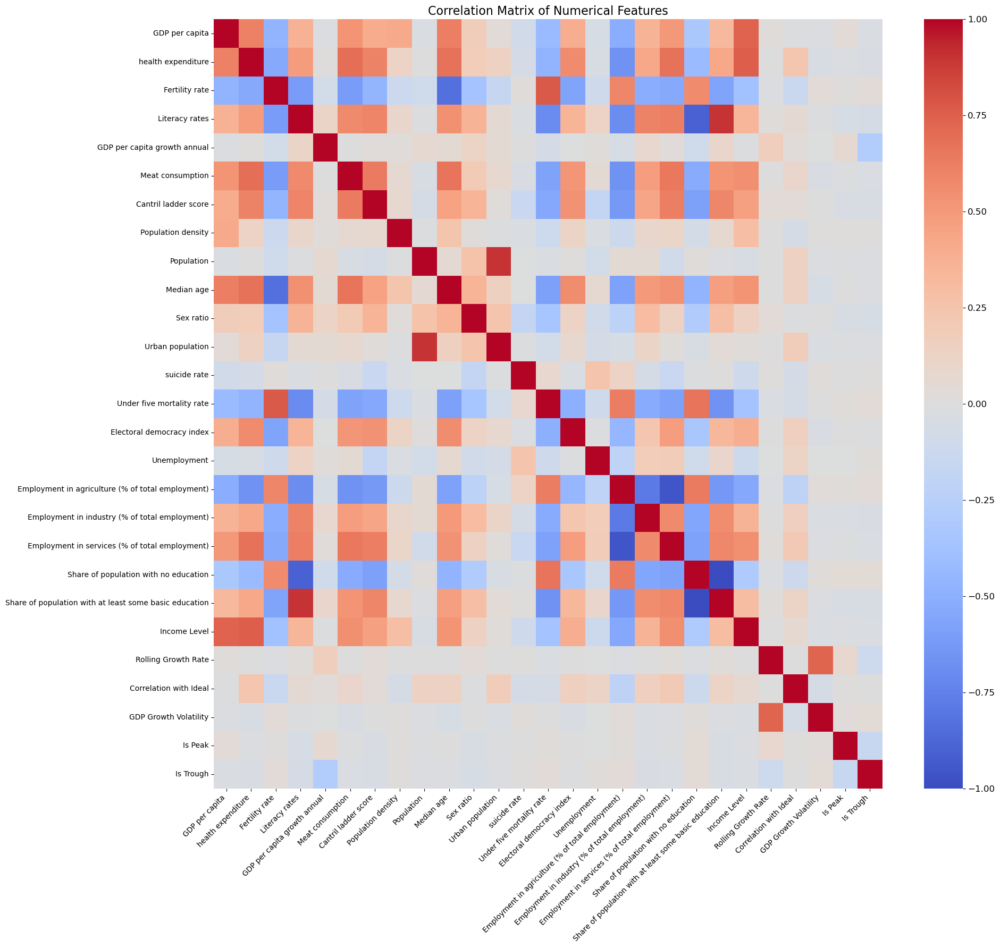

Columns to drop due to high correlation: {'Median age', 'Share of population with no education', 'Urban population', 'Share of population with at least some basic education', 'Employment in services (% of total employment)'}


In [68]:
numerical_features = [
    "GDP per capita", "health expenditure", "Fertility rate", "Literacy rates",
    "GDP per capita growth annual", "Meat consumption", "Cantril ladder score",
    "Population density", "Population", "Median age", "Sex ratio",
    "Urban population", "suicide rate", "Under five mortality rate",
    "Electoral democracy index", "Unemployment",
    "Employment in agriculture (% of total employment)",
    "Employment in industry (% of total employment)",
    "Employment in services (% of total employment)",
    "Share of population with no education",
    "Share of population with at least some basic education",
    "Income Level", "Rolling Growth Rate", "Correlation with Ideal",
    "GDP Growth Volatility", "Is Peak", "Is Trough"
]

# Calculating correlation matrix

corr_matrix = merged_df[numerical_features].corr()

plt.figure(figsize=(20, 18))
sns.heatmap(corr_matrix, annot=False, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Correlation Matrix of Numerical Features', fontsize=16)

# Improving the readability of the figure

plt.xticks(fontsize=10, rotation=45, ha='right')
plt.yticks(fontsize=10)
plt.tight_layout()

plt.show()

# Identifing features to eliminate based on correlation threshold (e.g., > 0.8)

threshold = 0.8
columns_to_drop = set()

for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname = corr_matrix.columns[i]
            columns_to_drop.add(colname)

# Dropping highly correlated features

merged_df = merged_df.drop(columns=columns_to_drop)

print(f"Columns to drop due to high correlation: {columns_to_drop}")

**This step** focuses on imputing missing values for the new features we've derived from earlier computations, ensuring the merged_df DataFrame is fully prepared for modeling. By adopting a hierarchical approach—first using entity-specific medians and then continent-wide medians for imputation—we ensure that our dataset maintains its integrity and reflects both local and regional economic patterns. This meticulous preparation optimizes the dataset for more accurate and reliable predictive modeling.

In [69]:
# Specifing the columns to apply the operations on

specific_columns = ['Rolling Growth Rate', 'Correlation with Ideal', 'GDP Growth Volatility']

for col in specific_columns:
    
    # Converting the column to numeric data type, coercing errors to NaN
    
    merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')
    
    # Calculating the median values for the same column within each entity
    
    entity_median = merged_df.groupby('Entity')[col].transform('median')
    
    # Calculating the median values for the same column within each continent
    
    continent_median = merged_df.groupby('Continent')[col].transform('median')
    
    # Filling missing values in the column first with the respective entity's median
    
    merged_df[col] = merged_df[col].fillna(entity_median)
    
    # Then, if there are still missing values, fill them with the respective continent's median
    
    merged_df[col] = merged_df[col].fillna(continent_median)
merged_df

,Entity,Year,GDP per capita,health expenditure,Fertility rate,Literacy rates,GDP per capita growth annual,Meat consumption,Cantril ladder score,Population density,Population,Sex ratio,suicide rate,Under five mortality rate,Electoral democracy index,Unemployment,Continent,Employment in agriculture (% of total employment),Employment in industry (% of total employment),Income Level,Rolling Growth Rate,Trough GDP,Peak GDP,Correlation with Ideal,Is Peak,Is Trough,GDP Growth Volatility
0,afghanistan,1950,1156.000000,145.89558,7.2484,31.741119,0.927029,16.852923,3.28165,11.469058,7480464.0,104.9,6.7550,18.486127,0.099,11.141,Asia,62.15,12.20,0,0.001190,NaN,NaN,-0.603899,0,0,0.028920
1,afghanistan,1951,1170.000000,145.89558,7.2596,31.741119,0.927029,16.852923,3.28165,11.608700,7571542.0,104.9,6.7550,18.486127,0.099,11.141,Asia,62.15,12.20,0,0.001190,NaN,NaN,-0.603899,0,0,0.028920
2,afghanistan,1952,1189.000000,145.89558,7.2601,31.741119,0.927029,16.852923,3.28165,11.755875,7667534.0,104.9,6.7550,18.486127,0.087,11.141,Asia,62.15,12.20,0,0.014175,NaN,NaN,-0.603899,0,0,0.002919
3,afghanistan,1953,1240.000000,145.89558,7.2662,31.741119,0.927029,16.852923,3.28165,11.904618,7764549.0,104.9,6.7550,18.486127,0.084,11.141,Asia,62.15,12.20,0,0.029566,NaN,NaN,-0.603899,0,0,0.018847
4,afghanistan,1954,1245.000000,145.89558,7.2542,31.741119,0.927029,16.852923,3.28165,12.057540,7864289.0,104.9,6.7550,18.486127,0.078,11.141,Asia,62.15,12.20,0,0.023463,NaN,NaN,-0.603899,0,0,0.027479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14425,zimbabwe,2019,2203.396700,208.41232,3.5994,83.547646,-8.177321,50.275642,3.29920,39.691370,15354606.0,102.3,23.6286,5.266589,0.293,4.833,Africa,66.19,6.57,0,0.061710,NaN,2203.3967,0.845331,1,0,0.052268
14426,zimbabwe,2020,1990.319500,204.04499,3.5451,83.547646,-9.670404,49.256416,3.14480,40.505787,15669663.0,102.4,26.5383,5.176960,0.293,5.351,Africa,64.51,9.85,0,0.000983,1990.319500,NaN,0.845331,0,1,0.138150
14427,zimbabwe,2021,2115.144500,204.04499,3.4908,83.547646,6.271613,13.128580,2.99510,41.342964,15993525.0,102.4,26.5383,4.952197,0.291,5.174,Africa,64.51,9.85,0,-0.016994,NaN,2115.1445,0.845331,1,0,0.112727
14428,zimbabwe,2022,1676.821489,204.04499,5.7956,83.547646,-0.132760,13.128580,3.20350,42.188286,8836782.0,102.6,26.5383,9.819218,0.285,4.993,Africa,64.51,9.85,0,-0.072257,1676.821489,NaN,0.845331,0,1,0.190881


Here we've applied different encoding techniques to categorical variables in the merged_df DataFrame to prepare them for machine learning models, which typically require numerical input:

   **Binary Encoding for the 'Continent' Column:** The BinaryEncoder transforms the 'Continent' column into multiple binary (0 or 1) columns. This method is efficient for handling categorical variables with many levels, reducing dimensionality compared to one-hot encoding while preserving more information than label encoding.

   **Target Encoding for the 'Entity' Column:** TargetEncoder replaces each 'Entity' with the average value of the 'GDP per capita' for that entity. This technique captures the numeric relationship between the entity and the target variable ('GDP per capita'), providing a meaningful input for predictive modeling. It's particularly useful when the categorical variable has a lot of categories and is closely related to the target.

   **Label Encoding for the 'Entity' Column:** As an alternative or complement to target encoding, label encoding converts the 'Entity' column into a series of codes, assigning a unique integer to each category. This method simplifies the representation of categorical variables but does not capture any inherent order or relationship between the different entities unless such an order exists naturally.

In [70]:
# Encoding Continent column using BinaryEncoder

encoder = ce.BinaryEncoder(cols=['Continent'])
merged_df = encoder.fit_transform(merged_df)

# Performing target encoding for Entity

target_encoder = TargetEncoder(cols=['Entity'])
merged_df['Entity_target_encoded'] = target_encoder.fit_transform(merged_df['Entity'], merged_df['GDP per capita'])

# Optionally, we can use label encoding for Entity as well

merged_df['Entity_label_encoded'] = merged_df['Entity'].astype('category').cat.codes

merged_df

,Entity,Year,GDP per capita,health expenditure,Fertility rate,Literacy rates,GDP per capita growth annual,Meat consumption,Cantril ladder score,Population density,Population,Sex ratio,suicide rate,Under five mortality rate,Electoral democracy index,Unemployment,Continent_0,Continent_1,Continent_2,Employment in agriculture (% of total employment),Employment in industry (% of total employment),Income Level,Rolling Growth Rate,Trough GDP,Peak GDP,Correlation with Ideal,Is Peak,Is Trough,GDP Growth Volatility,Entity_target_encoded,Entity_label_encoded
0,afghanistan,1950,1156.000000,145.89558,7.2484,31.741119,0.927029,16.852923,3.28165,11.469058,7480464.0,104.9,6.7550,18.486127,0.099,11.141,0,0,1,62.15,12.20,0,0.001190,NaN,NaN,-0.603899,0,0,0.028920,1289.500947,0
1,afghanistan,1951,1170.000000,145.89558,7.2596,31.741119,0.927029,16.852923,3.28165,11.608700,7571542.0,104.9,6.7550,18.486127,0.099,11.141,0,0,1,62.15,12.20,0,0.001190,NaN,NaN,-0.603899,0,0,0.028920,1289.500947,0
2,afghanistan,1952,1189.000000,145.89558,7.2601,31.741119,0.927029,16.852923,3.28165,11.755875,7667534.0,104.9,6.7550,18.486127,0.087,11.141,0,0,1,62.15,12.20,0,0.014175,NaN,NaN,-0.603899,0,0,0.002919,1289.500947,0
3,afghanistan,1953,1240.000000,145.89558,7.2662,31.741119,0.927029,16.852923,3.28165,11.904618,7764549.0,104.9,6.7550,18.486127,0.084,11.141,0,0,1,62.15,12.20,0,0.029566,NaN,NaN,-0.603899,0,0,0.018847,1289.500947,0
4,afghanistan,1954,1245.000000,145.89558,7.2542,31.741119,0.927029,16.852923,3.28165,12.057540,7864289.0,104.9,6.7550,18.486127,0.078,11.141,0,0,1,62.15,12.20,0,0.023463,NaN,NaN,-0.603899,0,0,0.027479,1289.500947,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14425,zimbabwe,2019,2203.396700,208.41232,3.5994,83.547646,-8.177321,50.275642,3.29920,39.691370,15354606.0,102.3,23.6286,5.266589,0.293,4.833,0,1,1,66.19,6.57,0,0.061710,NaN,2203.3967,0.845331,1,0,0.052268,1949.638414,193
14426,zimbabwe,2020,1990.319500,204.04499,3.5451,83.547646,-9.670404,49.256416,3.14480,40.505787,15669663.0,102.4,26.5383,5.176960,0.293,5.351,0,1,1,64.51,9.85,0,0.000983,1990.319500,NaN,0.845331,0,1,0.138150,1949.638414,193
14427,zimbabwe,2021,2115.144500,204.04499,3.4908,83.547646,6.271613,13.128580,2.99510,41.342964,15993525.0,102.4,26.5383,4.952197,0.291,5.174,0,1,1,64.51,9.85,0,-0.016994,NaN,2115.1445,0.845331,1,0,0.112727,1949.638414,193
14428,zimbabwe,2022,1676.821489,204.04499,5.7956,83.547646,-0.132760,13.128580,3.20350,42.188286,8836782.0,102.6,26.5383,9.819218,0.285,4.993,0,1,1,64.51,9.85,0,-0.072257,1676.821489,NaN,0.845331,0,1,0.190881,1949.638414,193


In [71]:
# Discarding the specified columns from merged_df

merged_df.drop(columns=['Trough GDP', 'Peak GDP', 'Entity'], inplace=True)
merged_df
merged_df.to_csv('merged_df.csv', index=False)

Here we preprocesses the merged_df for models by separating features and the target variable ('GDP per capita'), **normalizing the features to ensure consistent scale**, and then applying **PCA to reduce dimensionality while preserving 95% of the variance.** To retain the original feature names after applying PCA while keeping 95% of the variance, we will need to approach the problem differently since PCA inherently transforms our original features into a set of linearly uncorrelated components (principal components), which don't directly correspond to our original features. However, we can approximate the contribution of each original feature to the principal components.

The aim is to improve model performance and efficiency by simplifying the data structure without significant loss of information, addressing potential issues like overfitting and high computational demand as we explained before. The processed features and target variable are also saved for future use, ensuring reproducibility and ease of analysis.

**Does the Target Variable or the other features Need to Be Scaled?**

Scaling the target variable in regression tasks depends on the specific model and the nature of the data. Here are a few considerations:

  **Tree-based Models:** For tree-based models such as Random Forest, XGBoost, catboost or LightGBM   scaling the target variable or the other features is not necessary because these models are invariant to the scale of the features and the target.
  
  **ARIMA and SARIMAX**

  **Scaling Not Typically Required:** ARIMA (AutoRegressive Integrated Moving Average) and SARIMAX (Seasonal ARIMA with eXogenous variables) models are focused on capturing the autocorrelation within time series data. The absolute scale of the data does not fundamentally change the model's ability to identify and leverage patterns in autocorrelation and seasonality for forecasting. However, ensuring stationarity (e.g., through differencing) is crucial for these models.

**Prophet**

  **Scaling Not Required:** Prophet, developed by Facebook, is designed for forecasting with daily observations that display patterns on different time scales. It is robust to the scale of the data and primarily focuses on trend, seasonality, and holidays. Scaling the target variable is not necessary since the model's components are designed to adapt to the data's scale.
  
   **Why Tree-based Models Are Scale Invariant:**

   **Decision Process:** Tree-based models make decisions by splitting nodes based on the value of a feature compared to a threshold. The decision to split a node does not depend on the absolute value of the feature but rather on the order of the data points with respect to that feature. Therefore, scaling does not affect the model's ability to learn from the feature.

**Conclussion:** The reason we do scale the data and apply pca is to use it in Sarimax and Exponential Smoothing.

In [77]:
# Separating out the features and target variable

X = merged_df.drop(['GDP per capita'], axis=1)
y = merged_df['GDP per capita']

y.to_csv('target_variable_df.csv', index=False)
X.to_csv('final_merge.csv', index=False)
X_df = pd.DataFrame(X, columns=X.columns)

# Normalizing the features

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)
X_scaled_df.to_csv('final_merge_scaled.csv', index=False)

In [78]:
# keeping 95% of variance

pca = PCA(n_components=0.95)

# Fit and transform the normalized features using PCA

X_pca = pca.fit_transform(X_scaled)

# The result, X_pca, is Our dataset with reduced dimensionality

X_pca_scaled_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])

loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])], index=X.columns)

print(loadings)

                                                        PC1       PC2  \
Year                                               0.064233  0.114005   
health expenditure                                 0.300958 -0.216784   
Fertility rate                                    -0.292732 -0.071441   
Literacy rates                                     0.285706  0.121294   
GDP per capita growth annual                       0.023458  0.134391   
Meat consumption                                   0.305590 -0.048133   
Cantril ladder score                               0.293874  0.162264   
Population density                                 0.079443 -0.216562   
Population                                        -0.000251  0.152491   
Sex ratio                                          0.143435  0.243824   
suicide rate                                      -0.046082 -0.225544   
Under five mortality rate                         -0.293251 -0.155076   
Electoral democracy index                          

Here we present these two valuable insights:

  **Number of Components Selected by PCA:** The pca.n_components_ attribute tells us the number of principal components chosen by PCA to represent the data while retaining 95% of the original variance. This number reflects the reduced dimensionality of the dataset after PCA transformation, optimizing the balance between preserving information and simplifying the dataset.

   **Variance Explained by Each Component:** The pca.explained_variance_ratio_ array provides the proportion of the variance explained by each of the selected components. This information is crucial for understanding the significance of each principal component in capturing the variability of the data. Higher values indicate components that capture more information, while lower values represent components with less contribution to the total variance.
   
Together, these outputs offer insights into the effectiveness of PCA in reducing the dimensionality of the dataset, showing how many dimensions are necessary to capture the majority of the data's variance and how much each component contributes to this goal. This information is valuable for evaluating the PCA transformation's impact on the data and for guiding further data analysis and modeling decisions.

In [79]:
# Number of components

print(f"PCA selected {pca.n_components_} components.")

# Variance ratio per component

print("Variance explained by each component:")
print(pca.explained_variance_ratio_)

PCA selected 20 components.
Variance explained by each component:
[0.26408634 0.07208836 0.06567262 0.06371596 0.06001993 0.05402385 0.04843631 0.04496528 0.04166375 0.03716633 0.03258008 0.03229541 0.02895772 0.02548138 0.02073311 0.0175342  0.01521554 0.01393902
 0.01110441 0.01065968]


In [82]:
final_merge = pd.read_csv("final_merge.csv")
target_variable_df = pd.read_csv("target_variable_df.csv")

In [83]:
concat_df = pd.concat([final_merge, target_variable_df], axis=1) 
concat_df.head()

,Year,health expenditure,Fertility rate,Literacy rates,GDP per capita growth annual,Meat consumption,Cantril ladder score,Population density,Population,Sex ratio,suicide rate,Under five mortality rate,Electoral democracy index,Unemployment,Continent_0,Continent_1,Continent_2,Employment in agriculture (% of total employment),Employment in industry (% of total employment),Income Level,Rolling Growth Rate,Correlation with Ideal,Is Peak,Is Trough,GDP Growth Volatility,Entity_target_encoded,Entity_label_encoded,GDP per capita
0,1950,145.89558,7.2484,31.741119,0.927029,16.852923,3.28165,11.469058,7480464.0,104.9,6.755,18.486127,0.099,11.141,0,0,1,62.15,12.2,0,0.001190,-0.603899,0,0,0.028920,1289.500947,0,1156.0
1,1951,145.89558,7.2596,31.741119,0.927029,16.852923,3.28165,11.608700,7571542.0,104.9,6.755,18.486127,0.099,11.141,0,0,1,62.15,12.2,0,0.001190,-0.603899,0,0,0.028920,1289.500947,0,1170.0
2,1952,145.89558,7.2601,31.741119,0.927029,16.852923,3.28165,11.755875,7667534.0,104.9,6.755,18.486127,0.087,11.141,0,0,1,62.15,12.2,0,0.014175,-0.603899,0,0,0.002919,1289.500947,0,1189.0
3,1953,145.89558,7.2662,31.741119,0.927029,16.852923,3.28165,11.904618,7764549.0,104.9,6.755,18.486127,0.084,11.141,0,0,1,62.15,12.2,0,0.029566,-0.603899,0,0,0.018847,1289.500947,0,1240.0
4,1954,145.89558,7.2542,31.741119,0.927029,16.852923,3.28165,12.057540,7864289.0,104.9,6.755,18.486127,0.078,11.141,0,0,1,62.15,12.2,0,0.023463,-0.603899,0,0,0.027479,1289.500947,0,1245.0


# Models Predictions


### Model Building

In this part of the project I will implement different time series model like : XGBoost , Lightgbm , Random forest , Cat boosting , Prophet , Sarimax , arima , and exponential boosting. 

Model Implementation and Data Preparation

In this phase, we embarked on building a suite of predictive models, tapping into the strengths of various machine learning and statistical algorithms to forecast 'GDP per capita'. Our chosen methodologies encompass a broad spectrum: XGBoost, LightGBM, Random Forest, CatBoost, Prophet, SARIMAX, ARIMA, and Exponential Smoothing. Each model brings unique capabilities to address the intricacies of time series forecasting. The process involved several critical steps:

   **Data Segmentation:** We partitioned our dataset into training and testing sets based on the temporal boundary of the year 2022. This separation ensures that our models are assessed based on their predictive power for future observations, crucial for evaluating their real-world applicability.

  **Feature Selection:** Our analysis leverages a carefully curated set of features, including key economic indicators and demographic metrics. This selection process aims to equip each model with relevant and impactful variables that accurately reflect the dynamics influencing economic growth.

  **Expanding Model Portfolio:** Our initial exploration represents just the beginning. We plan to delve deeper into each selected model, fine-tuning them to harness their full predictive potential and exploring synergies that may emerge from their combined use.

  **Hyperparameter Optimization:** To refine our models further, we will employ GridSearchCV for comprehensive hyperparameter optimization. This strategy will leverage cross-validation techniques to find the optimal model configurations, thus maximizing predictive performance across our diverse model set.

  **Enhancing Model Interpretability:** Understanding the 'why' behind our models' predictions is as crucial as their accuracy. To this end, we will integrate SHAP value analysis across our model portfolio. This will illuminate the significance of individual features in forecasting 'GDP per capita', offering valuable insights into each model's decision-making process.

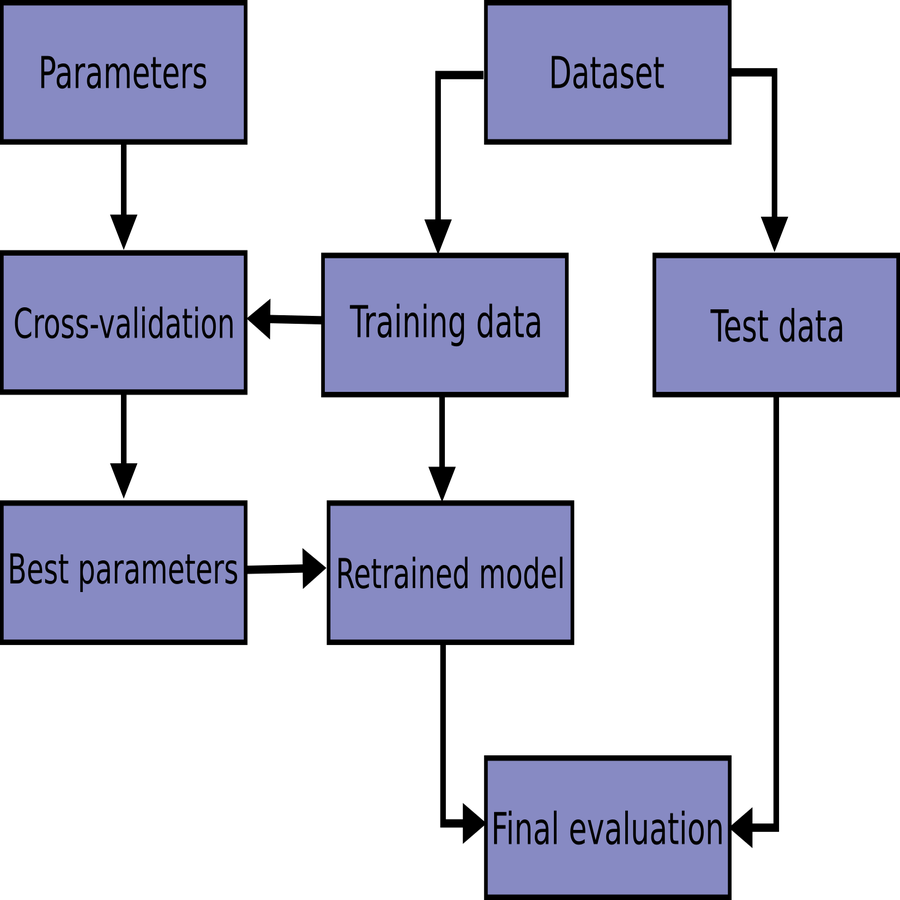

In [84]:
img = Image.open("grid_search_workflow.png")

new_width = 900 
new_height = 900
img = img.resize((new_width, new_height), Image.ANTIALIAS)

img.save("resized_grid_search_workflow.png")

from IPython.display import Image as IPythonImage
IPythonImage(filename="resized_grid_search_workflow.png")

In [85]:
train = concat_df.loc[concat_df.Year < 2022]
test = concat_df.loc[concat_df.Year >= 2022]

## XGBoost

In [86]:
FEATURES = ['Year', 'health expenditure', 'Fertility rate', 'Literacy rates', 'GDP per capita growth annual', 'Meat consumption', 'Cantril ladder score', 'Population density', 'Population', 'Sex ratio', 'suicide rate', 'Under five mortality rate', 'Electoral democracy index', 'Unemployment', 'Continent_0', 'Continent_1', 'Continent_2', 'Employment in agriculture (% of total employment)', 'Employment in industry (% of total employment)', 'Income Level', 'Rolling Growth Rate', 'Correlation with Ideal', 'Is Peak', 'Is Trough', 'GDP Growth Volatility', 'Entity_target_encoded']
TARGET = 'GDP per capita'
X_train = train[FEATURES].values
X_test = test[FEATURES].values
y_train = train[TARGET].values
y_test = test[TARGET].values

In [128]:
X_train_df = pd.DataFrame(X_train, columns=FEATURES)
y_train_df = pd.DataFrame(y_train, columns=[TARGET])
X_test_df = pd.DataFrame(X_test, columns=FEATURES)
y_test_df = pd.DataFrame(y_test, columns=[TARGET])

We wanted to check different kind of hyperparamters to make the best out of each model prediction. Here we Implemented Manual Iteration with Early Stopping:

   **Approach:** This method involves manually iterating over a predefined grid of hyperparameters (n_estimators and learning_rate), fitting an XGBRegressor model for each combination, and using early stopping based on a validation set.
   
   **Key Features:** Incorporates early stopping to prevent overfitting by monitoring performance on a validation set and halting training if performance doesn't improve. It selects the best model based on the performance on the validation set and directly provides the best hyperparameters used.
  
  **Usage:** Best when you want fine control over the training process and the ability to use early stopping with hyperparameter tuning without the full cross-validation process.

In [129]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Spliting Our training data to have a validation set

X_train_split, X_val, y_train_split, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42)

# Converting data to DMatrix for XGBoost

dtrain = DMatrix(X_train_split, label=y_train_split)
dval = DMatrix(X_val, label=y_val)

# Placeholder for the best model and best score

best_model = None
best_score = float('inf')

# Iterating over the parameter grid

for n_estimators in param_grid['n_estimators']:
    for learning_rate in param_grid['learning_rate']:
        
        # Defining the model with the current set of parameters
        
        model = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate, verbosity=0)
        
        # Training the model with early stopping
        
        model.fit(X_train_split, y_train_split, 
                  early_stopping_rounds=50, 
                  eval_set=[(X_val, y_val)], 
                  verbose=False)
        
        # Predicting on the validation set
        
        predictions = model.predict(X_val)
        
        # Calculating the score (e.g., RMSE) for the current model
        
        # Example scoring method
        
        score = np.sqrt(mean_squared_error(y_val, predictions))  
        
        # Updating the best model if the current model is better
        
        if score < best_score:
            best_model = model
            best_score = score
            best_params = {'n_estimators': n_estimators, 'learning_rate': learning_rate}

# After finding the best model, we can assess its performance on the test set or use it for predictions

print(f"Best Parameters: {best_params}")
print(f"Best Score: {best_score}")

# Assessing performance on the test set

test_predictions = best_model.predict(X_test)
test_score = np.sqrt(mean_squared_error(y_test, test_predictions))

print(f"Test Score: {test_score}")

Best Parameters: {'n_estimators': 150, 'learning_rate': 0.1}
Best Score: 1900.0269048888804
Test Score: 12250.74003393719


**Using X_train_df for SHAP Analysis**

  **Objective:** we wanted to Understand how the model makes decisions based on the data it was trained on. we tought it can be helpful to identify what the model has learned and how it internally represents the importance of different features for making predictions.
   **Use Case:** This approach is valuable when debugging the model, improving feature engineering, or getting insights into the data characteristics that the model finds most informative.
   **Limitation:** Since the model was trained on this data, the SHAP values reflect the model's behavior on familiar observations. This might not fully capture how the model generalizes to unseen data.

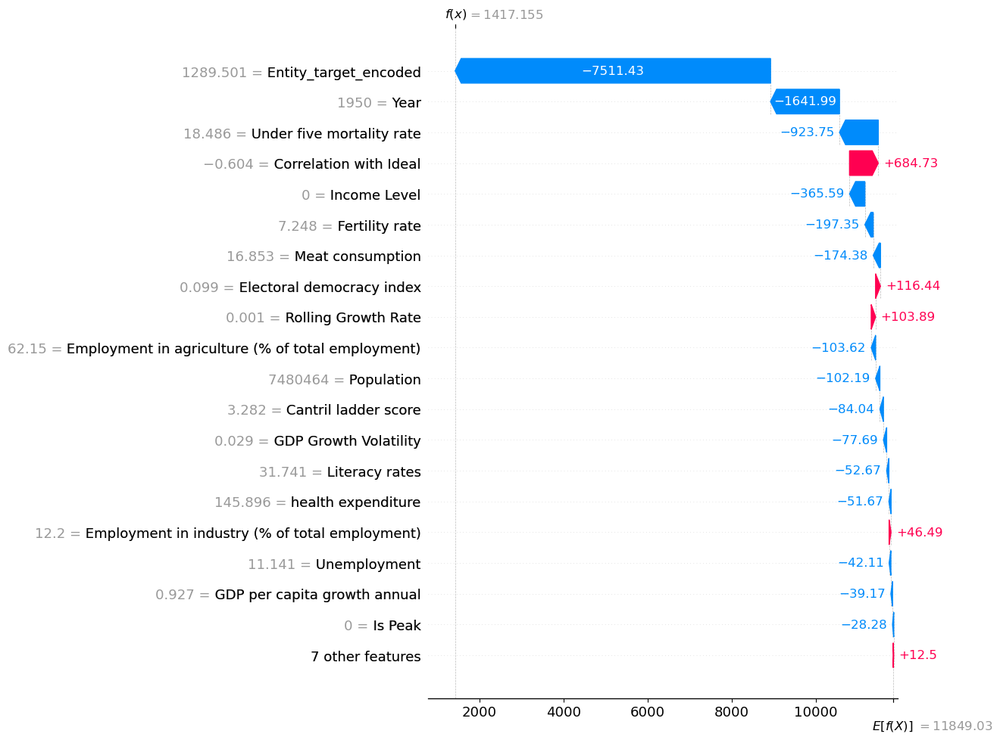

In [130]:
explainer = shap.Explainer(best_model)
shap_values = explainer(X_train_df)
shap.plots.waterfall(shap_values[0], max_display=20)

**Using X_test_df for SHAP Analysis**

  **Objective:** Evaluating how the model generalizes its learned patterns to make predictions on new, unseen data. we tought This can highlight how reliable or consistent the model's decision-making process is when faced with new examples.
  
  **Use Case:** Essential for assessing model performance and trustworthiness in a production setting or before deploying the model. It helps in understanding the model's behavior on data it has not seen during training.
  
  **Limitation:** The insights gained might not directly inform about the training process or feature engineering but rather about the model's generalization capabilities.

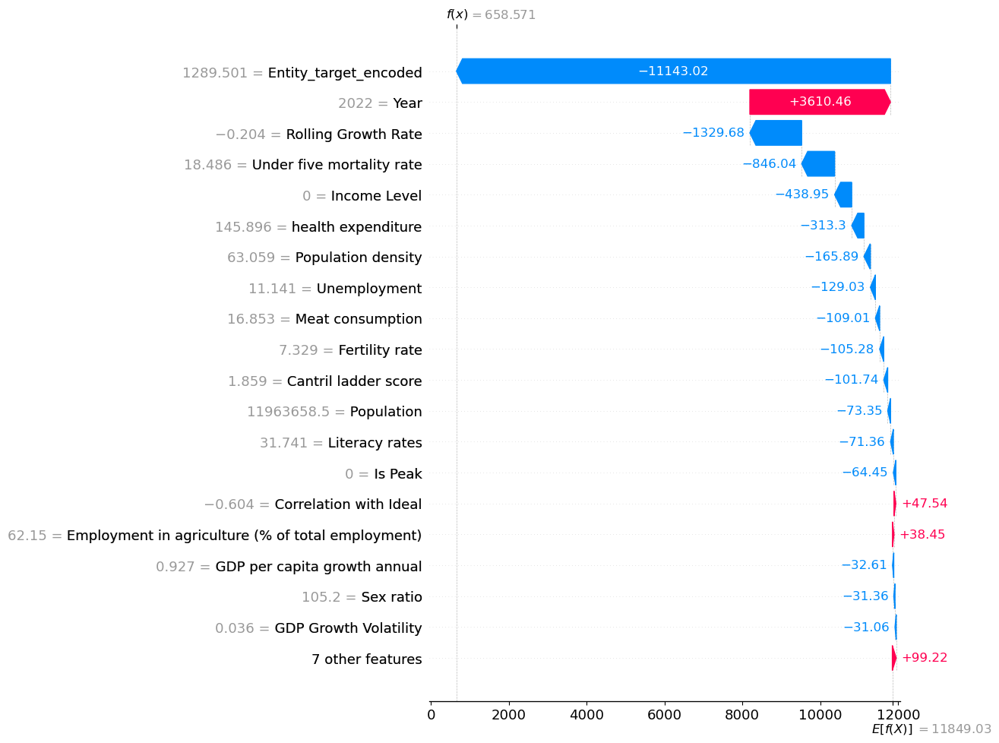

In [131]:
explainer = shap.Explainer(best_model)
shap_values = explainer(X_test_df)
shap.plots.waterfall(shap_values[0], max_display=20)

In [132]:
val_to_predicted = concat_df.iloc[[13001]][FEATURES]
predict_one_value = best_model.predict(np.array(val_to_predicted))
print(predict_one_value)

[4372.472]


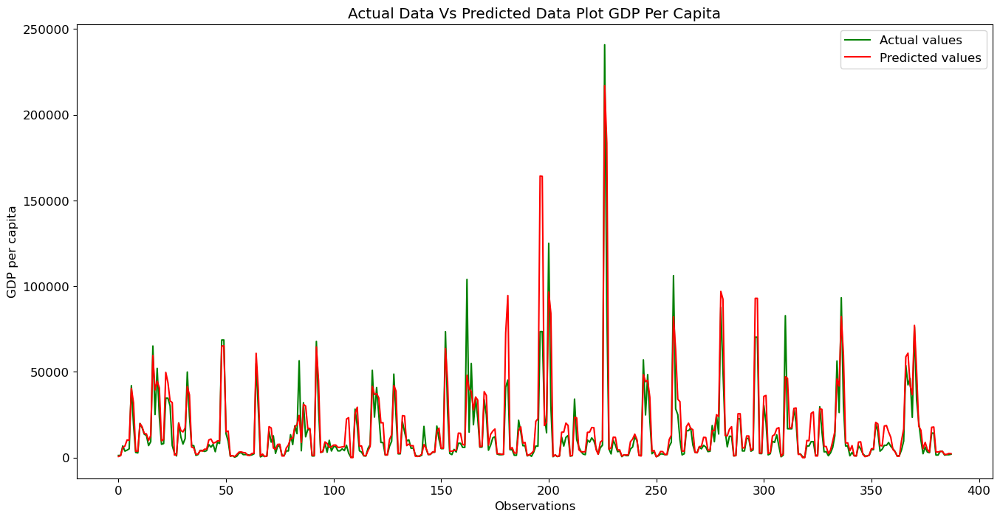

In [133]:
data_name = 'GDP Per Capita'
plot_predictions(y_test, test_predictions)

**GridSearchCV without Early Stopping:**

   **Approach:** here we wanted to Utilize scikit-learn's GridSearchCV to systematically explore a grid of hyperparameters, performing cross-validation for each combination and selecting the best model based on cross-validation scores.
    
   **Key Features:** Automating hyperparameter tuning and model selection but we do not inherently support early stopping within the grid search process. It's more streamlined but we think it might not capture the best hyperparameters if the model would benefit significantly from early stopping.
    
   **Usage:** probably Suitable for exhaustive hyperparameter tuning when model training time is not excessively long, and early stopping is not critical for model performance.

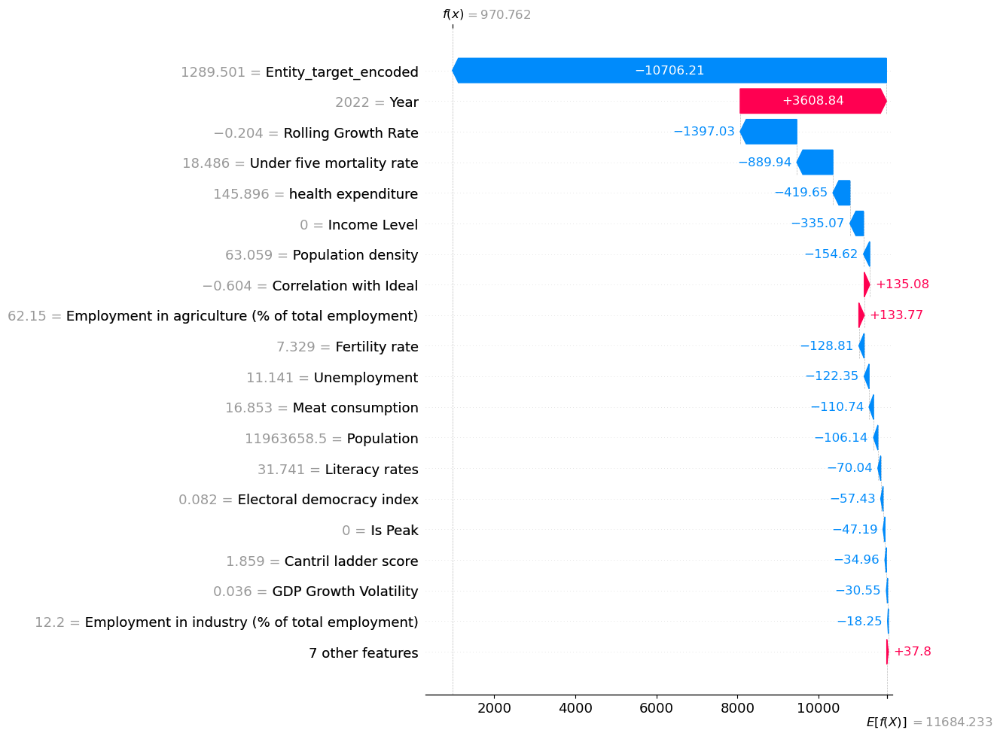

In [134]:
parameters = {'n_estimators': [50, 100, 150], 'learning_rate': [0.01, 0.05, 0.1]}

model = XGBRegressor()
grid_search = GridSearchCV(model, parameters, cv=3, scoring='neg_mean_squared_error')

grid_search.fit(X_train_df, y_train)
best_model = grid_search.best_estimator_
_
explainer = shap.Explainer(best_model)
shap_values = explainer(X_test_df)
shap.plots.waterfall(shap_values[0], max_display=20)

In [135]:
val_to_predicted = concat_df.iloc[[13001]][FEATURES]
predict_one_value = best_model.predict(np.array(val_to_predicted))
print(predict_one_value)

[4660.0283]


**The bar plot version of the SHAP summary plot** displays the average impact of each feature on the model's output, with features ranked by the sum of SHAP value magnitudes across all samples. It provides a global view of feature importance.
Insights Gained: This plot helps in understanding which features are most influential across the entire dataset, on average.

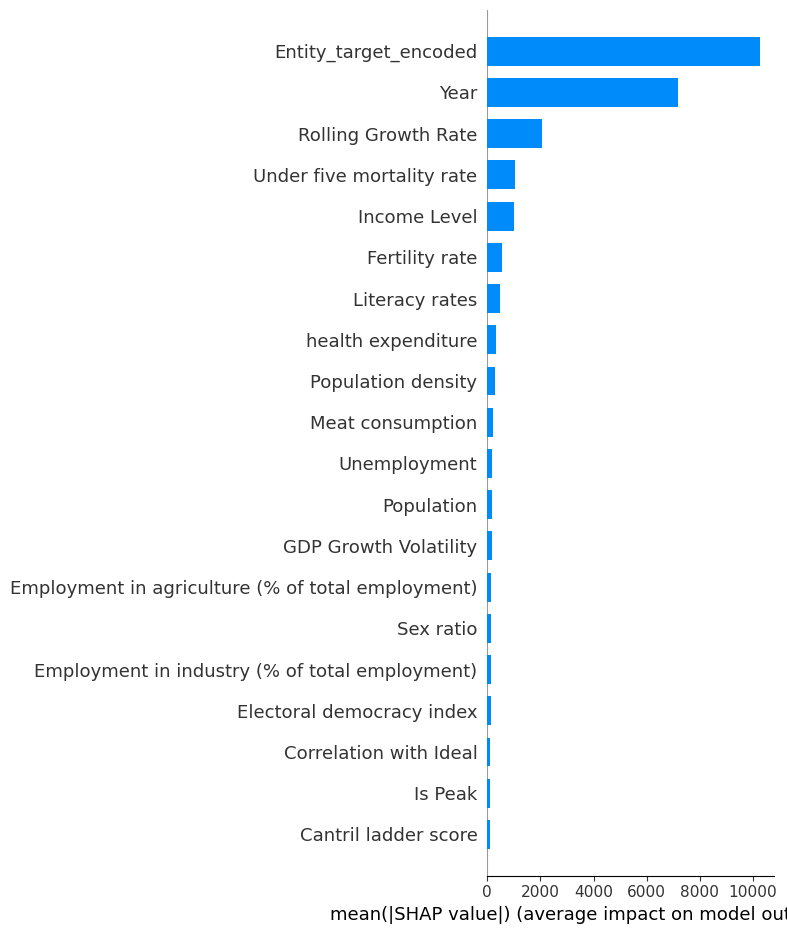

In [136]:
# 'feature importance' from SHAP values

shap.summary_plot(shap_values, X_test, plot_type='bar')

**Direct Model Specification with Early Stopping:**

  **Approach:**  here we Directly specifies hyperparameters for an XGBRegressor model and fits it to the training data with early stopping, using a separate test set as the evaluation set.
    
  **Key Features:** Early stopping is used, potentially leading to better generalization by preventing overfitting. This approach relies on specific hyperparameters chosen a priori rather than searching across a range of values.
  
  **Usage:** Effective after we examined some of hyperparameters and checked their results.

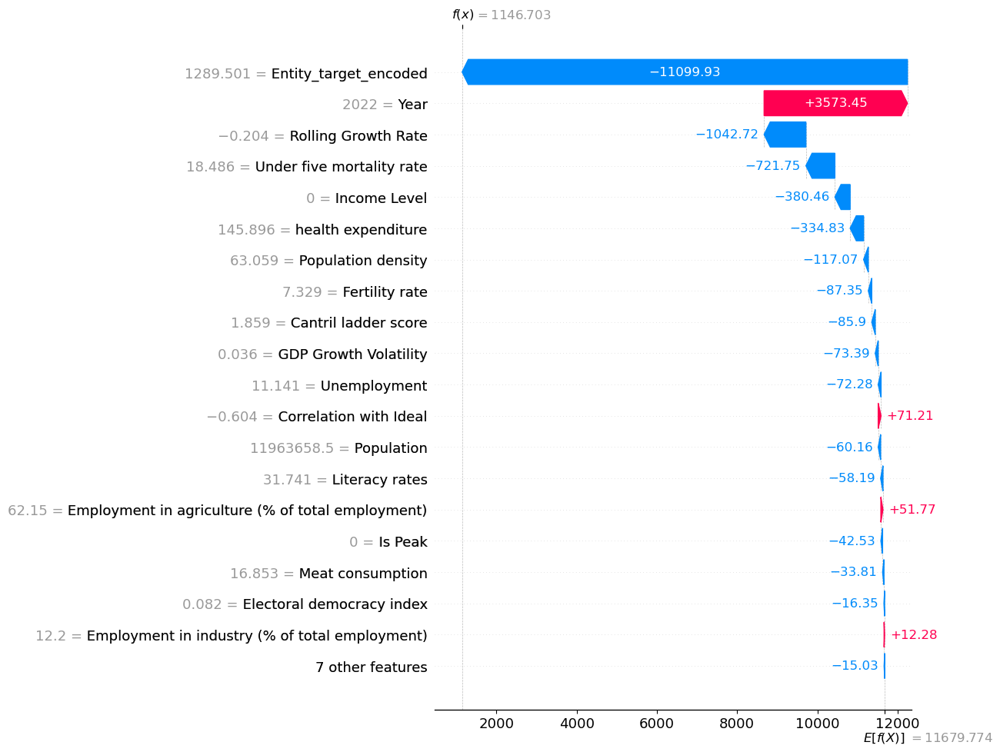

In [137]:
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.05)
xgb_model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], early_stopping_rounds=50, verbose=False)

explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test_df)
shap.plots.waterfall(shap_values[0], max_display=20)

In this graph we can see the top **20 features** identified as important by the SHAP values. Upon conducting the analysis, we found that 12 features had a discernible impact on the model's predictions, as revealed by the SHAP values. These features significantly influenced the model's decision-making process and played a crucial role in determining the outcome.
This group of features looks quite interesting due to the fact that they are quite diverse. 

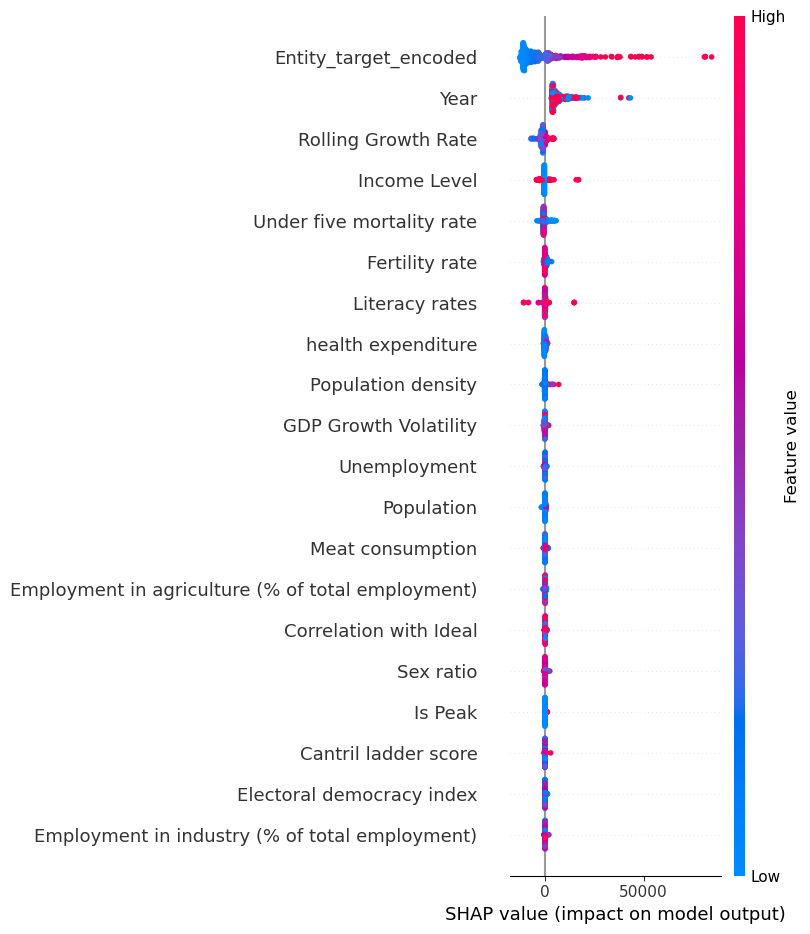

,Feature,XGB
0,Year,True
1,Fertility rate,True
2,Entity_target_encoded,True
3,Correlation with Ideal,True
4,Employment in agriculture (% of total employment),True
5,Electoral democracy index,True
6,Sex ratio,True
7,Meat consumption,True
8,suicide rate,True
9,Employment in industry (% of total employment),True


In [139]:
# Summary plot for all predictions to understand the overall impact of features

shap.summary_plot(shap_values, X_test)

# Convert SHAP values to DataFrame for detailed analysis (optional)

feature_names = X_test_df.columns.tolist()
shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# Determining the mean SHAP value for each feature as a measure of importance without taking absolute values

feature_importance = shap_df.mean().sort_values(ascending=False)

# Creating a DataFrame to indicate whether a feature is important
# using 'important' based on a threshold, e.g., top 50% of features

threshold = feature_importance.median()
important_features_df = pd.DataFrame({
    'Feature': feature_importance.index,
    'XGB': feature_importance > threshold
})

# Reset index to have normal indexes

important_features_df.reset_index(drop=True, inplace=True)

important_features_df

In [140]:
# create a function of the visualization
def plot_predictions(y_test, predictions):
    """
    Plot the predicted and actual data.

    Args:
        y_test (numpy.ndarray): Actual test target data.
        predictions (numpy.ndarray): Predicted test target data.
    """

    plt.figure(figsize=(16, 8))
    plt.plot(y_test, color='green', label="Actual values")
    plt.plot(predictions, color='red', label="Predicted values")

    plt.title(f"Actual Data Vs Predicted Data Plot {data_name}")
    plt.legend()
    plt.xlabel("Observations")
    plt.ylabel("GDP per capita")

In [141]:
predictions = xgb_model.predict(X_test)

In [142]:
predictions

array([  1544.0287,   1842.2726,   8116.3076,   8116.3076,   8910.953 ,   8910.953 ,  35169.676 ,  31756.73  ,   4333.0654,   4202.4214,  18516.715 ,  17932.889 ,  17665.129 ,  17288.188 ,
        11189.486 ,  12318.305 ,  48153.684 ,  40820.188 ,  40661.55  ,  39551.49  ,   9539.601 ,   9539.601 ,  45870.113 ,  46019.375 ,  32957.69  ,  32957.69  ,   2209.9424,   2209.9424,
        18234.947 ,  17945.098 ,  17409.064 ,  18392.121 ,  38631.3   ,  37629.05  ,   7495.6187,   7343.25  ,   2612.8274,   2780.4265,   4768.616 ,   4768.616 ,   5527.63  ,   5527.63  ,
        11324.053 ,  11197.771 ,   8352.764 ,   8352.764 ,  10164.897 ,  10296.315 ,  61082.26  ,  61082.26  ,  17149.71  ,  17356.088 ,   1737.0795,   1904.6788,   1554.111 ,   1721.7104,
         3912.3032,   3912.3032,   3797.665 ,   3397.5264,   1901.6991,   1901.6991,   3146.9805,   3314.5796,  49478.164 ,  40130.27  ,   1688.7429,   1856.3424,   1575.2744,   1699.6624,
        17669.53  ,  17183.531 ,   7252.251 ,   6991.40

In [143]:
concat_df.iloc[[13001]]

,Year,health expenditure,Fertility rate,Literacy rates,GDP per capita growth annual,Meat consumption,Cantril ladder score,Population density,Population,Sex ratio,suicide rate,Under five mortality rate,Electoral democracy index,Unemployment,Continent_0,Continent_1,Continent_2,Employment in agriculture (% of total employment),Employment in industry (% of total employment),Income Level,Rolling Growth Rate,Correlation with Ideal,Is Peak,Is Trough,GDP Growth Volatility,Entity_target_encoded,Entity_label_encoded,GDP per capita
13001,2001,136.16768,4.0722,99.385529,3.138756,39.207863,7.284,143.36667,103224.0,108.4,5.1,1.650719,0.558,4.337,1,1,0,32.64,30.56,0,0.017021,-0.616765,0,0,0.020317,4059.806238,175,4956.9653


In [144]:
val_to_predicted = concat_df.iloc[[13001]][FEATURES]

In [145]:
predict_one_value = xgb_model.predict(np.array(val_to_predicted))

In [146]:
predict_one_value

array([4789.363], dtype=float32)

We're evaluating the performance of an **XGBoost** regression model. By calculating metrics like **Mean Squared Error (MSE)**, **Mean Absolute Error (MAE)**, and **R-squared (R^2)**, we're comparing the XGBoost model's predictive accuracy to that of other models. This analysis helps us determine which model performs best for our task of predicting GDP per capita.

In [147]:
mse = mean_squared_error(y_test, predictions)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

# Print performance metrics
print(f'Overall MSE: {mse}')
print(f'Overall MAE: {mae}')
print(f'Overall R^2: {r2}')

# Store performance metrics in a dictionary
model_performance = []
model_performance.append({
    "Model": "XGB",
    "MSE": mse,
    "MAE": mae,
    "R^2": r2,
})

Overall MSE: 131698057.93898797
Overall MAE: 5864.131158775703
Overall R^2: 0.7355745132715941


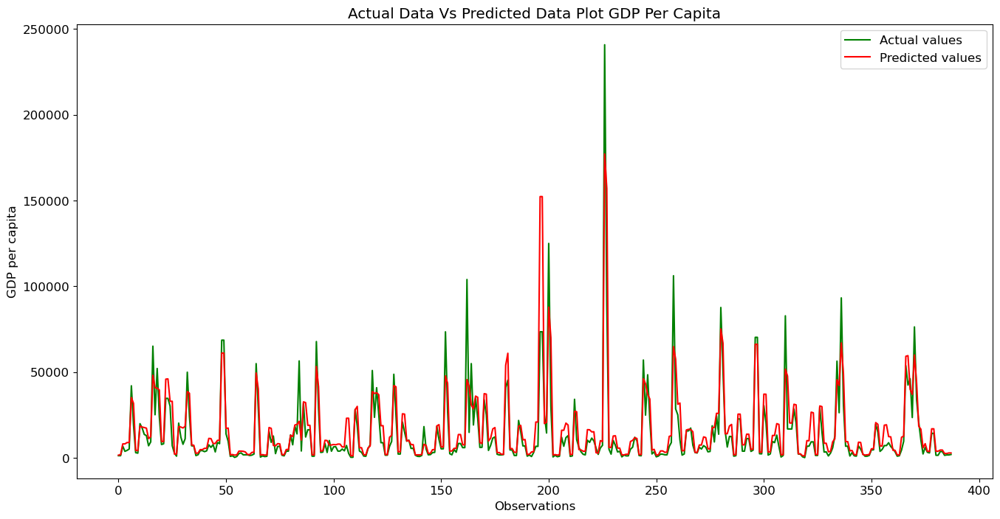

In [148]:
data_name = 'GDP Per Capita'
plot_predictions(y_test, predictions)

## LightGBM

In [149]:
l_model = LGBMRegressor(n_estimators=1000, learning_rate=0.05)
l_model.fit(X_train, y_train,
            eval_set=[(X_train, y_train), (X_test, y_test)])

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4683
[LightGBM] [Info] Number of data points in the train set: 13968, number of used features: 26
[LightGBM] [Info] Start training from score 11684.524542


LGBMRegressor(learning_rate=0.05, n_estimators=1000)

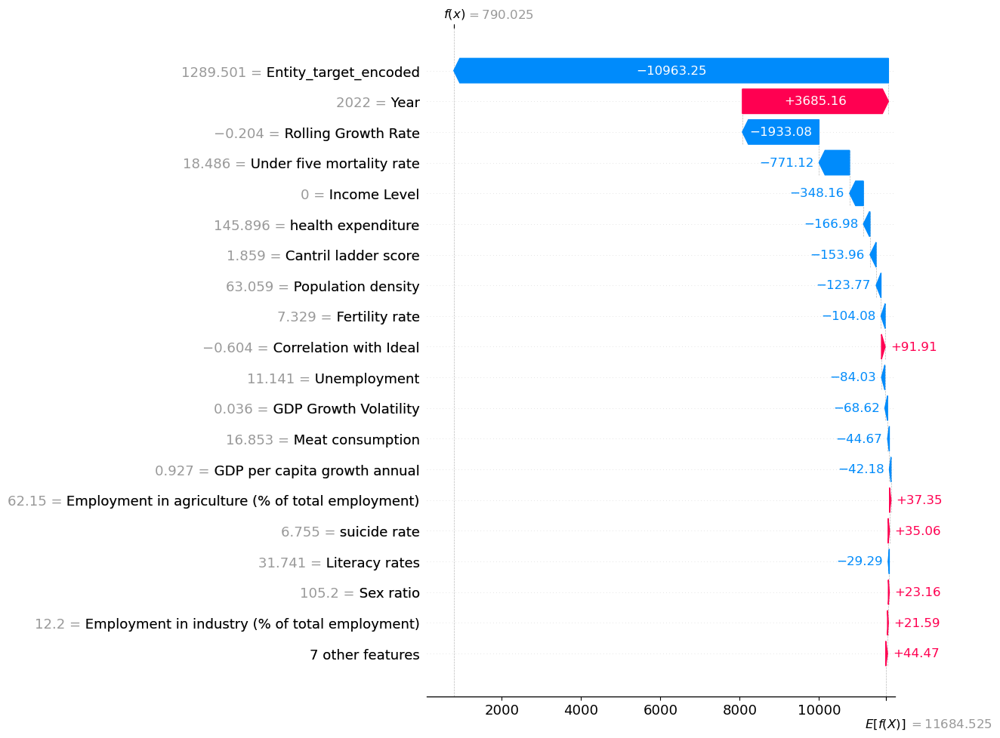

In [150]:
explainer = shap.Explainer(l_model)
shap_values = explainer(X_test_df)
shap.plots.waterfall(shap_values[0], max_display=20)

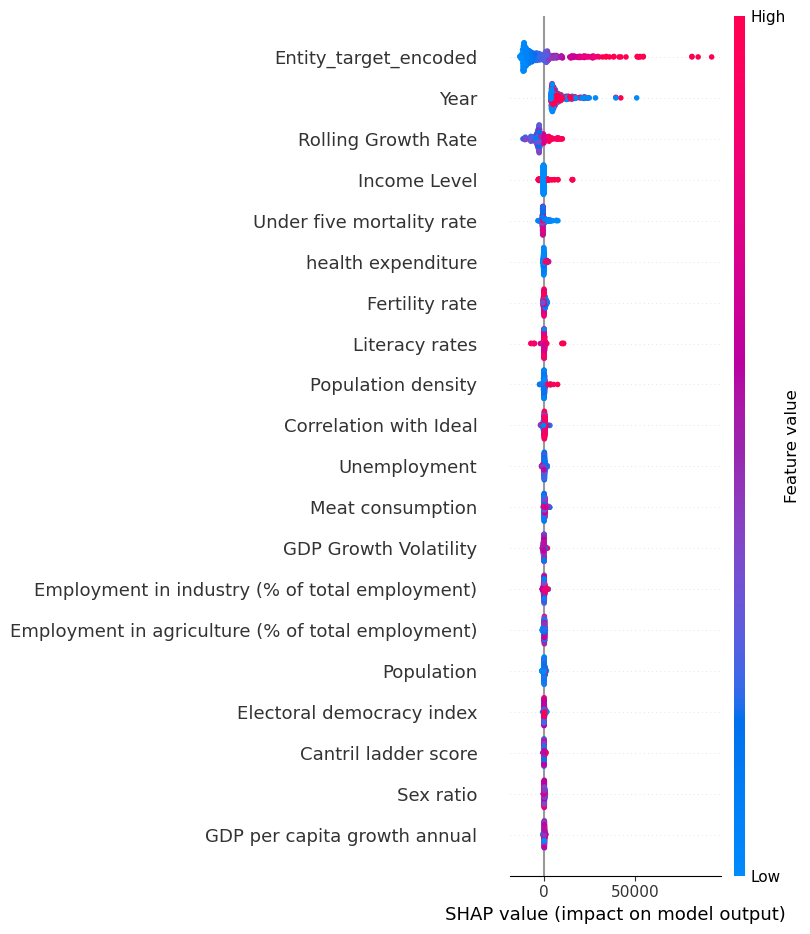

,Feature,XGB,LightGBM
0,Year,True,True
1,Fertility rate,True,True
2,Entity_target_encoded,True,True
3,Correlation with Ideal,True,True
4,Employment in agriculture (% of total employment),True,False
5,Electoral democracy index,True,True
6,Sex ratio,True,True
7,Meat consumption,True,True
8,suicide rate,True,True
9,Employment in industry (% of total employment),True,False


In [151]:
# Summaring plot for all predictions to understand the overall impact of features

shap.summary_plot(shap_values, X_test_df)

# Converting SHAP values to DataFrame for detailed analysis (optional)

feature_names = X_test_df.columns.tolist()
shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# Determining the mean SHAP value for each feature as a measure of importance without taking absolute values

feature_importance = shap_df.mean().sort_values(ascending=False)

# Creating a DataFrame to indicate whether a feature is important using 'important' based on a threshold, e.g., top 50% of features

threshold = feature_importance.median()
important_features_df['LightGBM'] = important_features_df['Feature'].apply(lambda x: feature_importance[x] > threshold)

# Merge new feature importance information with existing important_features_df

important_features_df

In [152]:
predictions = l_model.predict(X_test)

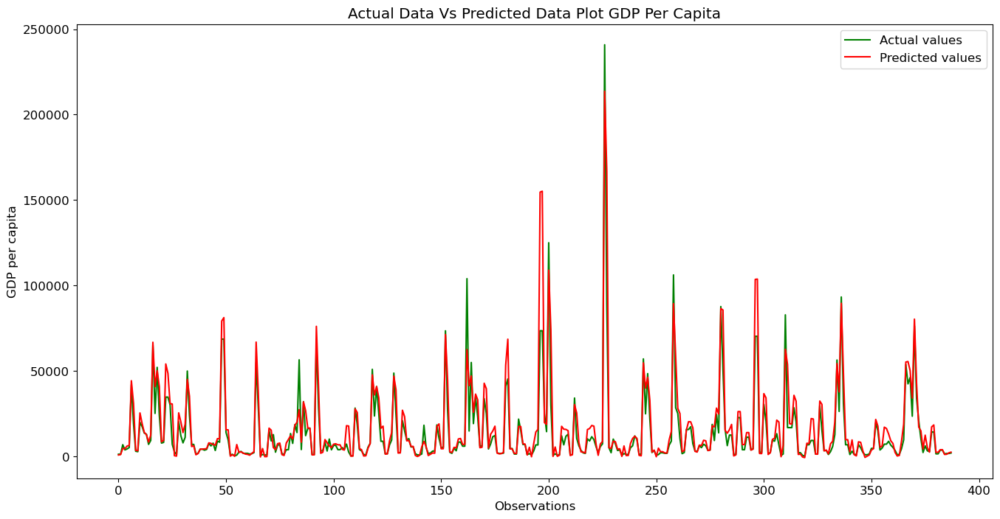

In [153]:
plot_predictions(y_test, predictions)

In [154]:
mse = mean_squared_error(y_test, predictions)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f'Overall MSE: {mse}')
print(f'Overall MAE: {mae}')
print(f'Overall R^2: {r2}')
model_performance.append({
    "Model": "LGBM",
    "MSE": mse,
    "MAE": mae,
    "R^2": r2,
})

Overall MSE: 111175893.57383929
Overall MAE: 4880.675408284624
Overall R^2: 0.7767792461727334


In [155]:
predict_one_value = l_model.predict(np.array(val_to_predicted))

In [156]:
predict_one_value

array([4472.20483735])

## Random Forest

In [157]:
# random forest implementation
rf_model = RandomForestRegressor(n_estimators=100, max_depth=10)
rf_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=10)

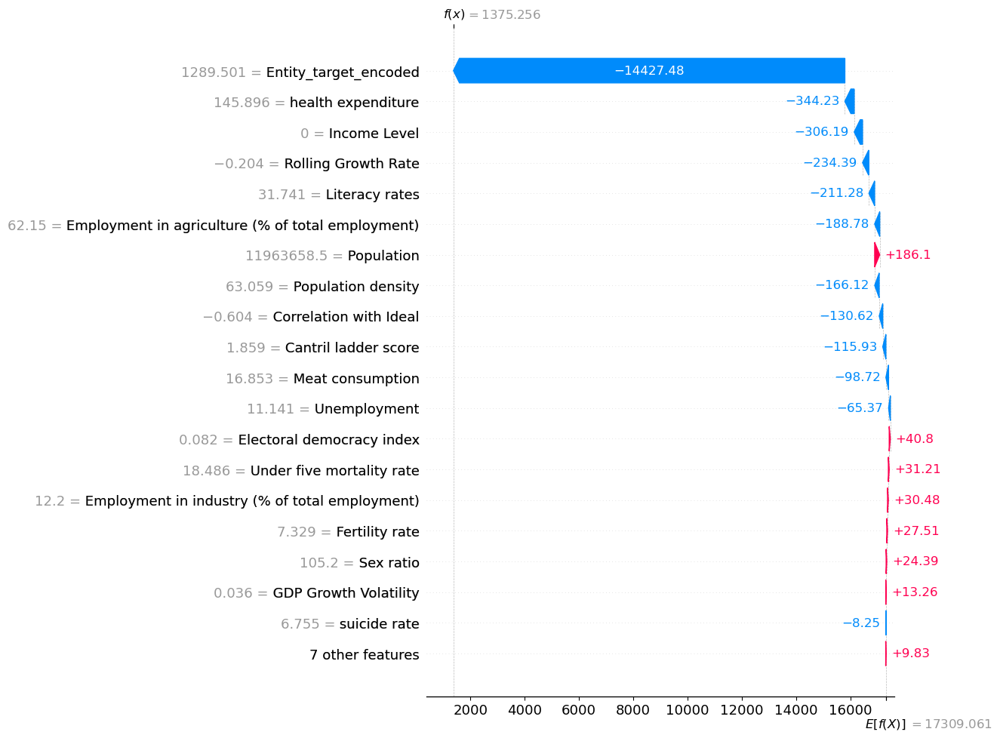

In [158]:
explainer = shap.Explainer(rf_model, X_test_df, model_output="raw", shapley_values="tree_path_dependent")
shap_values = explainer(X_test_df)
shap.plots.waterfall(shap_values[0], max_display=20)

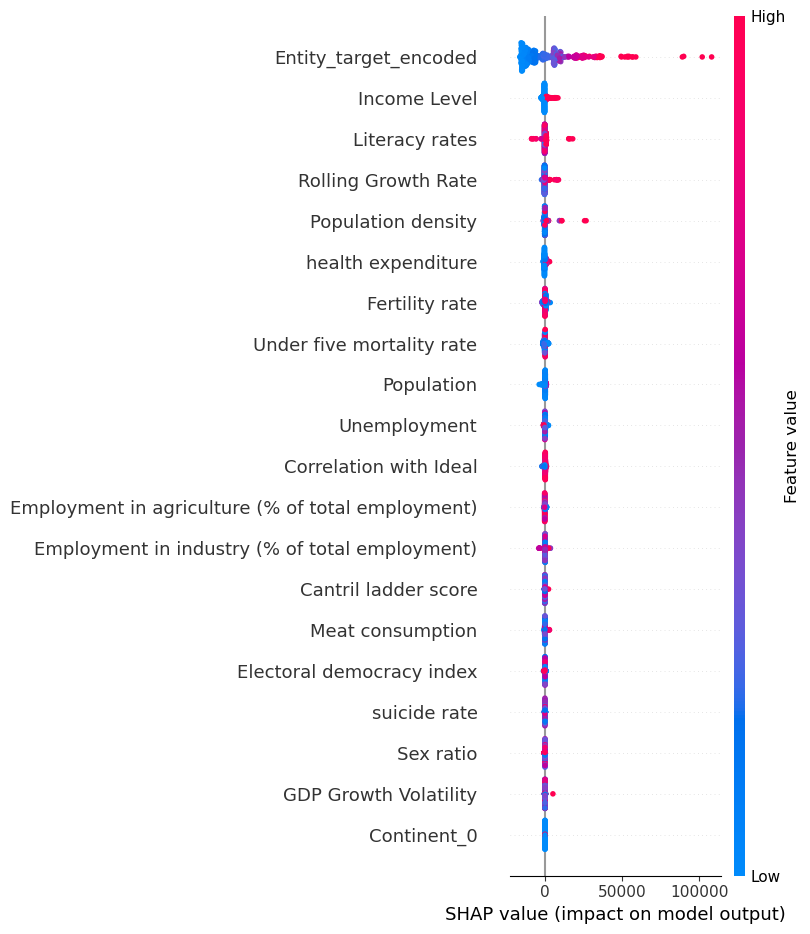

,Feature,XGB,LightGBM,Random Forest
0,Year,True,True,False
1,Fertility rate,True,True,False
2,Entity_target_encoded,True,True,True
3,Correlation with Ideal,True,True,True
4,Employment in agriculture (% of total employment),True,False,True
5,Electoral democracy index,True,True,False
6,Sex ratio,True,True,False
7,Meat consumption,True,True,False
8,suicide rate,True,True,False
9,Employment in industry (% of total employment),True,False,True


In [159]:
# Summary plot for all predictions to understand the overall impact of features

shap.summary_plot(shap_values, X_test_df)

# Converting SHAP values to DataFrame for detailed analysis (optional)

feature_names = X_test_df.columns.tolist()
shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# Determining the mean SHAP value for each feature as a measure of importance without taking absolute values
feature_importance = shap_df.mean().sort_values(ascending=False)

# Creating a DataFrame to indicate whether a feature is important using 'important' based on a threshold, e.g., top 50% of features

threshold = feature_importance.median()
important_features_df['Random Forest'] = important_features_df['Feature'].apply(lambda x: feature_importance[x] > threshold)

# Merging new feature importance information with existing important_features_df
important_features_df

In [160]:
predictions = rf_model.predict(X_test)

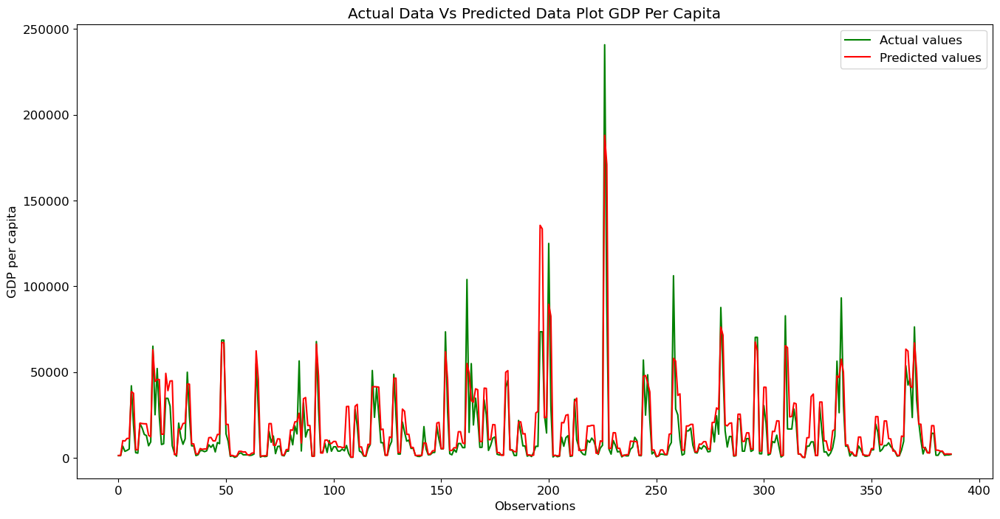

In [161]:
plot_predictions(y_test, predictions)

In [162]:
mse = mean_squared_error(y_test, predictions)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f'Overall MSE: {mse}')
print(f'Overall MAE: {mae}')
print(f'Overall R^2: {r2}')
model_performance.append({
    "Model": "RANDOM FOREST",
    "MSE": mse,
    "MAE": mae,
    "R^2": r2,
})

Overall MSE: 145119809.68591052
Overall MAE: 6533.786527955595
Overall R^2: 0.708626103447115


In [163]:
predictions = rf_model.predict(np.array(val_to_predicted))
predictions

array([4818.24591967])

## CatBoost

In [164]:
# Creating a CatBoostRegressor model

catboost_model = CatBoostRegressor(
    
    # Equivalent to n_estimators in XGBoost
    
    iterations=100,  
    learning_rate=0.05,
    early_stopping_rounds=50,
    verbose=False
)

# Fitting the model to the training data

catboost_model.fit(X_train, y_train, eval_set=(X_test, y_test))

In [165]:
predictions = catboost_model.predict(X_test)

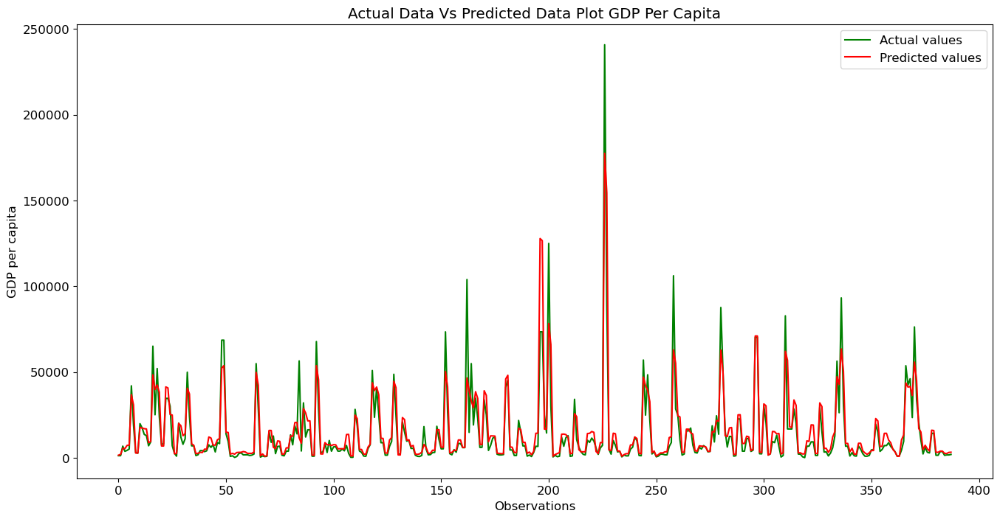

In [166]:
plot_predictions(y_test, predictions)

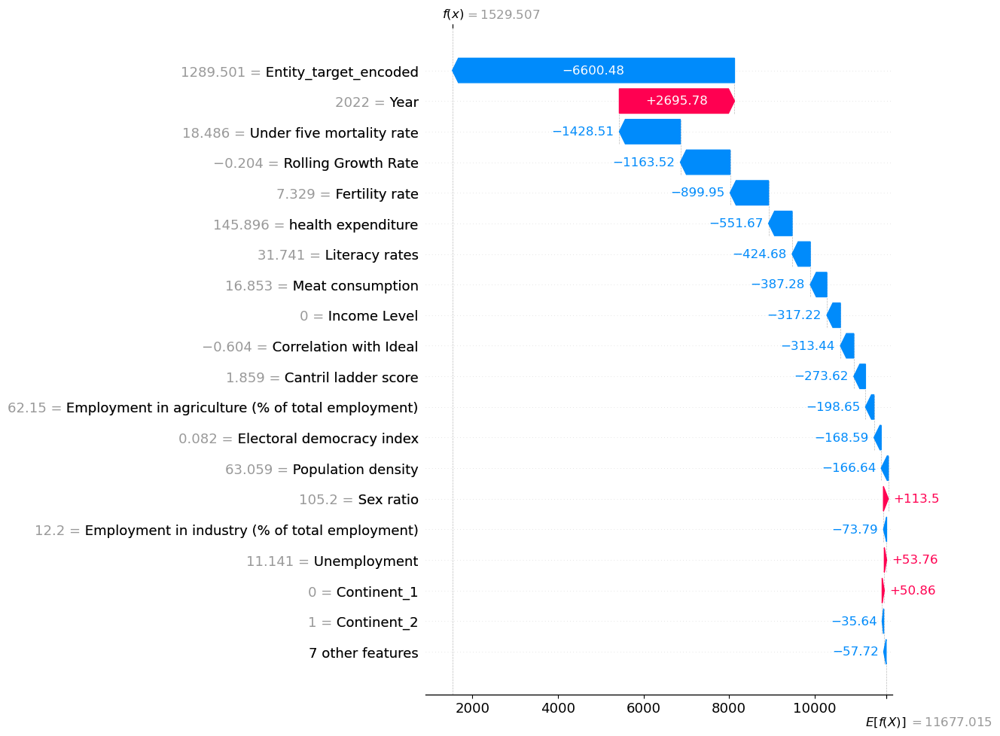

In [167]:
explainer = shap.Explainer(catboost_model)
shap_values = explainer(X_test_df)
shap.plots.waterfall(shap_values[0], max_display=20)

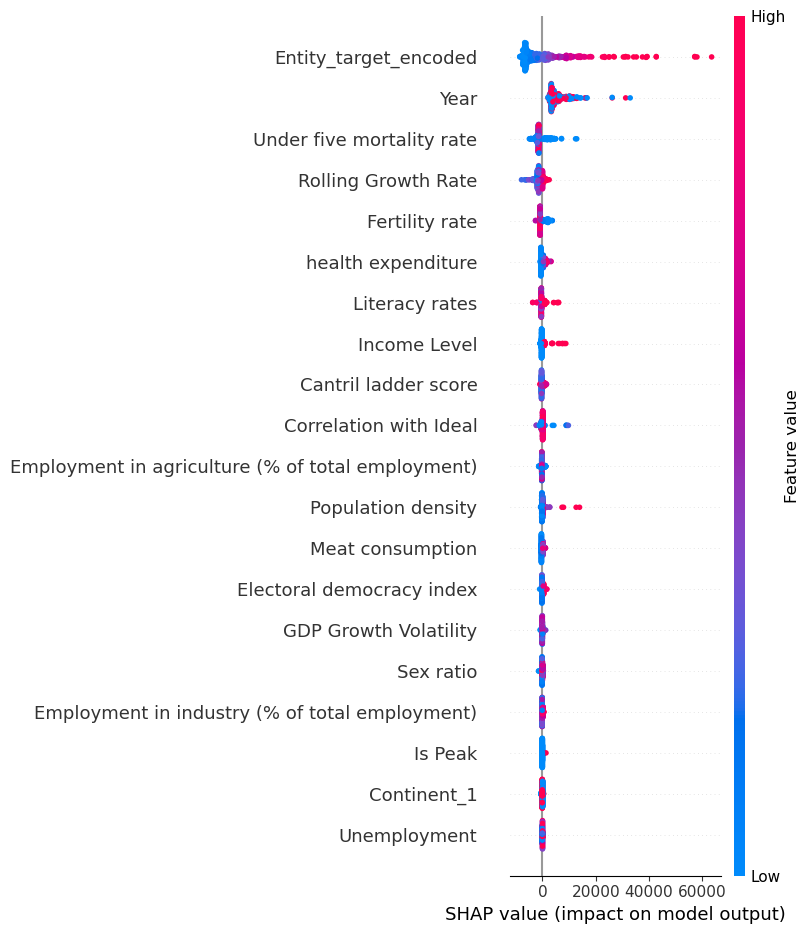

,Feature,XGB,LightGBM,Random Forest,Catboost
0,Year,True,True,False,True
1,Fertility rate,True,True,False,False
2,Entity_target_encoded,True,True,True,True
3,Correlation with Ideal,True,True,True,True
4,Employment in agriculture (% of total employment),True,False,True,False
5,Electoral democracy index,True,True,False,True
6,Sex ratio,True,True,False,False
7,Meat consumption,True,True,False,False
8,suicide rate,True,True,False,True
9,Employment in industry (% of total employment),True,False,True,True


In [168]:
# Summarring plot for all predictions to understand the overall impact of features

shap.summary_plot(shap_values, X_test_df)

# Converting SHAP values to DataFrame for detailed analysis (optional)

feature_names = X_test_df.columns.tolist()
shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# Determining the mean SHAP value for each feature as a measure of importance without taking absolute values

feature_importance = shap_df.mean().sort_values(ascending=False)

# Creating a DataFrame to indicate whether a feature is important using 'important' based on a threshold, e.g., top 50% of features

threshold = feature_importance.median()
important_features_df['Catboost'] = important_features_df['Feature'].apply(lambda x: feature_importance[x] > threshold)

# Merging new feature importance information with existing important_features_df

important_features_df

In [169]:
mse = mean_squared_error(y_test, predictions)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f'Overall MSE: {mse}')
print(f'Overall MAE: {mae}')
print(f'Overall R^2: {r2}')
model_performance.append({
    "Model": "CATBOOST",
    "MSE": mse,
    "MAE": mae,
    "R^2": r2,
})

Overall MSE: 105275421.07973948
Overall MAE: 4979.086674132796
Overall R^2: 0.7886263100975692


In [170]:
predictions = catboost_model.predict(np.array(val_to_predicted))
predictions

array([4849.87146242])

## FBProphet Model

In [171]:
proph_data = train[["Year", "GDP per capita"]].copy()
proph_data.columns = ['ds', 'y']
proph_data.head()

,ds,y
0,1950,1156.0
1,1951,1170.0
2,1952,1189.0
3,1953,1240.0
4,1954,1245.0


In [172]:
# Training the model

model = Prophet()
model.fit(proph_data)

00:09:00 - cmdstanpy - INFO - Chain [1] start processing
00:09:01 - cmdstanpy - INFO - Chain [1] done processing


In [173]:
X_test_df

,Year,health expenditure,Fertility rate,Literacy rates,GDP per capita growth annual,Meat consumption,Cantril ladder score,Population density,Population,Sex ratio,suicide rate,Under five mortality rate,Electoral democracy index,Unemployment,Continent_0,Continent_1,Continent_2,Employment in agriculture (% of total employment),Employment in industry (% of total employment),Income Level,Rolling Growth Rate,Correlation with Ideal,Is Peak,Is Trough,GDP Growth Volatility,Entity_target_encoded
0,2022.0,145.895580,7.32950,31.741119,0.927029,16.852923,1.85900,63.058693,11963658.5,105.2,6.7550,18.486127,0.082,11.141,0.0,0.0,1.0,62.15,12.20,0.0,-0.204124,-0.603899,0.0,0.0,0.036103,1289.500947
1,2023.0,145.895580,7.32950,31.741119,0.927029,16.852923,3.28165,64.762210,11963658.5,105.2,6.7550,18.486127,0.094,11.141,0.0,0.0,1.0,62.15,12.20,0.0,-0.089298,-0.603899,0.0,0.0,0.126286,1289.500947
2,2022.0,449.829400,3.16025,97.246971,3.897741,19.362067,5.27730,103.734230,2883291.0,107.8,4.8500,2.786550,0.484,15.870,0.0,1.0,0.0,47.38,15.76,0.0,-0.217844,0.858213,0.0,0.0,0.442796,5197.204401
3,2023.0,449.829400,3.16025,97.246971,3.897741,19.362067,4.92085,103.373830,2883291.0,107.8,4.8500,2.786550,0.175,15.870,0.0,1.0,0.0,47.38,15.76,0.0,-0.487726,0.858213,0.0,0.0,0.061126,5197.204401
4,2022.0,675.979465,5.79995,72.648682,1.592497,17.529633,5.32910,18.853111,22507735.0,104.7,3.0750,5.716472,0.281,13.790,0.0,1.0,1.0,18.54,26.76,0.0,-0.294327,0.927306,0.0,1.0,0.441675,6340.437546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
383,2023.0,183.287790,7.90765,61.494301,1.022877,11.745722,3.65790,65.249590,11251185.0,106.0,7.4900,14.397106,0.113,12.366,0.0,0.0,1.0,29.90,14.40,0.0,0.000000,0.993467,0.0,0.0,0.000000,3130.785141
384,2022.0,135.868990,6.67520,68.575508,0.561271,14.548771,3.98220,26.927547,6788713.0,101.0,19.3637,16.495990,0.518,12.930,0.0,1.0,1.0,70.07,7.54,0.0,-0.266601,0.148097,0.0,1.0,0.400635,1935.326505
385,2023.0,135.868990,6.67520,68.575508,0.561271,14.548771,4.24185,27.670183,6788713.0,101.0,19.3637,16.495990,0.277,12.930,0.0,1.0,1.0,70.07,7.54,0.0,-0.197351,0.148097,0.0,0.0,0.498570,1935.326505
386,2022.0,204.044990,5.79560,83.547646,-0.132760,13.128580,3.20350,42.188286,8836782.0,102.6,26.5383,9.819218,0.285,4.993,0.0,1.0,1.0,64.51,9.85,0.0,-0.072257,0.845331,0.0,1.0,0.190881,1949.638414


In [174]:
val_to_pred = pd.DataFrame({'ds': X_test_df['Year']})

# Predicting on valid set

y_pred = model.predict(val_to_pred)

In [175]:
# Calcuatting metrics

score_mae = mean_absolute_error(y_test, y_pred.tail(388)['yhat'])
score_rmse = math.sqrt(mean_squared_error(y_test, y_pred.tail(388)['yhat']))

print('RMSE: {}'.format(score_rmse))

RMSE: 23128.376468332594


In [176]:
# Convert 'Year' to datetime format
concat_df['ds'] = pd.to_datetime(concat_df['Year'], format='%Y')

# Assuming you've already grouped your data by 'Entity' and 'Year' if needed
entities = concat_df['Entity_target_encoded'].unique()

predictions = {}

for entity in entities:
    entity_df = concat_df[concat_df['Entity_target_encoded'] == entity]

    # Ensure there's enough data for Prophet to work with
    if entity_df.shape[0] >= 2:
        model = Prophet()
        proph_data = pd.DataFrame()
        proph_data['ds'] = entity_df['ds']
        proph_data['y'] = entity_df['GDP per capita'].values  # Ensure correct assignment
        model.fit(proph_data)
        future = model.make_future_dataframe(periods=0)  # No additional future dates
        forecast = model.predict(future)
        predictions[entity] = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

00:09:52 - cmdstanpy - INFO - Chain [1] start processing
00:09:52 - cmdstanpy - INFO - Chain [1] done processing
00:09:52 - cmdstanpy - INFO - Chain [1] start processing
00:09:53 - cmdstanpy - INFO - Chain [1] done processing
00:09:53 - cmdstanpy - INFO - Chain [1] start processing
00:09:53 - cmdstanpy - INFO - Chain [1] done processing
00:09:54 - cmdstanpy - INFO - Chain [1] start processing
00:09:54 - cmdstanpy - INFO - Chain [1] done processing
00:09:54 - cmdstanpy - INFO - Chain [1] start processing
00:09:54 - cmdstanpy - INFO - Chain [1] done processing
00:09:55 - cmdstanpy - INFO - Chain [1] start processing
00:09:55 - cmdstanpy - INFO - Chain [1] done processing
00:09:55 - cmdstanpy - INFO - Chain [1] start processing
00:09:55 - cmdstanpy - INFO - Chain [1] done processing
00:09:56 - cmdstanpy - INFO - Chain [1] start processing
00:09:56 - cmdstanpy - INFO - Chain [1] done processing
00:09:56 - cmdstanpy - INFO - Chain [1] start processing
00:09:56 - cmdstanpy - INFO - Chain [1]

In [177]:
predictions

{1289.500947300153:            ds         yhat  yhat_lower   yhat_upper
 0  1950-01-01  1030.117555  513.388239  1525.546945
 1  1951-01-01  1045.306463  531.380181  1541.458054
 2  1952-01-01  1057.116558  576.484627  1542.367084
 3  1953-01-01  1034.433726  549.343152  1531.446162
 4  1954-01-01  1052.989912  548.658551  1538.099883
 ..        ...          ...         ...          ...
 69 2019-01-01  1435.756159  948.837975  1992.627096
 70 2020-01-01  1447.626729  938.535662  1960.167952
 71 2021-01-01  1425.004540  957.216867  1901.069170
 72 2022-01-01  1443.621202  934.846249  1939.101134
 73 2023-01-01  1458.870586  940.874855  1956.898567
 
 [74 rows x 4 columns],
 5197.20440106827:            ds          yhat   yhat_lower    yhat_upper
 0  1950-01-01    986.029723  -987.339414   2960.327190
 1  1951-01-01   1050.141003  -751.215556   2934.716739
 2  1952-01-01   1256.496876  -813.548809   3124.841734
 3  1953-01-01   1443.331019  -319.752262   3397.346408
 4  1954-01-01   1365

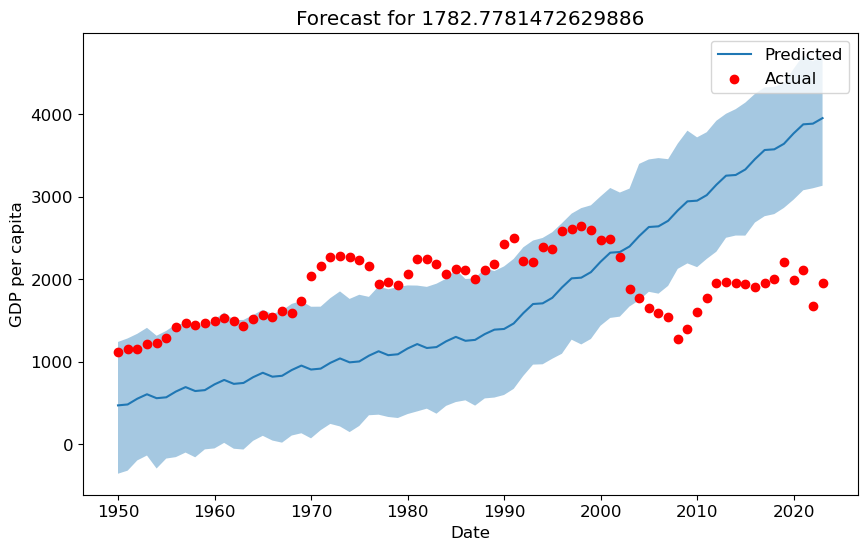

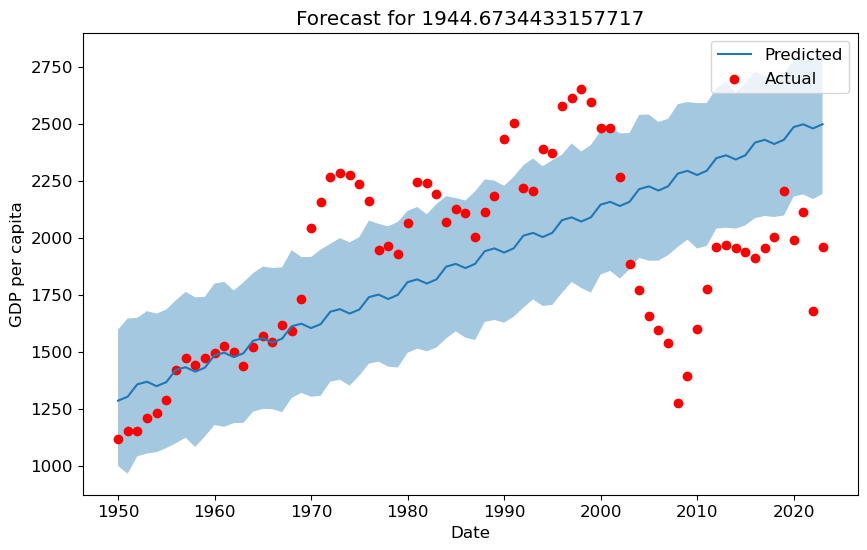

In [178]:
entities_to_plot = [1782.7781472629886, 1944.6734433157717]

for entity, forecast in predictions.items():
    if entity in entities_to_plot:
        plt.figure(figsize=(10, 6))
        plt.plot(forecast['ds'], forecast['yhat'], label='Predicted')
        plt.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], alpha=0.4)
        plt.scatter(proph_data['ds'], proph_data['y'], color='red', label='Actual')
        plt.title(f"Forecast for {entity}")
        plt.xlabel('Date')
        plt.ylabel('GDP per capita')
        plt.legend()
        plt.show()

## SARIMAX Model

In [189]:
model = SARIMAX(y_train, order=(1, 1, 1), seasonal_order=(0, 0, 0, 0), exog=X_train)
model_fit = model.fit()

# Making predictions

y_pred = model_fit.forecast(steps=len(X_test), exog=X_test)

print("Forecasts:", y_pred)

Forecasts: [ 3.40700767e+03  3.88636535e+03  9.94442550e+03  9.67190224e+03  7.20455947e+03  7.88643346e+03  2.66082669e+04  2.34283756e+04  4.64764337e+03  4.78864053e+03  1.63868365e+04  1.54414271e+04
  1.11220840e+04  1.12060206e+04  5.64338716e+03  6.47234495e+03  3.30065367e+04  2.91768663e+04  3.30113122e+04  3.01421025e+04  7.13182951e+03  7.65255388e+03  3.55228015e+04  3.49769386e+04
  2.53179063e+04  2.29367188e+04  6.77437746e+03  5.85663785e+03  1.41846549e+04  1.18100875e+04  1.31438753e+04  1.40359292e+04  3.42057954e+04  3.14434640e+04  7.99884558e+03  8.12889667e+03
  4.31979768e+03  5.17724143e+03  3.49144611e+03  3.62022872e+03  2.31403755e+03  2.88277514e+03  8.08302480e+03  8.04512018e+03  6.42969166e+03  5.64714831e+03  4.73671751e+03  4.79392575e+03
  7.63754428e+04  7.67901946e+04  1.39042629e+04  1.37574301e+04  2.78787092e+03  3.73940791e+03  4.45354257e+03  6.97786832e+03  4.99271323e+03  5.64013299e+03  2.92754137e+03  3.04638624e+03
  2.90385207e+03  2.9391

In [197]:
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Overall MSE: {mse}')
print(f'Overall MAE: {mae}')
print(f'Overall R^2: {r2}')
model_performance.append({
    "Model": "SARIMAX",
    "MSE": mse,
    "MAE": mae,
    "R^2": r2,
})

Overall MSE: 129671257.12109499
Overall MAE: 5521.99734768384
Overall R^2: 0.7396439566723552


In [198]:
value_predicted = model_fit.forecast(steps=1, exog=np.array(val_to_predicted))

In [199]:
value_predicted

array([6275.13011387])

In [200]:
concat_df.iloc[13001]

Year                                                                2001
health expenditure                                             136.16768
Fertility rate                                                    4.0722
Literacy rates                                                 99.385529
GDP per capita growth annual                                    3.138756
Meat consumption                                               39.207863
Cantril ladder score                                               7.284
Population density                                             143.36667
Population                                                      103224.0
Sex ratio                                                          108.4
suicide rate                                                         5.1
Under five mortality rate                                       1.650719
Electoral democracy index                                          0.558
Unemployment                                       

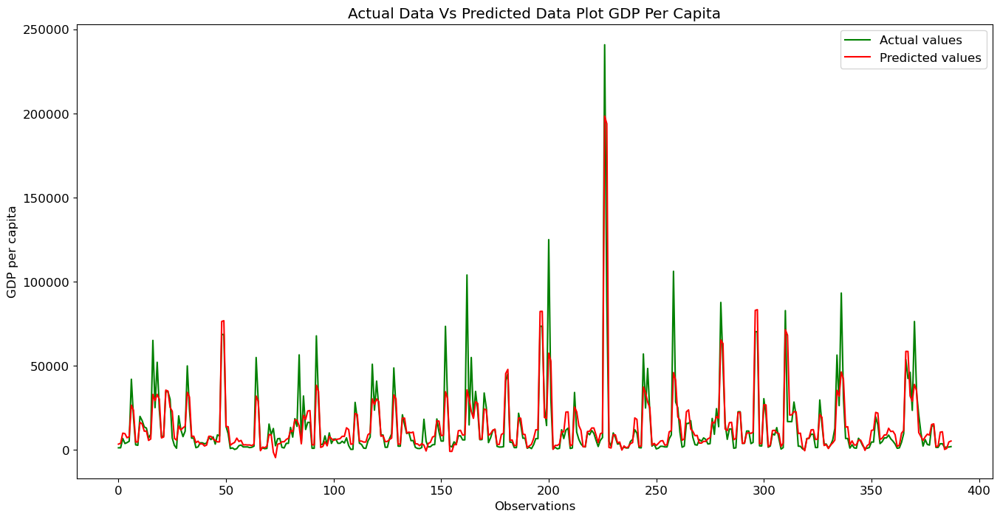

In [201]:
plot_predictions(y_test, y_pred)

  0%|          | 0/388 [00:00<?, ?it/s]

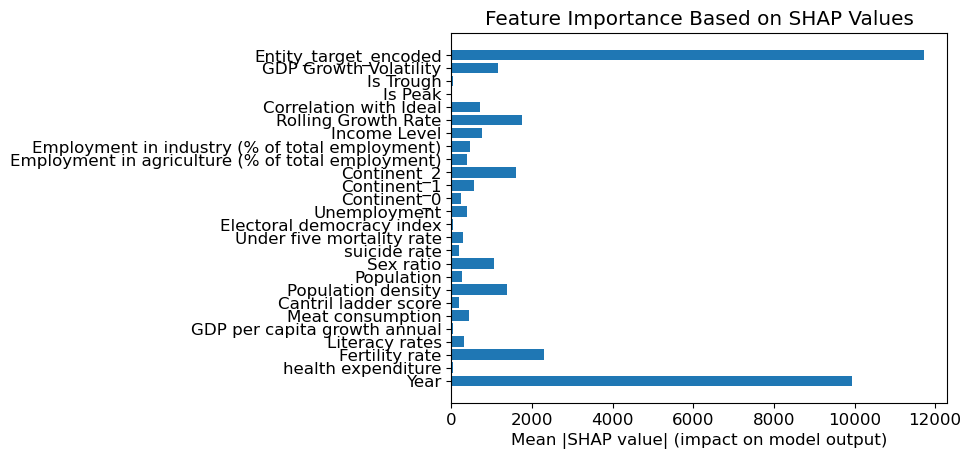

,Feature,XGB,LightGBM,Random Forest,Catboost,SARIMAX
0,Year,True,True,False,True,True
1,Fertility rate,True,True,False,False,True
2,Entity_target_encoded,True,True,True,True,True
3,Correlation with Ideal,True,True,True,True,True
4,Employment in agriculture (% of total employment),True,False,True,False,True
5,Electoral democracy index,True,True,False,True,True
6,Sex ratio,True,True,False,False,False
7,Meat consumption,True,True,False,False,True
8,suicide rate,True,True,False,True,False
9,Employment in industry (% of total employment),True,False,True,True,False


In [202]:
def sarimax_forecast(exog):
    forecast = model_fit.get_forecast(steps=exog.shape[0], exog=exog).predicted_mean
    return forecast

explainer = shap.KernelExplainer(sarimax_forecast, shap.kmeans(X_train, 10))
shap_values = explainer.shap_values(X_test, nsamples=100)
mean_shap_values = np.abs(shap_values).mean(axis=0)
plt.barh(feature_names, mean_shap_values)
plt.xlabel('Mean |SHAP value| (impact on model output)')
plt.title('Feature Importance Based on SHAP Values')
plt.show()

# Converting SHAP values to DataFrame for detailed analysis (optional)

feature_names = X_test_df.columns.tolist()
shap_df = pd.DataFrame(shap_values, columns=feature_names)

# Determining the mean SHAP value for each feature as a measure of importance without taking absolute values

feature_importance = shap_df.mean().sort_values(ascending=False)

# Creating a DataFrame to indicate whether a feature is important using 'important' based on a threshold, e.g., top 50% of features

threshold = feature_importance.median()
important_features_df['SARIMAX'] = important_features_df['Feature'].apply(lambda x: feature_importance[x] > threshold)

# Merging new feature importance information with existing important_features_df

important_features_df

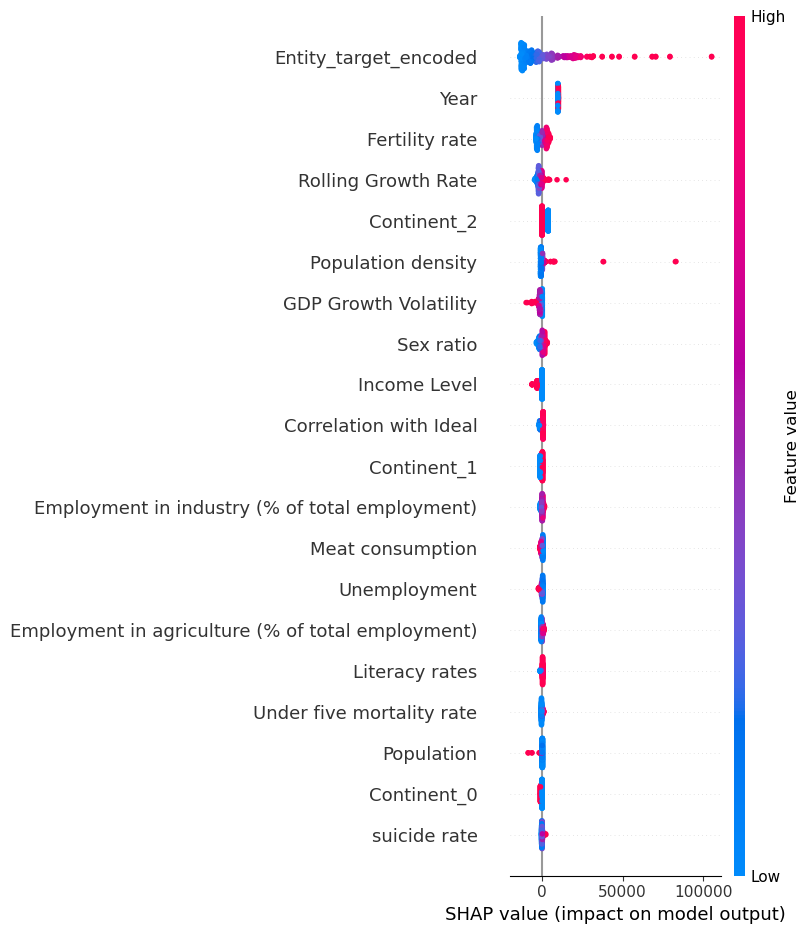

,Feature,XGB,LightGBM,Random Forest,Catboost,SARIMAX
0,Year,True,True,False,True,True
1,Fertility rate,True,True,False,False,True
2,Entity_target_encoded,True,True,True,True,True
3,Correlation with Ideal,True,True,True,True,True
4,Employment in agriculture (% of total employment),True,False,True,False,True
5,Electoral democracy index,True,True,False,True,True
6,Sex ratio,True,True,False,False,False
7,Meat consumption,True,True,False,False,True
8,suicide rate,True,True,False,True,False
9,Employment in industry (% of total employment),True,False,True,True,False


In [204]:
# Summaring plot for all predictions to understand the overall impact of features

shap.summary_plot(shap_values, X_test_df)

# Converting SHAP values to DataFrame for detailed analysis

feature_names = X_test_df.columns.tolist()
shap_df = pd.DataFrame(shap_values, columns=feature_names)

# Determining the mean SHAP value for each feature as a measure of importance without taking absolute values

feature_importance = shap_df.mean().sort_values(ascending=False)

# Creating a DataFrame to indicate whether a feature is important using 'important' based on a threshold, e.g., top 50% of features

threshold = feature_importance.median()
important_features_df['SARIMAX'] = important_features_df['Feature'].apply(lambda x: feature_importance[x] > threshold)

# Merging new feature importance information with existing important_features_df

important_features_df

# **Exponential Smoothing**

In [205]:
from statsmodels.tsa.api import ExponentialSmoothing

df = concat_df

# Ignoring convergence warnings

warnings.filterwarnings("ignore")  

# Placeholder lists for aggregated forecasts and actual values

all_forecasts = []
all_actuals = []

entities = df['Entity_label_encoded'].unique()

for entity in entities:
    entity_df = df[df['Entity_label_encoded'] == entity].set_index('Year')['GDP per capita']

    # Splitting into train and test sets
    
    train_size = int(len(entity_df) * 0.9)
    train, test = entity_df[0:train_size], entity_df[train_size:]

    # Fitting Exponential Smoothing model
    
    # Adjusting the model parameters based on your time series data
    
    # For example, using additive trend and seasonality with a seasonal period
    
    model = ExponentialSmoothing(train, trend="add", seasonal="add", seasonal_periods=30).fit()

    forecast = model.forecast(steps=len(test))

    # Appending forecasts and actual values for evaluation
    
    all_forecasts.extend(forecast)
    all_actuals.extend(test)

# Calculating overall metrics

mse = mean_squared_error(all_actuals, all_forecasts)
mae = mean_absolute_error(all_actuals, all_forecasts)
r2 = r2_score(all_actuals, all_forecasts)

# The concept of predictors (p) for adjusted R^2 is not directly applicable to Exponential Smoothing

# Total number of observations

n = len(all_actuals)  

# Simplified as model specifics vary

adjusted_r2_val = 1 - ((1 - r2) * (n - 1) / (n - 1 - 1))  

print(f'Overall MSE: {mse}')
print(f'Overall MAE: {mae}')
print(f'Overall R^2: {r2}')
print(f'Overall Adjusted R^2: {adjusted_r2_val}')

Overall MSE: 133571962.13574514
Overall MAE: 4397.748518828254
Overall R^2: 0.7911215508704893
Overall Adjusted R^2: 0.7909867905807283


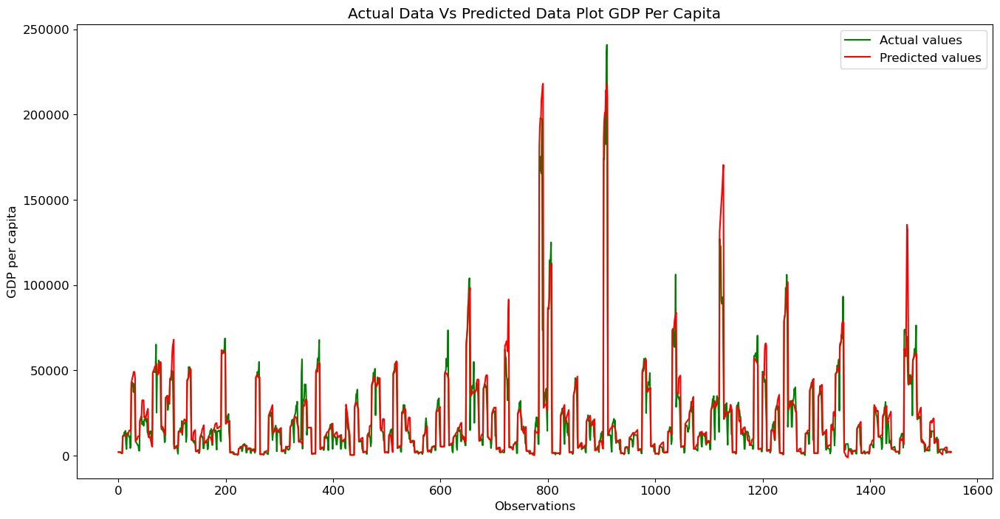

In [206]:
plot_predictions(all_actuals, all_forecasts)

In [207]:
model_performance.append({
    "Model": "Exponential Smoothing",
    "MSE": mse,
    "MAE": mae,
    "R^2": r2,
})

In [208]:
predict_one_value = model.forecast(steps=1)

In [209]:
predict_one_value

66    1946.752661
dtype: float64

# Arima

In [210]:
warnings.filterwarnings("ignore")

all_forecasts = []
all_actuals = []

entities = df['Entity_label_encoded'].unique()

for entity in entities:
    entity_df = df[df['Entity_label_encoded'] == entity].set_index('Year')['GDP per capita']

    # Splitting into train and test sets
    
    train_size = int(len(entity_df) * 0.8)
    train, test = entity_df[0:train_size], entity_df[train_size:]

    # Fitting ARIMA and forecast
    
    model = ARIMA(train, order=(1,0,1))
    model_fit = model.fit()
    forecast = model_fit.forecast(steps=len(test))

    # Appending forecasts and actuals to the lists
    
    all_forecasts.extend(forecast)
    all_actuals.extend(test)

# Converting lists to arrays for metric calculations

all_forecasts = np.array(all_forecasts)
all_actuals = np.array(all_actuals)

# Calculating overall metrics

mse = mean_squared_error(all_actuals, all_forecasts)
mae = mean_absolute_error(all_actuals, all_forecasts)
r2 = r2_score(all_actuals, all_forecasts)

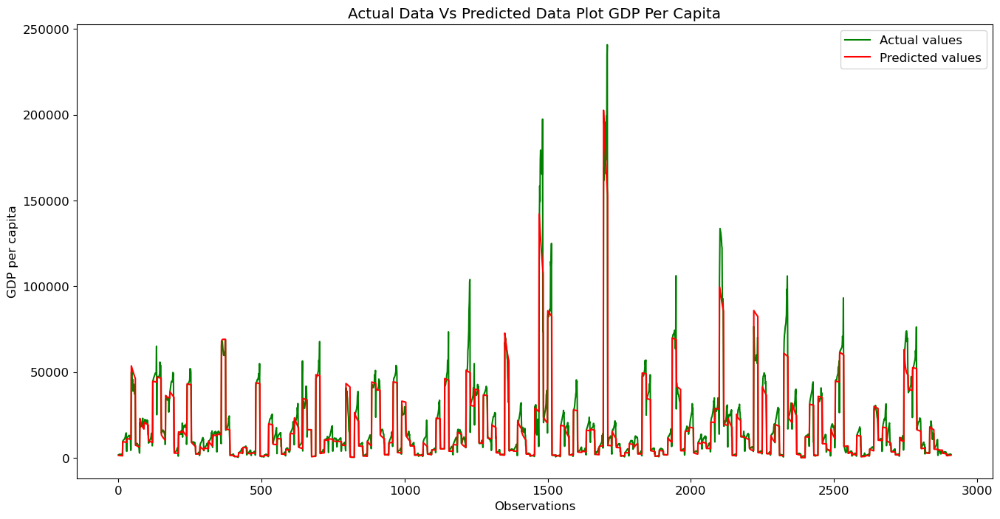

In [211]:
plot_predictions(all_actuals, all_forecasts)

In [212]:
model_performance.append({
    "Model": "ARIMA",
    "MSE": mse,
    "MAE": mae,
    "R^2": r2,
    "Adjusted R^2": adjusted_r2_val
})
print(f'Overall MSE: {mse}')
print(f'Overall MAE: {mae}')
print(f'Overall R^2: {r2}')
print(f'Overall Adjusted R^2: {adjusted_r2_val}')

Overall MSE: 59188722.49252497
Overall MAE: 3537.0201267920984
Overall R^2: 0.9034316277852217
Overall Adjusted R^2: 0.7909867905807283


In [213]:
pd.DataFrame(model_performance)

,Model,MSE,MAE,R^2,Adjusted R^2
0,XGB,1.316981e+08,5864.131159,0.735575,NaN
1,LGBM,1.111759e+08,4880.675408,0.776779,NaN
2,RANDOM FOREST,1.451198e+08,6533.786528,0.708626,NaN
3,CATBOOST,1.052754e+08,4979.086674,0.788626,NaN
4,SARIMAX,1.296713e+08,5521.997348,0.739644,NaN
5,Exponential Smoothing,1.335720e+08,4397.748519,0.791122,NaN
6,ARIMA,5.918872e+07,3537.020127,0.903432,0.790987


In [214]:
important_features_df

,Feature,XGB,LightGBM,Random Forest,Catboost,SARIMAX
0,Year,True,True,False,True,True
1,Fertility rate,True,True,False,False,True
2,Entity_target_encoded,True,True,True,True,True
3,Correlation with Ideal,True,True,True,True,True
4,Employment in agriculture (% of total employment),True,False,True,False,True
5,Electoral democracy index,True,True,False,True,True
6,Sex ratio,True,True,False,False,False
7,Meat consumption,True,True,False,False,True
8,suicide rate,True,True,False,True,False
9,Employment in industry (% of total employment),True,False,True,True,False


**Conclussion:** In the analysis of various predictive models, CATBoost and LGBM emerged as top performers, showcasing superior results in terms of Mean Squared Error (MSE), Mean Absolute Error (MAE), and the Coefficient of Determination (R²) compared to their counterparts. This distinction underscores their robustness and efficiency in handling the dataset provided, affirming their suitability for predicting GDP per capita with a high degree of accuracy.

A notable observation across the models is the diversity in pattern recognition and feature weighting. This variation highlights the distinct methodologies and algorithms underlying each model, enabling them to capture different aspects of the data. Unlike models such as ARIMA, which primarily focus on temporal dynamics, considering only time (year) and entity for predictions, models like CATBoost and LGBM, among others, were able to leverage a broader set of features to enhance their predictive power.

**Interestingly**, certain features beyond the obvious choices of year and entity demonstrated significant influence across most models. These include **under-five mortality rate**, **Correlation with Ideal**, **Population Density**, and the **Is Trough** indicator. The prominence of these features suggests that they encapsulate critical patterns and relationships within the data, contributing valuable insights into the factors driving GDP per capita. The under-five mortality rate, for instance, might reflect broader socio-economic and health-related conditions, while Population Density and Is Trough indicators provide context on demographic challenges and economic cycles, respectively.

# NLP - Extracting Relationships Between Countries From News Headlines

In [215]:
# Reading the conflict headlines from an Excel file and creating a Pandas DataFrame

headlines_df = pd.read_excel('headlines.xlsx')
headlines_df

,Headline,Date,Source
0,US drone strike kills seven militants in Pakistan: officials,2010,Agence France Presse
1,An-24 plane crew with 3 Russians released in Somalia.,2010,ITAR-TASS World Service
2,U.S. military servicemen stranded at Almaty airport left for Doha,2010,Interfax: Kazakhstan General Newswire
3,Second US drone strike kills four militants in Pakistan,2011,Agence France Presse
4,US drone strikes kill 11 militants in Pakistan: officials,2011,Agence France Presse
...,...,...,...
19200,"Pakistan says Indian troops ""unprovoked"" border firing injures 2 soldiers",2014,BBC Monitoring South Asia - Political
19201,Indian government asks army to give fitting reply to Pakistan border firing,2014,BBC Monitoring South Asia - Political
19202,Urgent: Indian troop killed in Kashmir fire trading,2014,Xinhua General News Service
19203,Pakistan summons Indian envoy over killing of two soldiers,2014,Xinhua General News Service


## Extracting Country Pairs

In [216]:
data = []

# Reading the news headlines dataset from a JSON file and storing it in a list

with open('News_Category_Dataset_v3.json','r', encoding = 'utf-8') as news_file:
    for line in news_file:
        article = json.loads(line)
        data.append(article)
        
countries = [name.lower() for name in countries]
filtered_articles = []

# A function to count the numnebr of countries appear in an headline in the dataset

def mentions_countries(headline):
    count = sum(1 for Entity in countries if Entity in headline.lower())
    return count >= 2

# filtering the data set to find only headlines that contains 2 countries or more in a headline

for article in data:
    headline = article.get('headline','')
    if mentions_countries(headline):
        filtered_articles.append(article)
        
with open('filtered_news_data.json', 'w', encoding = 'utf-8') as filtered_json_file:
    json.dump(filtered_articles, filtered_json_file, ensure_ascii = False,indent = 4)

In [217]:
filtered_json = pd.read_json("filtered_news_data.json")

# Extracting the year from the 'date' column and creating a new 'Date' column

filtered_json["Date"] = filtered_json["date"].apply(lambda x : x.year)

# Creating a new 'Headline' column to copy the 'headline' values

filtered_json["Headline"] = filtered_json["headline"].copy()

# Merging the filtered news headlines with the existing 'headlines_df'

filtered_merged_headlines = pd.concat([headlines_df,filtered_json[["Headline","Date"]]])
filtered_merged_headlines

,Headline,Date,Source
0,US drone strike kills seven militants in Pakistan: officials,2010,Agence France Presse
1,An-24 plane crew with 3 Russians released in Somalia.,2010,ITAR-TASS World Service
2,U.S. military servicemen stranded at Almaty airport left for Doha,2010,Interfax: Kazakhstan General Newswire
3,Second US drone strike kills four militants in Pakistan,2011,Agence France Presse
4,US drone strikes kill 11 militants in Pakistan: officials,2011,Agence France Presse
...,...,...,...
1165,Jetstar Hong Kong: Qantas And China Eastern Collaborate On New Budget Airline,2012,NaN
1166,Facing HIV in Uganda and the United States,2012,NaN
1167,"Patricia Barnett, Georgia Woman, Found Dead In Alpharetta After Storm",2012,NaN
1168,The Quest For A Truthful Life: One Georgia Woman's Coming Out Battle,2012,NaN


**In the initial phase of our project, we embarked on the challenge of accurately extracting country names from news headlines**, recognizing that standard approaches such as using regular expressions, spaCy, or various string matching algorithms (like Levenshtein distance, cosine similarity) independently were insufficient for our nuanced needs. This was particularly true when trying to identify references to countries that might not always be mentioned by their formal names but rather by demonyms (e.g., "Indians" for "India" or "Burmese" for "Myanmar") or abbreviations.

To address this complexity, we developed a comprehensive methodology that integrates multiple algorithms and techniques into a cohesive process. This hybrid approach allowed us to more accurately identify and pair country mentions within the text, overcoming the limitations of any single technique. Our method involved:

  **De-duplication of Headlines:** To ensure uniqueness and relevance, we first removed duplicate headlines from our dataset.
    Comprehensive Country List: We compiled an extensive list of countries, including common variations and abbreviations, to maximize our ability to recognize country mentions under various guises.
    **Country Name Normalization:** We created a mapping of common abbreviations and variations to their respective standard country names to ensure consistency in identification.
    Advanced Matching Techniques: Beyond simple string matching, we employed strategies to recognize country mentions that might be partially altered or mentioned in a less conventional manner. This included leveraging the WordNet Lemmatizer to handle different morphological forms of words and custom matching functions to account for partial matches and contextual cues.
    **Extraction of Country Pairs:** Our final step involved extracting all possible pairs of countries mentioned within each headline, enabling us to analyze the relationships and contexts in which countries are discussed together.

This nuanced approach proved essential for accurately capturing the complexity of country mentions in global news headlines. **By synthesizing multiple techniques**, we were able to effectively identify not just explicit country names but also indirect references, thereby providing a richer and more accurate dataset for further analysis. This methodology highlights the importance of adaptability and innovation in text analysis, especially when dealing with diverse and nuanced data sources.

In [220]:
filtered_merged_headlines = filtered_merged_headlines.drop_duplicates(subset='Headline')

countries = ['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi', "Cote d'Ivoire", 'Cape Verde', 'Cambodia', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czech Republic', 'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'Holy See', 'Hungary','hong kong', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya', 'Kiribati', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Latvia', 'Lebanon', 'Lesotho', 'Liberia', 'Libya', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali', 'Malta', 'Marshall Islands', 'Mauritania', 'Mauritius', 'Mexico', 'Micronesia', 'Moldova', 'Monaco', 'Mongolia', 'Montenegro', 'Morocco', 'Mozambique', 'Myanmar', 'Namibia', 'Nauru', 'Nepal', 'Netherlands', 'New Zealand', 'Nicaragua', 'Niger', 'Nigeria', 'North Korea', 'North Macedonia', 'Norway', 'Oman', 'Pakistan', 'Palau', 'Panama', 'Papua New Guinea', 'Paraguay', 'Peru', 'Philippines', 'Poland', 'Portugal', 'Qatar', 'Romania', 'Russia', 'Rwanda', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Samoa', 'San Marino', 'Sao Tome and Principe', 'Saudi Arabia', 'Senegal', 'Serbia', 'Seychelles', 'Sierra Leone', 'Singapore', 'Slovakia', 'Slovenia', 'Solomon Islands', 'Somalia', 'South Africa', 'South Korea', 'South Sudan', 'Spain', 'Sri Lanka', 'Sudan', 'Suriname', 'Sweden', 'Switzerland', 'Syria', 'Tajikistan', 'Tanzania', 'Thailand', 'Timor-Leste', 'Togo', 'Tonga', 'Trinidad and Tobago', 'Tunisia', 'Turkey', 'Turkmenistan', 'Tuvalu', 'Uganda', 'Ukraine', 'United Arab Emirates', 'United Kingdom', 'United States', 'Uruguay', 'Uzbekistan', 'Vanuatu', 'Venezuela', 'Vietnam', 'Yemen', 'Zambia', 'Zimbabwe']

# Adding country replacements to handle variations in country names

country_replacements = {
    "US": "United States",
    "U.S.": "United States",
    "UK": "United Kingdom",
    "U.K.": "United Kingdom",
    "N.korea": "North Korea",
    "S.korea": "South Korea",
    "America": "United States",
    "UAE": "United Arab Emirates",
    "S. korea": "South Korea",
    "N. korea": "North Korea"
}

# Initializing a WordNet Lemmatizer

lemmatizer = WordNetLemmatizer()

# Function to check if the start of two words is similar

def start_similarity(word, country):
    
    # Calculating the length to compare (at least 66.7% of the word length)
    
    length_to_compare = int(max(len(word), len(country)) * 0.6667)
    return word[:length_to_compare] == country[:length_to_compare]

# Function to check if a word contains a country name

def contains_country_name(word, country):
    return country.lower() in word.lower()

# Function to find all possible pairs of mentioned countries in a text

def find_all_country_pairs(text):
    if not isinstance(text, str):
        return []
    
    for abbreviation, full_name in country_replacements.items():
        pattern = r'\b' + re.escape(abbreviation).replace("\\.", r'\.?').replace("\\ ", r'\s?') + r'\b'
        text = re.sub(pattern, full_name, text)
                        
    mentioned_countries = set()
    
    for country in countries:
        
        # Using regular expression to match the start of words
        
        pattern = r'\b' + re.escape(country)
        if re.search(pattern, text, re.IGNORECASE):
            mentioned_countries.add(country)
        else:
            for word in text.split():
                lemmatized_word = lemmatizer.lemmatize(word).lower()
                
                # Checking if the lemmatized word starts with the country name
                
                if lemmatized_word.startswith(country.lower()):
                    mentioned_countries.add(country)
    
    country_pairs = list(combinations(mentioned_countries, 2))
    
    
    return country_pairs


filtered_merged_headlines.loc[:, 'Country Pairs'] = filtered_merged_headlines['Headline'].apply(find_all_country_pairs)
filtered_merged_headlines = filtered_merged_headlines.loc[filtered_merged_headlines['Country Pairs'].map(len) > 0]

In [221]:
filtered_merged_headlines.to_csv("headlines.csv", index=False)
filtered_merged_headlines

,Headline,Date,Source,Country Pairs
0,US drone strike kills seven militants in Pakistan: officials,2010,Agence France Presse,"[(United States, Pakistan)]"
1,An-24 plane crew with 3 Russians released in Somalia.,2010,ITAR-TASS World Service,"[(Somalia, Russia)]"
3,Second US drone strike kills four militants in Pakistan,2011,Agence France Presse,"[(United States, Pakistan)]"
4,US drone strikes kill 11 militants in Pakistan: officials,2011,Agence France Presse,"[(United States, Pakistan)]"
6,Third US drone strike kills four militants in Pakistan,2011,Agence France Presse,"[(United States, Pakistan)]"
...,...,...,...,...
1157,"My Big, Fat Nigerian Wedding: Inside Lagos's Bridal Boom",2012,NaN,"[(Nigeria, Niger)]"
1159,Local Flavors Of The Dominican Republic With Chef Martin Berasategui (PHOTOS),2012,NaN,"[(Dominica, Dominican Republic)]"
1164,From Under the Mattress and into the Bank: Increasing Financial Access for Women in Nigeria,2012,NaN,"[(Nigeria, Niger)]"
1165,Jetstar Hong Kong: Qantas And China Eastern Collaborate On New Budget Airline,2012,NaN,"[(hong kong, China)]"


**The rationale behind our task of extracting and analyzing sentiments from news headlines involving country pairs was driven by the hypothesis that international relations, as reflected through media sentiment, could significantly influence or correlate with economic indicators, specifically GDP**. By delving into the nuanced portrayal of diplomatic relationships within global news coverage, we aimed to uncover patterns that might elucidate the interplay between geopolitical dynamics and economic performance. This exploration was guided by the intention to derive two novel features that could enhance the predictive accuracy of GDP per capita models:

**1. Intra-Continental Relations Sentiment:**

The first proposed feature aimed to capture the overall sentiment of a country's relationships with other countries within its own continent. By aggregating sentiment scores across all mentioned interactions between a country and its continental neighbors, we planned to calculate either **the average or median sentiment value. This metric was hypothesized to serve as a proxy for regional stability, cooperation, or tension, which are factors that can directly or indirectly impact economic conditions and, by extension, GDP.** For instance, positive intra-continental relations might facilitate trade, investment, and collaborative projects, contributing to economic growth, while negative sentiments could indicate conflicts or instability that might deter economic development.

**2. Relations Sentiment with High GDP Countries:**

The second feature focused on quantifying the sentiment of a country's relations with three of the world's highest GDP countries. The premise here was that the nature of a country's diplomatic and economic interactions with global economic powerhouses could have **a pronounced impact on its own economic prospects. Positive sentiments in these relationships might reflect favorable trade agreements, investment inflows, or strategic partnerships**, potentially boosting the country's GDP. Conversely, negative sentiments could hint at trade disputes, sanctions, or geopolitical tensions that might adversely affect the country's economic standing.
Underlying Motivation:

The overarching goal of incorporating these sentiment-based features into our analysis was to enrich our understanding of the multifaceted factors that influence GDP. Recognizing that economic performance **is not solely determined by internal policies or practices but is also significantly shaped by external relations and global perceptions**, we sought to integrate these dimensions into our predictive models. By systematically analyzing the sentiment of international relations as depicted in news headlines, we aimed to capture a more holistic view of the factors driving economic outcomes, thereby enhancing the robustness and explanatory power of our GDP prediction models.

**At the outset of our project**, we recognized the inherent complexity in accurately extracting and interpreting sentiments from news headlines, especially those mentioning multiple country pairs. Given the nuanced nature of international relations and how they're represented in media, our goal was to develop a methodology that not only identifies country pairs within headlines but also discerns the underlying sentiment of their relationship. Our approach comprised two distinct strategies, each designed to address the multifaceted challenge of sentiment analysis in a global news context.


**Manual Labeling and Model Training**

Firstly, we embarked on manually labeling a portion of our dataset to serve as a foundation for supervised learning. Recognizing the tendency for news headlines to skew towards conflict-centric narratives, we meticulously balanced our labeled dataset to mitigate this bias. This initial, **manually labeled dataset enabled us to train a model capable of classifying the nature of relationships between country pairs within a headline**. The model was designed to learn from the labeled examples and predict the sentiment or relationship type (e.g., conflict, alliance, neutral) for each country pair mentioned in a headline, thereby providing nuanced insights into international dynamics.


**Contextual Analysis for Sentiment Extraction**

Our second technique focused on extracting and analyzing the contextual words found between each country pair in a headline to gauge the sentiment of their relationship. **This method aimed to capture the subtleties of diplomatic relations by examining the linguistic environment surrounding each mention of country pairs. However, we encountered limitations with this approach, particularly in headlines with complex structures or ambiguous contexts. For example, a headline like "India and Russia are sending warships to Japan" presents a challenge; the simple conjunction "and" between "India" and "Russia" might be overlooked or removed by text preprocessing tools, potentially leading to a misinterpretation of the sentiment as neutral**. In reality, such a headline might suggest an alliance or cooperative action between India and Russia, illustrating the nuanced interpretation required.

**Refinement for Accuracy**

These challenges underscored the need for a refined approach that combines both manual insights and automated text analysis to accurately interpret sentiments in international news coverage. By leveraging both labeled data for model training and contextual analysis for direct sentiment extraction, we aimed to create a robust system that could navigate the complexities of international relations as represented in media. However, the intricacies of language and the potential for varied interpretations highlight the ongoing need for sophisticated, context-aware analysis tools in sentiment analysis, especially in the domain of global news and international relations.

## Supervised Learning Approach

In [224]:
labeled_headlines_703 = pd.read_csv("labeled_headlines_703.csv")

In [225]:
country_headlines = ["Canada and Mexico Sign Historic Trade Agreement, Strengthening Economic Ties","Germany, France, and Italy Launch Joint Renewable Energy Initiative","US and Japan Announce Partnership in Space Exploration","India and Bangladesh Successfully Complete Joint River Cleaning Project","Norway and Sweden Host Joint Peace Talks for Middle Eastern Conflict Resolution","Brazil, Argentina, and Chile Unite for Amazon Rainforest Conservation Efforts","UK and Ireland Launch Shared Educational Scholarship Program for Students","South Korea and Vietnam to Collaborate on Technology Innovation Hub","Australia and New Zealand Open Free Travel Corridor, Boosting Tourism","China and Russia Inaugurate Joint Cultural Festival to Celebrate Friendship"]
country_pairs_new = [[("Canada", "Mexico")], [('Germany', 'France'), ('Germany', 'Italy'), ('France, Italy')], [('united states', 'Japan')], [('India', 'Bangladesh')], [('Norway', 'Sweden')], [('Brazil', 'Argentina'), ('Brazil', 'Chile'), ('Argentina', 'Chile')], [('united kingdom', 'Ireland')], [('South Korea', 'Vietnam')], [('Australia', 'New Zealand')], [('China', 'Russia')]]
Label = [['ally'], ['ally'], ['ally'], ['ally'], ['ally'], ['ally'], ['ally'], ['ally'], ['ally'], ['ally']]
df_new = pd.DataFrame(list(zip(country_headlines, country_pairs_new, Label)), columns =['Headline', 'Country Pairs', 'Labels'])
df_new

,Headline,Country Pairs,Labels
0,"Canada and Mexico Sign Historic Trade Agreement, Strengthening Economic Ties","[(Canada, Mexico)]",[ally]
1,"Germany, France, and Italy Launch Joint Renewable Energy Initiative","[(Germany, France), (Germany, Italy), France, Italy]",[ally]
2,US and Japan Announce Partnership in Space Exploration,"[(united states, Japan)]",[ally]
3,India and Bangladesh Successfully Complete Joint River Cleaning Project,"[(India, Bangladesh)]",[ally]
4,Norway and Sweden Host Joint Peace Talks for Middle Eastern Conflict Resolution,"[(Norway, Sweden)]",[ally]
5,"Brazil, Argentina, and Chile Unite for Amazon Rainforest Conservation Efforts","[(Brazil, Argentina), (Brazil, Chile), (Argentina, Chile)]",[ally]
6,UK and Ireland Launch Shared Educational Scholarship Program for Students,"[(united kingdom, Ireland)]",[ally]
7,South Korea and Vietnam to Collaborate on Technology Innovation Hub,"[(South Korea, Vietnam)]",[ally]
8,"Australia and New Zealand Open Free Travel Corridor, Boosting Tourism","[(Australia, New Zealand)]",[ally]
9,China and Russia Inaugurate Joint Cultural Festival to Celebrate Friendship,"[(China, Russia)]",[ally]


In [226]:
# Neutral Relationship Headlines and Country Pairs

country_headlines_2 = ["US and China Continue Trade Discussions Amidst Ongoing Negotiations","India and Pakistan Hold Routine Border Security Talks","Japan and Russia Maintain Status Quo in Territorial Negotiations","Brazil and Venezuela Conduct Regular Diplomatic Meeting","France and UK Discuss Post-Brexit Trade Arrangements","Germany and Turkey Hold Annual Economic Forum","South Africa and Namibia Review Bilateral Trade Agreements","Australia and Indonesia Monitor Joint Fishing Zones for Compliance","Egypt and Sudan Hold Talks on Nile River Management Without Final Agreement","Canada and US Review Shared Environmental Policies"]
country_pairs_new_2 = [[('united states', 'China')], [('India', 'Pakistan')], [('Japan', 'Russia')], [('Brazil', 'Venezuela')], [('France', 'united kingdom')], [('Germany', 'Turkey')], [('South Africa', 'Namibia')], [('Australia', 'Indonesia')], [('Egypt', 'Sudan')], [('Canada', 'US')]]
Label_2 = [['neutral'], ['neutral'], ['neutral'], ['neutral'], ['neutral'], ['neutral'], ['neutral'], ['neutral'], ['neutral'], ['neutral']]
df_new_2 = pd.DataFrame(list(zip(country_headlines_2, country_pairs_new_2, Label_2)), columns =['Headline', 'Country Pairs', 'Labels'])

df_new_2

,Headline,Country Pairs,Labels
0,US and China Continue Trade Discussions Amidst Ongoing Negotiations,"[(united states, China)]",[neutral]
1,India and Pakistan Hold Routine Border Security Talks,"[(India, Pakistan)]",[neutral]
2,Japan and Russia Maintain Status Quo in Territorial Negotiations,"[(Japan, Russia)]",[neutral]
3,Brazil and Venezuela Conduct Regular Diplomatic Meeting,"[(Brazil, Venezuela)]",[neutral]
4,France and UK Discuss Post-Brexit Trade Arrangements,"[(France, united kingdom)]",[neutral]
5,Germany and Turkey Hold Annual Economic Forum,"[(Germany, Turkey)]",[neutral]
6,South Africa and Namibia Review Bilateral Trade Agreements,"[(South Africa, Namibia)]",[neutral]
7,Australia and Indonesia Monitor Joint Fishing Zones for Compliance,"[(Australia, Indonesia)]",[neutral]
8,Egypt and Sudan Hold Talks on Nile River Management Without Final Agreement,"[(Egypt, Sudan)]",[neutral]
9,Canada and US Review Shared Environmental Policies,"[(Canada, US)]",[neutral]


In [228]:
df_new_concat = pd.concat([df_new, df_new_2])

# Convert the list of labels to strings
# Display the modified DataFrame

df_new_concat

,Headline,Country Pairs,Labels
0,"Canada and Mexico Sign Historic Trade Agreement, Strengthening Economic Ties","[(Canada, Mexico)]",[ally]
1,"Germany, France, and Italy Launch Joint Renewable Energy Initiative","[(Germany, France), (Germany, Italy), France, Italy]",[ally]
2,US and Japan Announce Partnership in Space Exploration,"[(united states, Japan)]",[ally]
3,India and Bangladesh Successfully Complete Joint River Cleaning Project,"[(India, Bangladesh)]",[ally]
4,Norway and Sweden Host Joint Peace Talks for Middle Eastern Conflict Resolution,"[(Norway, Sweden)]",[ally]
5,"Brazil, Argentina, and Chile Unite for Amazon Rainforest Conservation Efforts","[(Brazil, Argentina), (Brazil, Chile), (Argentina, Chile)]",[ally]
6,UK and Ireland Launch Shared Educational Scholarship Program for Students,"[(united kingdom, Ireland)]",[ally]
7,South Korea and Vietnam to Collaborate on Technology Innovation Hub,"[(South Korea, Vietnam)]",[ally]
8,"Australia and New Zealand Open Free Travel Corridor, Boosting Tourism","[(Australia, New Zealand)]",[ally]
9,China and Russia Inaugurate Joint Cultural Festival to Celebrate Friendship,"[(China, Russia)]",[ally]


In [272]:
# concatenating labeled_headlines_703 and df_new_concat

concat_labeled_headlines_703 = pd.concat([labeled_headlines_703[["Headline", "Country Pairs", "Labels"]], df_new_concat])
concat_labeled_headlines_703

,Headline,Country Pairs,Labels
0,US drone strike kills seven militants in Pakistan: officials,"[('united states', 'pakistan')]",[conflict]
1,An-24 plane crew with 3 Russians released in Somalia.,"[('russia', 'somalia')]",[ally]
2,Second US drone strike kills four militants in Pakistan,"[('united states', 'pakistan')]",[conflict]
3,US drone strikes kill 11 militants in Pakistan: officials,"[('united states', 'pakistan')]",[conflict]
4,Third US drone strike kills four militants in Pakistan,"[('united states', 'pakistan')]",[conflict]
...,...,...,...
5,Germany and Turkey Hold Annual Economic Forum,"[(Germany, Turkey)]",[neutral]
6,South Africa and Namibia Review Bilateral Trade Agreements,"[(South Africa, Namibia)]",[neutral]
7,Australia and Indonesia Monitor Joint Fishing Zones for Compliance,"[(Australia, Indonesia)]",[neutral]
8,Egypt and Sudan Hold Talks on Nile River Management Without Final Agreement,"[(Egypt, Sudan)]",[neutral]


In [231]:
labeled_headlines_703 = pd.read_csv("labeled_headlines_703.csv")

# Function to convert string representations of lists or list of tuples into actual Python lists or list of tuples

def convert_string_to_list(string):
    if string == '[]':
        return []
    try:
        # Evaluating the string directly if it's a proper list or list of tuples representation
        
        result = ast.literal_eval(string)
        
        
        if result and isinstance(result[0], tuple):
            return result
        elif result:
            
            return [(elem,) for elem in result]
        else:
            return result
    except (ValueError, SyntaxError) as e:
        print(f"Error converting string to list: {e} | String: '{string}'")
        
        # Return an empty list in case of error
        
        return []  

In [232]:
def convert_labels_to_list(string):
    
    # Checking for NaN or non-strings
    
    if pd.isnull(string) or not isinstance(string, str):
        return []

    try:
        if string.startswith("[") and string.endswith("]"):
            
            # Handling multiple labels:
            
            # Removing outer brackets
            
            labels_str = string[1:-1]
            
            # Spliting by comma
            
            labels = labels_str.split(",")  
            return [label.strip() for label in labels]
        else:
            
            # Handle single labels:
            
            return [string.strip("[]").strip("'\"")]

    except Exception as e:
        print(f"Error converting labels string to list: {e} | String: '{string}'")
        return []

In [233]:
# Applying conversions

concat_labeled_headlines_703['Country Pairs'] = concat_labeled_headlines_703['Country Pairs'].apply(convert_string_to_list)
concat_labeled_headlines_703['Labels'] = concat_labeled_headlines_703['Labels'].apply(convert_labels_to_list)


# Verifying the conversion by inspecting the type and content again

example_country_pair = concat_labeled_headlines_703['Country Pairs'].iloc[0]
example_label = concat_labeled_headlines_703['Labels'].iloc[0]

print(f"After conversion - Example 'Country Pairs' content: {example_country_pair}, Type: {type(example_country_pair)}")
print(f"After conversion - Example 'Labels' content: {example_label}, Type: {type(example_label)}")

Error converting string to list: malformed node or string: [('Canada', 'Mexico')] | String: '[('Canada', 'Mexico')]'
Error converting string to list: malformed node or string: [('Germany', 'France'), ('Germany', 'Italy'), 'France, Italy'] | String: '[('Germany', 'France'), ('Germany', 'Italy'), 'France, Italy']'
Error converting string to list: malformed node or string: [('united states', 'Japan')] | String: '[('united states', 'Japan')]'
Error converting string to list: malformed node or string: [('India', 'Bangladesh')] | String: '[('India', 'Bangladesh')]'
Error converting string to list: malformed node or string: [('Norway', 'Sweden')] | String: '[('Norway', 'Sweden')]'
Error converting string to list: malformed node or string: [('Brazil', 'Argentina'), ('Brazil', 'Chile'), ('Argentina', 'Chile')] | String: '[('Brazil', 'Argentina'), ('Brazil', 'Chile'), ('Argentina', 'Chile')]'
Error converting string to list: malformed node or string: [('united kingdom', 'Ireland')] | String: '[(

In [234]:
labeled_headlines_labeled = concat_labeled_headlines_703.iloc[:702]
number  = 0 
for index, row in labeled_headlines_labeled.iterrows():
    labels_list = row['Labels']
    number +=1
    for value in labels_list:
        print(value , number )

conflict 1
ally 2
conflict 3
conflict 4
conflict 5
conflict 6
conflict 7
conflict 8
conflict 9
conflict 10
conflict 11
conflict 12
conflict 13
conflict 14
conflict 15
ally 16
conflict 16
conflict 16
conflict 17
conflict 18
conflict 19
conflict 20
conflict 21
conflict 22
conflict 23
conflict 24
conflict 25
ally 26
conflict 27
conflict 28
conflict 29
conflict 30
conflict 31
conflict 32
conflict 33
conflict 34
conflict 35
conflict 36
conflict 37
conflict 38
ally 39
ally 40
conflict 41
conflict 42
ally 43
conflict 44
conflict 45
ally 46
conflict 47
conflict 48
ally 49
ally 49
conflict 49
ally 49
conflict 49
conflict 49
conflict 50
ally 51
conflict 52
conflict 53
conflict 54
conflict 55
conflict 56
conflict 57
conflict 58
conflict 59
ally 60
conflict 61
conflict 62
conflict 63
conflict 64
conflict 65
ally 66
conflict 67
conflict 68
neutral 69
ally 70
conflict 71
ally 72
conflict 73
neutral 74
neutral 75
conflict 76
conflict 77
ally 78
ally 79
conflict 80
conflict 81
conflict 82
conflict 83


In [249]:
labeled_headlines_labeled = concat_labeled_headlines_703.iloc[:702].loc[:, ['Headline' , 'Country Pairs', 'Labels']]

countries = ['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi', "Cote d'Ivoire", 'Cape Verde', 'Cambodia', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czech Republic', 'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'Holy See', 'Hungary','hong kong', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya', 'Kiribati', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Latvia', 'Lebanon', 'Lesotho', 'Liberia', 'Libya', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali', 'Malta', 'Marshall Islands', 'Mauritania', 'Mauritius', 'Mexico', 'Micronesia', 'Moldova', 'Monaco', 'Mongolia', 'Montenegro', 'Morocco', 'Mozambique', 'Myanmar', 'Namibia', 'Nauru', 'Nepal', 'Netherlands', 'New Zealand', 'Nicaragua', 'Niger', 'Nigeria', 'North Korea', 'North Macedonia', 'Norway', 'Oman', 'Pakistan', 'Palau', 'Panama', 'Papua New Guinea', 'Paraguay', 'Peru', 'Philippines', 'Poland', 'Portugal', 'Qatar', 'Romania', 'Russia', 'Rwanda', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Samoa', 'San Marino', 'Sao Tome and Principe', 'Saudi Arabia', 'Senegal', 'Serbia', 'Seychelles', 'Sierra Leone', 'Singapore', 'Slovakia', 'Slovenia', 'Solomon Islands', 'Somalia', 'South Africa', 'South Korea', 'South Sudan', 'Spain', 'Sri Lanka', 'Sudan', 'Suriname', 'Sweden', 'Switzerland', 'Syria', 'Tajikistan', 'Tanzania', 'Thailand', 'Timor-Leste', 'Togo', 'Tonga', 'Trinidad and Tobago', 'Tunisia', 'Turkey', 'Turkmenistan', 'Tuvalu', 'Uganda', 'Ukraine', 'United Arab Emirates', 'United Kingdom', 'United States', 'Uruguay', 'Uzbekistan', 'Vanuatu', 'Venezuela', 'Vietnam', 'Yemen', 'Zambia', 'Zimbabwe']

country_encoder = LabelEncoder().fit([country.lower() for country in countries])

joblib.dump(country_encoder, 'country_encoder.joblib')


mlb = MultiLabelBinarizer().fit(labeled_headlines_labeled['Labels'])

label_classes = mlb.classes_

label_to_index = {label: index for index, label in enumerate(mlb.classes_)}

print(label_to_index)

joblib.dump(mlb, 'label_binarizer.joblib')

print(f"Encoded countries shape: {country_encoder.classes_.shape}")
print(f"Number of labels: {len(mlb.classes_)}")


def encode_country_pairs(list_of_pairs, encoder):
    """
    Encode each country in each pair within a list of pairs using the provided encoder.
    
    Args:
    list_of_pairs: A list of lists, where each inner list contains strings of country pairs separated by a delimiter (e.g., '-').
    encoder: Pre-fitted LabelEncoder instance for countries.
    
    Returns:
    A list of lists, where each inner list contains the encoded values of the countries in the pairs for a single headline.
    """
    encoded_pairs_for_headline = []
    for pairs_list in list_of_pairs:
        encoded_pairs = []
        for pair in pairs_list:
            
            # Spliting the pair into individual countries, strip whitespace, and convert to lowercase
            
            countries = [country.strip().lower() for country in pair.split('-')]
            
            # Encoding the individual countries using the encoder
            
            encoded_pair = encoder.transform(countries)
            encoded_pairs.append(encoded_pair.tolist())
        encoded_pairs_for_headline.append(encoded_pairs)
    return encoded_pairs_for_headline

# Applying the function to the 'Country Pairs' column, assuming each cell in 'Country Pairs' is a list of strings

labeled_headlines_labeled['Encoded Country Pairs'] = labeled_headlines_labeled['Country Pairs'].apply(lambda x: encode_country_pairs(x, country_encoder))


# Printing the first few rows of the encoded country pairs to verify

print(labeled_headlines_labeled[['Country Pairs', 'Encoded Country Pairs']].head())

# Initializing the tokenizer

tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')


def tokenize_headlines(headlines, tokenizer):
    """
    Tokenize a list of headlines using the provided tokenizer.
    
    Args:
    headlines: A list of headline strings.
    tokenizer: An instance of transformers.AutoTokenizer.
    
    Returns:
    A dictionary containing tokenized representations (input_ids and attention_mask).
    """
    return tokenizer(headlines, padding=True, truncation=True, return_tensors="pt")

# Applying the tokenizer to the headlines

tokenized_data = tokenize_headlines(labeled_headlines_labeled['Headline'].tolist(), tokenizer)

# Extracting the tokenized input IDs and attention masks

input_ids = tokenized_data['input_ids']
attention_masks = tokenized_data['attention_mask']

# Converting 'Encoded Country Pairs' and 'Labels' to the appropriate tensor format

encoded_country_pairs = [torch.tensor(pairs) for pairs in labeled_headlines_labeled['Encoded Country Pairs']]
labels = torch.tensor(mlb.transform(labeled_headlines_labeled['Labels'].tolist()), dtype=torch.float)

# Creating instances of the dataset

class HeadlineDataset(Dataset):
    def __init__(self, headlines, encoded_country_pairs, attention_masks, labels):
        self.headlines = headlines
        self.encoded_country_pairs = encoded_country_pairs
        self.attention_masks = attention_masks
        self.labels = labels

    def __getitem__(self, idx):
        return {
            "input_ids": self.headlines[idx],
            "encoded_country_pairs": self.encoded_country_pairs[idx],  # Ensure this is correctly formatted
            "attention_mask": self.attention_masks[idx],
            "labels": self.labels[idx]
        }

    def __len__(self):
        return len(self.labels)

dataset = HeadlineDataset(input_ids, encoded_country_pairs, attention_masks, labels)

# splitting indices for train and validation sets

train_indices, val_indices = train_test_split(range(len(dataset)), test_size=0.1, random_state=42)

# Extracting subsets for training and validation

train_dataset = torch.utils.data.Subset(dataset, train_indices)
val_dataset = torch.utils.data.Subset(dataset, val_indices)


batch_size = 8

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)

{'ally': 0, 'conflict': 1, 'neutral': 2}
Encoded countries shape: (195,)
Number of labels: 3
                 Country Pairs Encoded Country Pairs
0  [(united states, pakistan)]      [[[186], [132]]]
1          [(russia, somalia)]      [[[143], [160]]]
2  [(united states, pakistan)]      [[[186], [132]]]
3  [(united states, pakistan)]      [[[186], [132]]]
4  [(united states, pakistan)]      [[[186], [132]]]


In [250]:
def custom_collate_fn(batch):
    input_ids = pad_sequence([item['input_ids'] for item in batch], batch_first=True, padding_value=0)
    attention_mask = pad_sequence([item['attention_mask'] for item in batch], batch_first=True, padding_value=0)
    labels = torch.stack([item['labels'] for item in batch])
    return {'input_ids': input_ids, 'attention_mask': attention_mask, 'labels': labels}

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, collate_fn=custom_collate_fn)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, collate_fn=custom_collate_fn)

num_epochs = 3
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = BertForSequenceClassification.from_pretrained(
    'bert-base-uncased',
    num_labels=len(mlb.classes_)
).to(device)

optimizer = AdamW(model.parameters(), lr=5e-5)
loss_fn = nn.BCEWithLogitsLoss()

def compute_accuracy(predictions, labels):
    _, predicted_labels = predictions.max(dim=1)
    correct_predictions = predicted_labels.eq(labels.max(dim=1)[1]).sum().item()
    return correct_predictions / labels.size(0)

def train(model, train_loader, optimizer, loss_fn, device):
    model.train()
    total_loss, total_accuracy = 0, 0
    for batch in train_loader:
        optimizer.zero_grad()
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        logits = outputs.logits
        total_accuracy += compute_accuracy(logits, labels)
    avg_loss = total_loss / len(train_loader)
    avg_accuracy = total_accuracy / len(train_loader)
    print(f"Training loss: {avg_loss}, Accuracy: {avg_accuracy}")

def validate(model, val_loader, loss_fn, device):
    model.eval()
    total_loss, total_accuracy = 0, 0
    with torch.no_grad():
        for batch in val_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            outputs = model(input_ids, attention_mask=attention_mask)
            loss = loss_fn(outputs.logits, labels)
            total_loss += loss.item()
            logits = outputs.logits
            total_accuracy += compute_accuracy(logits, labels)
    avg_loss = total_loss / len(val_loader)
    avg_accuracy = total_accuracy / len(val_loader)
    print(f"Validation loss: {avg_loss}, Accuracy: {avg_accuracy}")

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    train(model, train_loader, optimizer, loss_fn, device)
    validate(model, val_loader, loss_fn, device)
    
model_save_path = "./model_save_dir"
model.save_pretrained(model_save_path)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/3
Training loss: 0.46063168346881866, Accuracy: 0.7606657608695653
Validation loss: 0.3626972585916519, Accuracy: 0.8229166666666666
Epoch 2/3
Training loss: 0.3511529378592968, Accuracy: 0.8003396739130435
Validation loss: 0.3162636508544286, Accuracy: 0.8229166666666666
Epoch 3/3
Training loss: 0.25475607588887217, Accuracy: 0.8419157608695652
Validation loss: 0.32095231860876083, Accuracy: 0.8229166666666666


In [251]:
tokenizer.save_pretrained(model_save_path)

('./model_save_dir\\tokenizer_config.json',
 './model_save_dir\\special_tokens_map.json',
 './model_save_dir\\vocab.txt',
 './model_save_dir\\added_tokens.json',
 './model_save_dir\\tokenizer.json')

In [254]:
model_path = './path/to/save/model'

# Loading the tokenizer and model

tokenizer = BertTokenizer.from_pretrained(model_path)
model = BertForSequenceClassification.from_pretrained(model_path).to(device)

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertForSequenceClassification.from_pretrained(model_path).to(device)

# Example headline

headline = "united states Navy and russia has 8 war ships near japan, 5 en route"

# Country pairs formatted as mentioned

#country_pairs = [['india', 'china'], ['india', 'russia'], ['china', 'russia']]

country_pairs = [['united states', 'japan'], ['united states', 'russia'],['russia', 'japan']]

tokenized_headline = tokenize_headlines([headline], tokenizer)

encoded_country_pairs = encode_country_pairs([["-".join(pair) for pair in country_pairs]], country_encoder)

input_texts = [f"{headline} | {pair[0]}-{pair[1]}" for pair in country_pairs]

# Tokenizing the input for the model

inputs = [tokenizer(text, return_tensors='pt', padding=True, truncation=True, max_length=512).to(device) for text in input_texts]

index_to_label = {0:'ally', 1:'conflict', 2:'neutral'}
for i, input in enumerate(inputs):
    model.eval()
    with torch.no_grad():
        output = model(**input)
        logits = output.logits

        probabilities = torch.softmax(logits, dim=1)
        _, predicted_index = torch.max(probabilities, dim=1)
        predicted_label = index_to_label[predicted_index.item()]
        print("Predicted Label:", predicted_label)
        print("Input Text:", input_texts[i])
        print("Probabilities:", probabilities.cpu().numpy())
        print("-"*50)

Predicted Label: conflict
Input Text: united states Navy and russia has 8 war ships near japan, 5 en route | united states-japan
Probabilities: [[0.21299021 0.3948964  0.3921134 ]]
--------------------------------------------------
Predicted Label: conflict
Input Text: united states Navy and russia has 8 war ships near japan, 5 en route | united states-russia
Probabilities: [[0.20238486 0.40783048 0.38978466]]
--------------------------------------------------
Predicted Label: conflict
Input Text: united states Navy and russia has 8 war ships near japan, 5 en route | russia-japan
Probabilities: [[0.18510875 0.4633179  0.35157335]]
--------------------------------------------------


In [256]:
df = labeled_headlines_703
df

,Headline,Date,Source,Country Pairs,Labels
0,US drone strike kills seven militants in Pakistan: officials,2010,Agence France Presse,"[('united states', 'pakistan')]",[conflict]
1,An-24 plane crew with 3 Russians released in Somalia.,2010,ITAR-TASS World Service,"[('russia', 'somalia')]",[ally]
2,Second US drone strike kills four militants in Pakistan,2011,Agence France Presse,"[('united states', 'pakistan')]",[conflict]
3,US drone strikes kill 11 militants in Pakistan: officials,2011,Agence France Presse,"[('united states', 'pakistan')]",[conflict]
4,Third US drone strike kills four militants in Pakistan,2011,Agence France Presse,"[('united states', 'pakistan')]",[conflict]
...,...,...,...,...,...
8073,"Spain Vs. Italy LIVE Score, Updates: Euro 2012 Final Features Mario Balotelli, Andres Iniesta",2012,NaN,"[('italy', 'spain')]",NaN
8074,"'Call Me, Maybe' Wedding: Indian-Pakistani Wedding Pays Tribute To Carly Rae Jepsen Song (VIDEO)",2012,NaN,"[('india', 'pakistan')]",NaN
8075,The Dominican Republic Wants You To Vacation Like A Kardashian,2012,NaN,"[('dominican republic', 'dominica')]",NaN
8076,Guatemala Syphilis Study Lawsuit: Dismissal Despite United States Experiments On Natives In 1940s,2012,NaN,"[('united states', 'guatemala')]",NaN


In [258]:
# Filtering the DataFrame to get only the rows without labels

unlabeled_df = df

model_path = './path/to/save/model'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

tokenizer = BertTokenizer.from_pretrained(model_path)
model = BertForSequenceClassification.from_pretrained(model_path).to(device)

def predict_labels(row):
    headline = row['Headline']
    
    # Using eval to convert string representation of list to actual list
    
    country_pairs = eval(row['Country Pairs'])  
    input_texts = [f"{headline} | {pair[0]}-{pair[1]}" for pair in country_pairs]

    predictions = []
    for text in input_texts:
        inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True, max_length=512).to(device)
        with torch.no_grad():
            output = model(**inputs)
            logits = output.logits
            probabilities = torch.softmax(logits, dim=1)
            _, predicted_index = torch.max(probabilities, dim=1)
            predictions.append(index_to_label[predicted_index.item()])
    return predictions

index_to_label = {0: 'ally', 1: 'conflict', 2: 'neutral'}

# Applying the prediction function to each row in the unlabeled DataFrame

unlabeled_df['Predicted Labels'] = unlabeled_df.apply(predict_labels, axis=1)
df2 = unlabeled_df
df2['Labels'] = unlabeled_df['Labels'].fillna(unlabeled_df['Predicted Labels']).values
df2

,Headline,Date,Source,Country Pairs,Labels,Predicted Labels
0,US drone strike kills seven militants in Pakistan: officials,2010,Agence France Presse,"[('united states', 'pakistan')]",[conflict],[conflict]
1,An-24 plane crew with 3 Russians released in Somalia.,2010,ITAR-TASS World Service,"[('russia', 'somalia')]",[ally],[neutral]
2,Second US drone strike kills four militants in Pakistan,2011,Agence France Presse,"[('united states', 'pakistan')]",[conflict],[conflict]
3,US drone strikes kill 11 militants in Pakistan: officials,2011,Agence France Presse,"[('united states', 'pakistan')]",[conflict],[conflict]
4,Third US drone strike kills four militants in Pakistan,2011,Agence France Presse,"[('united states', 'pakistan')]",[conflict],[conflict]
...,...,...,...,...,...,...
8073,"Spain Vs. Italy LIVE Score, Updates: Euro 2012 Final Features Mario Balotelli, Andres Iniesta",2012,NaN,"[('italy', 'spain')]",[conflict],[conflict]
8074,"'Call Me, Maybe' Wedding: Indian-Pakistani Wedding Pays Tribute To Carly Rae Jepsen Song (VIDEO)",2012,NaN,"[('india', 'pakistan')]",[conflict],[conflict]
8075,The Dominican Republic Wants You To Vacation Like A Kardashian,2012,NaN,"[('dominican republic', 'dominica')]",[neutral],[neutral]
8076,Guatemala Syphilis Study Lawsuit: Dismissal Despite United States Experiments On Natives In 1940s,2012,NaN,"[('united states', 'guatemala')]",[conflict],[conflict]


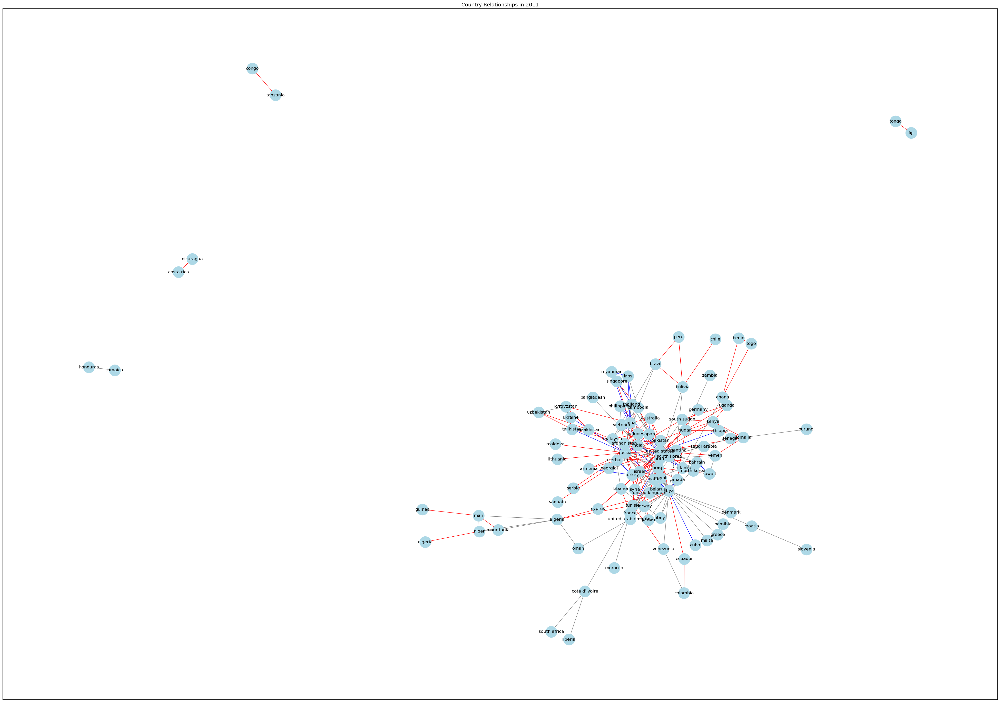

<Figure size 640x480 with 0 Axes>

In [261]:
year = 2011

df_2011 = df2[df2['Date'] == year].copy()

# Converting string representations of lists in 'Country Pairs' and 'Predicted Labels' to actual lists

df_2011['Country Pairs'] = df_2011['Country Pairs'].apply(ast.literal_eval)

# Initializing an empty graph

G = nx.Graph()

# Definning colors for labels

label_colors = {'neutral': 'blue' ,'ally': 'green' , 'conflict': 'red'}

# Iterating over the DataFrame to add edges

for index, row in df_2011.iterrows():
    country_pairs = row['Country Pairs']
    predicted_labels = row['Labels']

    for pair, label in zip(country_pairs, predicted_labels):
        
        # Extracting the first label if it's a list
        
        label = label[0] if isinstance(label, list) else label
        
        # Adding edges with color attribute based on the label
        
        G.add_edge(pair[0], pair[1], color=label_colors.get(label, 'grey'))  # Default to 'grey' if label not found

# Getting edge colors from the graph

edge_colors = [G[u][v]['color'] for u,v in G.edges()]

# Drawing the network

fig = plt.figure(figsize=(50, 35))
nx.draw_networkx(G, with_labels=True, edge_color=edge_colors, node_color='lightblue', node_size=1000, font_size=12)
plt.title("Country Relationships in 2011")
plt.show()
file_path = 'country_relationships_2011.jpg'

plt.savefig(file_path, bbox_inches='tight')
plt.close(fig)

## Hugging Face Models Approach

In [264]:
import os
os.environ['HF_HUB_DISABLE_SYMLINKS_WARNING'] = '1'

In [265]:
labeled_headlines_copy = labeled_headlines_703.copy()
print(type(labeled_headlines_copy['Country Pairs'].iloc[0]))

<class 'str'>


In [290]:
labeled_headlines_703
# Example of converting the first value in the 'Country Pair' column to a list
# Iterate over each value in the 'Country Pairs' column
for value in labeled_headlines_703['Country Pairs']:
    try:
        country_pair_list = ast.literal_eval(value)
        print(type(country_pair_list))
        
        # Iterate through each country pair in the list
        for country_pair in country_pair_list:
            print(type(country_pair))
            print(country_pair)
    except ValueError:
        # If the value cannot be evaluated as a list, print a message
        print(f"Not a list: {value}")


<class 'list'>
<class 'tuple'>
('united states', 'pakistan')
<class 'list'>
<class 'tuple'>
('russia', 'somalia')
<class 'list'>
<class 'tuple'>
('united states', 'pakistan')
<class 'list'>
<class 'tuple'>
('united states', 'pakistan')
<class 'list'>
<class 'tuple'>
('united states', 'pakistan')
<class 'list'>
<class 'tuple'>
('united states', 'pakistan')
<class 'list'>
<class 'tuple'>
('oman', 'algeria')
<class 'list'>
<class 'tuple'>
('united states', 'pakistan')
<class 'list'>
<class 'tuple'>
('united states', 'pakistan')
<class 'list'>
<class 'tuple'>
('united states', 'pakistan')
<class 'list'>
<class 'tuple'>
('india', 'pakistan')
<class 'list'>
<class 'tuple'>
('lebanon', 'israel')
<class 'list'>
<class 'tuple'>
('india', 'pakistan')
<class 'list'>
<class 'tuple'>
('somalia', 'ethiopia')
<class 'list'>
<class 'tuple'>
('united states', 'pakistan')
<class 'list'>
<class 'tuple'>
('united states', 'azerbaijan')
<class 'tuple'>
('united states', 'iran')
<class 'tuple'>
('azerbaijan

In [292]:
# Loading the model and tokenizer for nlptown/bert-base-multilingual-uncased-sentiment

model_name = "nlptown/bert-base-multilingual-uncased-sentiment"
model = AutoModelForSequenceClassification.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)
sentiment_analysis = pipeline("sentiment-analysis", model=model, tokenizer=tokenizer)

def extract_context_words(headline, country1, country2):
    start_index = headline.find(country1)
    end_index = headline.rfind(country2)
    context_words = headline[start_index + len(country1):end_index].strip()
    return context_words

def analyze_headline(headline, country_pairs):
    labels = []  # This will store labels for each country pair
    for country_pair in country_pairs:
        try:
            # Unpacking the nested structure of country pairs
            if isinstance(country_pair, (list, tuple)) and len(country_pair) == 1:
                country_pair = country_pair[0]  # Extracting the inner tuple
            if not isinstance(country_pair, (list, tuple)) or len(country_pair) != 2:
                raise ValueError(f"Invalid country pair format: {country_pair}")
            country1, country2 = country_pair

            context_words = extract_context_words(headline, country1, country2)
            sentiment = sentiment_analysis(context_words)
            # Handle nlptown model's star rating to label conversion
            star_rating = int(sentiment[0]['label'][0])  # Extract the first character and convert to int
            label = 'conflict' if star_rating in [1, 2] else 'neutral' if star_rating == 3 else 'ally'
            labels.append(label)
        except Exception as e:
            print(f"Error processing sentiment for {country_pair}: {e}")
            labels.append("error")  # Append "error" in case of an exception
    return labels

# Assuming labeled_headlines_703 is your DataFrame
df_copy = labeled_headlines_703.copy()

# Analyzing headlines
for index, row in df_copy.iterrows():
    country_pairs_str = row['Country Pairs']
    country_pairs = ast.literal_eval(country_pairs_str)  # Convert string representation to actual list/tuple
    headline = row['Headline']
    labels = analyze_headline(headline, country_pairs)
    df_copy.at[index, 'Labels'] = labels

# Display the updated DataFrame
df_copy[['Headline', 'Country Pairs', 'Labels']]

,Headline,Country Pairs,Labels
0,US drone strike kills seven militants in Pakistan: officials,"[('united states', 'pakistan')]",[conflict]
1,An-24 plane crew with 3 Russians released in Somalia.,"[('russia', 'somalia')]",[conflict]
2,Second US drone strike kills four militants in Pakistan,"[('united states', 'pakistan')]",[conflict]
3,US drone strikes kill 11 militants in Pakistan: officials,"[('united states', 'pakistan')]",[conflict]
4,Third US drone strike kills four militants in Pakistan,"[('united states', 'pakistan')]",[conflict]
...,...,...,...
8073,"Spain Vs. Italy LIVE Score, Updates: Euro 2012 Final Features Mario Balotelli, Andres Iniesta","[('italy', 'spain')]",[neutral]
8074,"'Call Me, Maybe' Wedding: Indian-Pakistani Wedding Pays Tribute To Carly Rae Jepsen Song (VIDEO)","[('india', 'pakistan')]",[ally]
8075,The Dominican Republic Wants You To Vacation Like A Kardashian,"[('dominican republic', 'dominica')]",[conflict]
8076,Guatemala Syphilis Study Lawsuit: Dismissal Despite United States Experiments On Natives In 1940s,"[('united states', 'guatemala')]",[conflict]


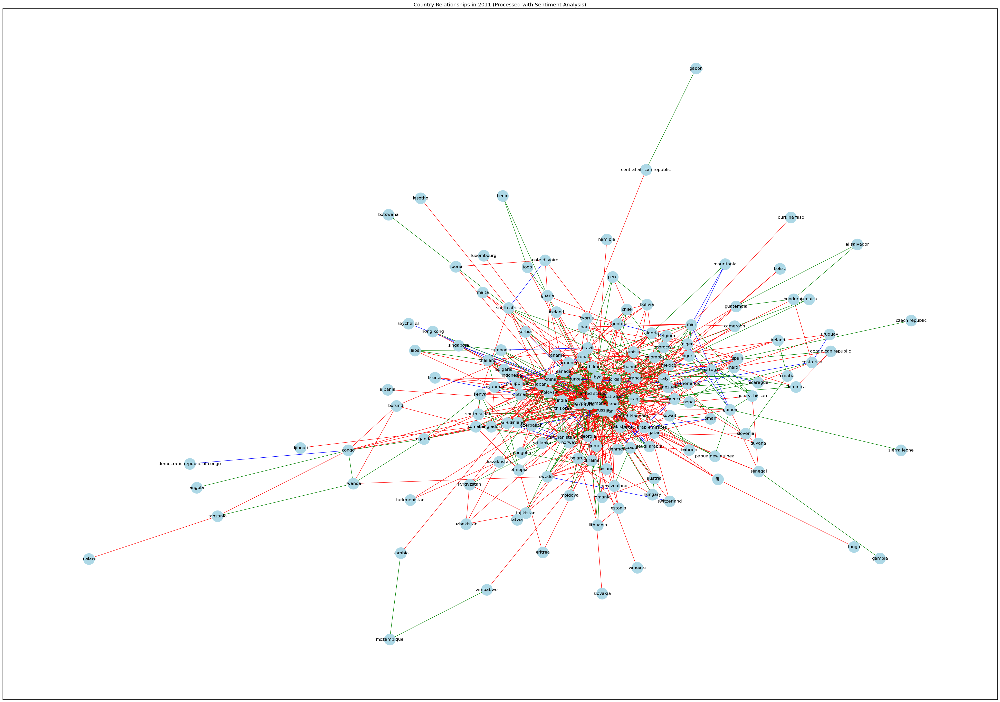

<Figure size 640x480 with 0 Axes>

In [293]:
year = 2011


df_2011 = df_copy.copy()
df_2011['Country Pairs'] = df_2011['Country Pairs'].apply(ast.literal_eval)

G = nx.Graph()


label_colors = {'neutral': 'blue', 'ally': 'green', 'conflict': 'red'}


for index, row in df_2011.iterrows():
    country_pairs = row['Country Pairs']
    predicted_labels = row['Labels']

    for pair, label in zip(country_pairs, predicted_labels):
        label = label[0] if isinstance(label, list) else label

        G.add_edge(pair[0], pair[1], color=label_colors.get(label, 'grey'))  # Default to 'grey' if label not found

edge_colors = [G[u][v]['color'] for u, v in G.edges()]

fig = plt.figure(figsize=(50, 35))
nx.draw_networkx(G, with_labels=True, edge_color=edge_colors, node_color='lightblue', node_size=1000, font_size=12)
plt.title("Country Relationships in 2011 (Processed with Sentiment Analysis)")
plt.show()
file_path = 'country_relationships_2011_processed.jpg'

plt.savefig(file_path, bbox_inches='tight')
plt.close(fig)


**Conclusion of Our Analysis:**

Our exploration into sentiment analysis of geopolitical relationships revealed that analyzing context words between country pairs in headlines yields more accurate predictions when the headlines feature a single country pair. The supervised learning approach, despite its potential, faced challenges due to imbalanced data, leading to a predisposition towards conflict predictions. Initial attempts with VADER sentiment analysis did not achieve satisfactory outcomes. We recommend pursuing a hybrid model that combines multiple analytical methods to enhance prediction accuracy for complex geopolitical narratives.

## Spacy

Using spaCy to extract country pairs from headlines, especially when dealing with named entities that refer to nationalities, groups, or regions (like "Indians" or "Burmese"), can be challenging for several reasons:

**Entity Recognition Limitations:** spaCy's Named Entity Recognition (NER) is designed to identify entities in text, including geopolitical entities (GPE) like countries and cities. However, it may not always correctly identify or differentiate between a country and a nationality. For instance, "Indians" might not be recognized as referring to "India" directly.

**Generalization Issues:** Named entities related to nationalities or ethnic groups ("NORP" category in spaCy) are not always directly mapped to their respective countries. For example, "Indians" refers to people from India, but without additional context, spaCy might not associate it directly with the country "India." This makes it difficult to extract clear, unambiguous country pairs for analysis.

In [298]:
nlp = spacy.load("en_core_web_lg")

def extract_countries(headline):
    doc = nlp(headline)
    countries = []
    for ent in doc.ents:
        if ent.label_ == 'GPE':
            countries.append(ent.text)
    return countries



doc1 = nlp("Indians and burmese worked")
sentence = "Indian, burmese and Iranians worked"
words = word_tokenize(sentence)
ps = PorterStemmer()  # Initialize PorterStemmer

for w in words:
    print(w, " : ", ps.stem(w))

print(extract_countries("pakistanis and russians made peace"))
print(extract_countries("Indians and burmese worked"))

Indian  :  indian
,  :  ,
burmese  :  burmes
and  :  and
Iranians  :  iranian
worked  :  work
[]
[]


## Cosine Similarity

In [302]:
list_of_countries = list(countries)
list_of_countries

['Afghanistan',
 'Albania',
 'Algeria',
 'Andorra',
 'Angola',
 'Antigua and Barbuda',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Brunei',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 "Cote d'Ivoire",
 'Cape Verde',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Congo',
 'Costa Rica',
 'Croatia',
 'Cuba',
 'Cyprus',
 'Czech Republic',
 'Democratic Republic of Congo',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Eswatini',
 'Ethiopia',
 'Fiji',
 'Finland',
 'France',
 'Gabon',
 'Gambia',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Grenada',
 'Guatemala',
 'Guinea',
 'Guinea-Bissau',
 'Guyana',
 'Haiti',
 'Honduras',
 '

# we wanted to show that cosine similiarity is not enough to extract the Entities correctly through the headline

Cosine similarity is a metric used to measure how similar two vectors are in a multidimensional space, often used in text analysis to compare the similarity between two texts. While it can be effective in identifying similar documents or finding matches based on keyword overlap, there are several reasons why cosine similarity alone may not be sufficient for accurately extracting country pairs from headlines:

  **Limited Contextual Understanding:** Cosine similarity calculates similarity based on the presence or absence of words and their frequencies within the texts being compared. It doesn't capture the context or the semantic relationships between words. For instance, "Indian" and "India" may be recognized as different terms without understanding that one refers to nationality and the other to the country.

  **Ambiguity and Polysemy:** Words can have multiple meanings depending on the context (polysemy), and some country names or nationalities can be ambiguous. Cosine similarity does not account for these nuances, potentially leading to inaccurate associations between entities. For example, "Turkey" could refer to the country or the bird, and without contextual analysis, the similarity measure might be misleading.

In [311]:


sentence = "Indian, pakistanis and Iranians worked"
y = "India"

sentence_t = word_tokenize(sentence)
y_t = word_tokenize(y)

sw = stopwords.words("English")

l1 = []
l2 = []

X_set = {word for word in sentence_t if word not in sw}
Y_set = {word for word in y_t if word not in sw}

vec = X_set.union(Y_set)
vec

for w in vec:
    if w in X_set: l1.append(1)
    else: l1.append(0)
    if w in Y_set: l2.append(1)
    else: l2.append(0)

In [312]:
l1

[1, 1, 1, 0, 1, 1]

In [313]:
l2

[0, 0, 0, 1, 0, 0]

In [314]:
c = 0
for i in range(len(vec)):
    c += l1[i]*l2[i]
    
cosine = c / float((sum(l1)*sum(l2))**0.5)

In [315]:
x = "Indian"
y = "India"
z = "Indonesian"
k = "pakistani"
l = "pakistan"

# Compare x vs y and z vs y
# CS for xy should be great

In [316]:
documents = [x,y,z]
cvector = CountVectorizer() 
matrix = cvector.fit_transform(documents)
matrix

<3x3 sparse matrix of type '<class 'numpy.int64'>'
	with 3 stored elements in Compressed Sparse Row format>

In [317]:
doc_matrix = matrix.todense()
df1 = pd.DataFrame(doc_matrix,columns=cvector.get_feature_names_out(),index=["x","y","z"])
df1

,india,indian,indonesian
x,0,1,0
y,1,0,0
z,0,0,1


In [318]:
cosine_similarity(df1,df1)
print(nltk.edit_distance([x], [y]))
list1 = [x,y,z,k,l]
for i in list1:
    for j in list1:
        print(f"LD between {i} and {j} = ",nltk.edit_distance([i],[j]))
        
# 0 - Highly related
# 1 - Highly not related

1
LD between Indian and Indian =  0
LD between Indian and India =  1
LD between Indian and Indonesian =  1
LD between Indian and pakistani =  1
LD between Indian and pakistan =  1
LD between India and Indian =  1
LD between India and India =  0
LD between India and Indonesian =  1
LD between India and pakistani =  1
LD between India and pakistan =  1
LD between Indonesian and Indian =  1
LD between Indonesian and India =  1
LD between Indonesian and Indonesian =  0
LD between Indonesian and pakistani =  1
LD between Indonesian and pakistan =  1
LD between pakistani and Indian =  1
LD between pakistani and India =  1
LD between pakistani and Indonesian =  1
LD between pakistani and pakistani =  0
LD between pakistani and pakistan =  1
LD between pakistan and Indian =  1
LD between pakistan and India =  1
LD between pakistan and Indonesian =  1
LD between pakistan and pakistani =  1
LD between pakistan and pakistan =  0


## Levenshtein Distance

Levenshtein distance, also known as edit distance, measures the minimum number of single-character edits (insertions, deletions, or substitutions) required to change one word into another. While it's useful for spelling corrections and fuzzy string matching, relying solely on Levenshtein distance for recognizing entities, especially country names or nationalities in text, has several limitations:

  **Contextual Ignorance:** Levenshtein distance measures the textual similarity based on character changes without understanding the context or meaning of the words. For entity recognition, especially in natural language processing (NLP), understanding the context in which a word is used is crucial.

  **Similarity Limitation:** Words that are close in terms of character composition but vastly different in meaning may be incorrectly matched. For instance, "mali" and "mail" have a small Levenshtein distance but refer to entirely different meanings

  **Different Lengths Issue:** Levenshtein distance can be less effective for words of significantly different lengths. For example, "United States of America" and "USA" refer to the same entity but would have a high Levenshtein distance due to their length difference, despite being conceptually identical. for example : "The turkey wandered into the backyard" - In this sentence, "turkey" refers to the bird.

In [320]:
distance("Mali", "Mail",score_cutoff=2)
distance("indonesian", "india",score_cutoff=2)
distance("burmese","burma",score_cutoff=1)

3

# Research conclusion

This research project embarked on an ambitious journey to predict GDP per capita across various countries by leveraging a wide array of socio-economic, health, and demographic indicators. Through meticulous data collection, preprocessing, and exploratory analysis, we identified key features that exhibit significant correlations with GDP per capita, including health expenditure, fertility rates, employment sectors, literacy rates, population density, median age, and more.

Our analysis revealed nuanced relationships between these indicators and GDP per capita, shedding light on the complex dynamics of economic development. For instance, we observed a positive correlation between health expenditure and GDP per capita, highlighting the critical role of healthcare investment in economic prosperity. Conversely, fertility rates and employment in agriculture showed negative correlations with GDP per capita, reflecting the transition towards service-oriented economies and smaller family sizes in more developed regions.

To tackle the challenge of predicting GDP per capita, we employed a range of machine learning models, including XGBoost, LightGBM, Random Forest, CatBoost, SARIMAX, ARIMA, and Prophet, each offering unique insights into the data's underlying patterns. Our findings indicate that models like CATBoost and LGBM achieved the best performance, underscored by their low MSE, MAE, and high R² values. This suggests that these models effectively captured the complex relationships between our chosen indicators and GDP per capita.

Interestingly, the models highlighted the importance of various features differently, with "Year" and "Entity" being universally recognized as crucial predictors. This underscores the significant impact of temporal and geographical factors on economic outcomes. Additionally, indicators such as under-five mortality rate, population density, and the novel "Correlation with Ideal" feature emerged as influential, suggesting that these aspects embody critical patterns for predicting economic performance.

Beyond traditional socio-economic factors, we explored the potential of sentiment analysis in enriching our dataset. By analyzing the sentiment of news headlines regarding international relations, we aimed to incorporate geopolitical dynamics into our models. Although challenging, this approach hinted at the intricate ways global narratives and country relationships can influence economic indicators.

In conclusion, this project not only advances our understanding of the determinants of GDP per capita but also highlights the power of machine learning in uncovering complex economic patterns. The superior performance of gradient boosting models like CATBoost and LGBM, in particular, underscores the value of advanced ensemble techniques in economic forecasting. As we move forward, integrating more diverse data sources, such as geopolitical sentiments, and exploring novel modeling approaches will be crucial in refining our predictions and gaining deeper insights into the drivers of economic prosperity.